# Vanilla GAN for Generating MNIST Digit

##Learning Objective

This notebook implements a simple Vanilla GAN to create MNIST digits using PyTorch. You will build the generator and discriminator components of a GAN from scratch. You will create generator and discriminator loss functions. During the training the model will display how well it can generate digits and you will see how it improves over time. Before doing this notebook, it is recommended that you will do [Deep Learnig using MNIST Dataset](https://colab.research.google.com/drive/1ooaKrj1YBzzfCXPXKpzeDR1l7tei3Yba?usp=sharing)

This colab will run much faster on GPU. To use a Google Cloud GPU:

1.   Go to Runtime > Change runtime type.
2.   Click Hardware accelerator.
3.   Select GPU and click Save.
4.   Click Connect in the upper right corner and select Connect to hosted runtime.

##What are Generative Adversarial Network?

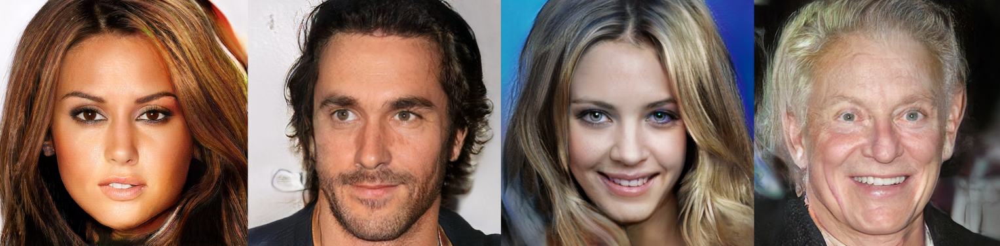

Figure 1: Images generated by a GAN created by [NVIDIA](https://arxiv.org/pdf/1710.10196.pdf).

Generative Adversarial Networks a.k.a GANs, are popular generative neural networks. GANs have demonstrated their effectiveness in nearly every problem in computer vision. The GAN works by training a pair of networks, Generator and Discriminator, with competing loss terms. As an analogy, we can think of these networks as an art-forger and the other, an art-expert. In GAN literature the Generator is the art-forger and the Discriminator is the art-expert. The Generator is trained to produce fake images (forgeries) to deceive the art-expert (Discriminator). The Discriminator which receives both the real images and fake images tries to distinguish between them to identify the fake images. The Generator uses the feedback from the Discriminator to improve its generation. Both the models are trained simulataneously and are always in competition with each other. This competition between the Generator and Discriminator drives them to improve their respective models continuously. The model converges when the Generator produces fake images that are indistinguishable from the real images.


In this setup, the Generator does not have access to the real images whereas the Discriminator has access to both the real and the generated fake images.


Let us define Discriminator D that takes an image as input and produces a number between **0 and 1** as output and a Generator G that takes random signal as input and outputs a fake image. In practice, G and D are trained alternately i.e., For a fixed generator G, the Discriminator D is trained to classify the training data as real (output a value close to 1) or fake(output a value close to 0). Subsequenty, we freeze the Discriminator and train the Generator G to produce an image (fake) that outputs a value close to 1 (real) when passed through the Discriminator D. Thus, if the Generator is perfectly trained then the Discriminator D will be maximally confused by the images generated by G and predict 0.5 for all the inputs.  

![GANArchitecture.png](https://drive.google.com/uc?export=view&id=1KFHF8MYkjbJjIW3S5g-WFGkyl8Z6Wc_D)



Figure 2: GAN Architecture for generating MNIST.

To implement a GAN, we basically require 5 components:


1.   Real Dataset (real distribution)
2.   Low dimensional random signal that is input to the Generator to produce fake images
3.   Generator that generates fake images
4.   Discriminator that acts as an expert to distinguish real and fake images
5.   Training loop where the competition occurs and models improve themselves

## Imports
Before writing any code in Python, we need to import the necessary libraries and modules that we need.

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader
from torchvision import transforms, datasets

import matplotlib.pyplot as plt
import time
start_time = time.time()

## Checks for the availability of GPU
We will also create a device which can be used to move the data and models to a GPU, if one is available.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

## Define Helper Functions

We will define some helper functions which can be used later.

In [ ]:
def real_data_target(size):
    """
       Creates an array of true label of (batch_size, 1).
       @Param
       size : int. Batch size.
    """
    data = torch.ones(size, 1).to(device)
    return data

def fake_data_target(size):
    """
       Creates an array of false label of (batch_size, 1).
       @Param
       size : int. Batch size.
    """
    data = torch.zeros(size, 1).to(device)
    return data

def imgs_to_vec(imgs, img_size=28):
    """
       Returns a new tensor with the same data as imgs but of a different shape (batch_size, 28*28).
       @Param
       imgs : tensor. The tensor of a batch of images of size (batch_size, 1, 28, 28)
    """
    return imgs.view(imgs.size(0), img_size * img_size)

def vec_to_imgs(vec):
    """
       Returns a new tensor with the same data as vec but of a different shape (batch_size, 1, 28, 28).
       @Param
       imgs : tensor. The tensor of size (batch_size, 28*28)
    """
    return vec.view(vec.size(0), 1, 28, 28)

def noise(size, batch_size=128):
    """
       Returns a tensor filled with random numbers from a standard normal distribution of (size, batch_size).
       @Param
       size : int
       batch_size : int
    """
    n = torch.randn(size, batch_size)
    return n

log_data = []

def log(e, E, b, B, de, ge):
    row = {
        'epoch': e, 'epochs': E,
        'batch': b, 'batches': B,
        'derror': de, 'gerror': ge,
    }

def display_logs(e, E, b, B, de, ge, dr, df, tps, fns, fps, tns, tprs,fprs, batch_size=128):
    print("Epoch {}/{} ({:.1f}%):".format(e+1, E, (e/E)*100))
    print("[{}/{}] ({:.1f}%)".format(b*batch_size, B*batch_size, (b/B)*100))
    print("D Error: {:.4f} G Error: {:.4f}".format(de, ge))
    print("D Real: {:.4f} D Fake: {:.4f}".format(dr.mean().item(), df.mean().item()))
    print("D_TP: {:.4f}, D_FN: {:.4f}, D_FP: {:.4f}, D_TN: {:.4f}, D_TPR: {:.4f}, D_FPR: {:.4f}".format(tps[-1], fns[-1], fps[-1], tns[-1], tprs[-1], fprs[-1]))

def display_images(imgs):
    """
       Creat a 4 * 4 subplots to view the first 16 images of a batch.
       @Param
       imgs : tensor. A tensor of images of size [batchsize, 28*28]
    """
    fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(8,8))
    count = 0
    for y in range(4):
        for x in range(4):
            img = imgs[count].view(28, 28)
            axs[y][x].imshow(img, cmap="gray")
            count += 1
    plt.show()

## Setup Data
We will use the torch vision MNIST dataset.


1.   Normalize the images to range [-1, 1]
2.   Store in '/kaggle/working/mnist/'
3.   Load the data into a data loader



In [ ]:
def mnist_data():
    compose = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])]) #Transforms the images to range [-1, 1]
    out_dir = '/kaggle/working/mnist/'
    return datasets.MNIST(root=out_dir, train=True,
                          transform=compose, download=True)

In [ ]:
data = mnist_data()
data_loader = DataLoader(data, batch_size=128, shuffle=True)

First 16 digit images in the first batch:
img_batch.shape: torch.Size([128, 1, 28, 28])
label_batch.shape: torch.Size([128])
label_batch: tensor([7, 0, 3, 8, 3, 1, 9, 4, 9, 2, 9, 6, 7, 0, 1, 1])


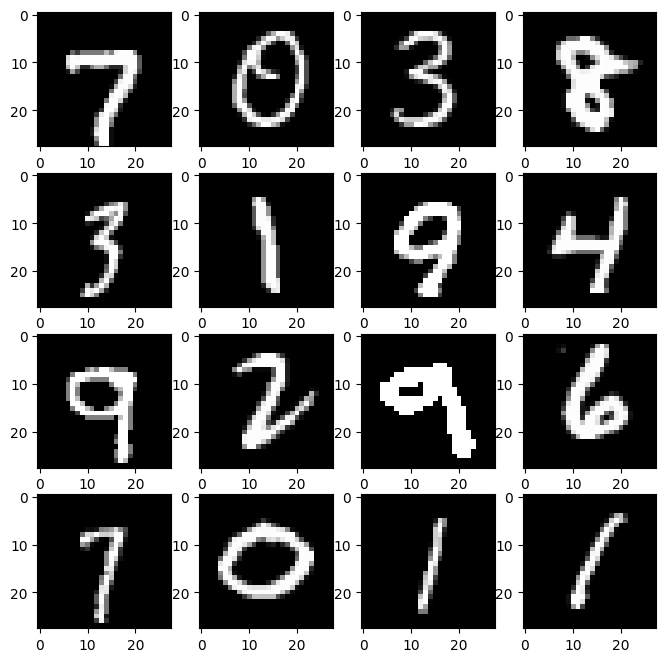

In [ ]:
for img_batch, label_batch in data_loader:
    print('First 16 digit images in the first batch:')
    print("img_batch.shape:", img_batch.shape)
    print("label_batch.shape:", label_batch.shape)
    print("label_batch:", label_batch[:16])
    display_images(img_batch)
    break

In [ ]:
#torch.save(img_batch[:,:,3])

## Discriminator Architecture

In Vanilla GAN, the Generator and the Discriminator are simple multi-layer perceptrons.

The discriminator in a GAN is simply a classifier. It tries to distinguish real data from the data created by the generator. It could use any network architecture appropriate to the type of data it's classifying. Let's define Discriminator with the following architecture.

1.   Linear Layer (input_size -> 512)
2.   LeakyReLU with negative slope = 0.2
3.   Dropout with probability of an element to be zeroed = 0.3
4.   Linear Layer (512 -> 256)
5.   LeakyReLU with negative slope = 0.2
6.   Dropout with probability of an element to be zeroed = 0.3
7.   Linear Layer (256 -> 1)
8.   Sigmoid activation function



###Leaky ReLU
The advantage of using Leaky ReLU and replacing the horizontal line is that we avoid zero gradients. This is because in this case we no longer have “dead” neurons that are always zero and thus no longer contribute to the training.

$$LeakyReLU(x)=max(0,x)+negative\_slope∗min(0,x)$$

![](https://drive.google.com/uc?id=1kLN-sr53OAiVPU5maFHz7fnkF131kwSb)

###Dropout
During training, randomly zeroes some of the elements of the input tensor with probability p. The zeroed elements are chosen independently for each forward call and are sampled from a Bernoulli distribution. Each channel will be zeroed out independently on every forward call. This has proven to be an effective technique for regularization and preventing the co-adaptation of neurons as described in the paper [Improving neural networks by preventing co-adaptation of feature detectors](https://arxiv.org/abs/1207.0580).
Furthermore, the outputs are scaled by a factor of $\frac{1}{1-p}$ during training. This means that during evaluation the module simply computes an identity function.

###Sigmoid
The main reason why we use sigmoid function is because it exists between (0 to 1). Therefore, it is especially used for models where we have to predict the probability as an output. Since probability of anything exists only between the range of 0 and 1, sigmoid is the right choice. The function is differentiable. In this case, the discriminator is outputting the probablity that the input image is real.
$$ h_ \theta (x) =  \frac{\mathrm{1} }{\mathrm{1} + e^- \theta^Tx }  $$


![](https://drive.google.com/uc?id=1w-mAD-nXuiFkBbo-gsKOYA3feiDeoA_N)

In [ ]:
class Discriminator(nn.Module):
    """ 3 hidden layer discriminative nn. """
    def __init__(self, n_out=1, img_size=28):
        super(Discriminator, self).__init__()

        self.hidden0 = nn.Sequential(
            nn.Linear(img_size * img_size, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
        )
        self.out = nn.Sequential(
            nn.Linear(256, n_out),

        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x

In [ ]:
#n = torch.randn(size, batch_size)
rn = noise(16)

In [ ]:
print(rn.shape)

torch.Size([16, 128])


In [ ]:
discriminator = Discriminator().to(device)
discriminator

Discriminator(
  (hidden0): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (hidden1): Sequential(
    (0): Linear(in_features=1024, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (hidden2): Sequential(
    (0): Linear(in_features=512, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (out): Sequential(
    (0): Linear(in_features=256, out_features=1, bias=True)
  )
)

## Generator Architecture
The generator part of a GAN learns to create fake data by incorporating feedback from the discriminator. It learns to make the discriminator classify its output as real. Let's define *Generator* with the following architecture.


1.   Linear layer (batch_size -> 256)
2.   LeakyReLU (works well for the Generators, we will use negative_slope=2)
3.   Linear Layer (256 -> 512)
4.   LeakyReLU
5.   Linear Layer (512 -> 1024)
6.   LeakyReLU
7.   Linear Layer (1024 -> 784) (784 is the MNIST image size 28*28)
8.   TanH (To scale the generated images to [-1,1], the same as real images)

- TanH activation: https://pytorch.org/docs/stable/nn.html#tanh

###Tanh
Another activation function that is common in deep learning is the tangent hyperbolic function simply referred to as tanh function. It is calculated as follows:
$$tanh(x) = \frac{e^x - e^{-x}}{e^x + e^{-x}} = \frac{1 - e^{-2x}}{1 + e^{-2x}}$$
The output range of the tanh function is (-1, 1) and presents a similar behavior with the sigmoid function. The main difference is the fact that the tanh function pushes the input values to 1 and -1 instead of 1 and 0. The tanh activation function results in higher values of gradient during training and higher updates in the weights of the network. So, if we want strong gradients and big learning steps, we should use the tanh activation function.


![image](https://drive.google.com/uc?id=1eHyVr7fAtC3LTzsafPFvb4DnObUteur8)

In [ ]:
class Generator(nn.Module):
    """ 3 hidden layer generative nn. """
    def __init__(self, batch_size=128, img_size=28):
        super(Generator, self).__init__()

        self.hidden0 = nn.Sequential(
            nn.Linear(batch_size, 256),
            nn.LeakyReLU(0.2),
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2),
        )
        self.out = nn.Sequential(
            nn.Linear(1024, img_size * img_size),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x

In [ ]:
generator = Generator().to(device)

Let's input a tensor of random numbers of size [16, 128] into the generator, and generate some fake images. The Generator is not trained yet so the images will be just some random noise.

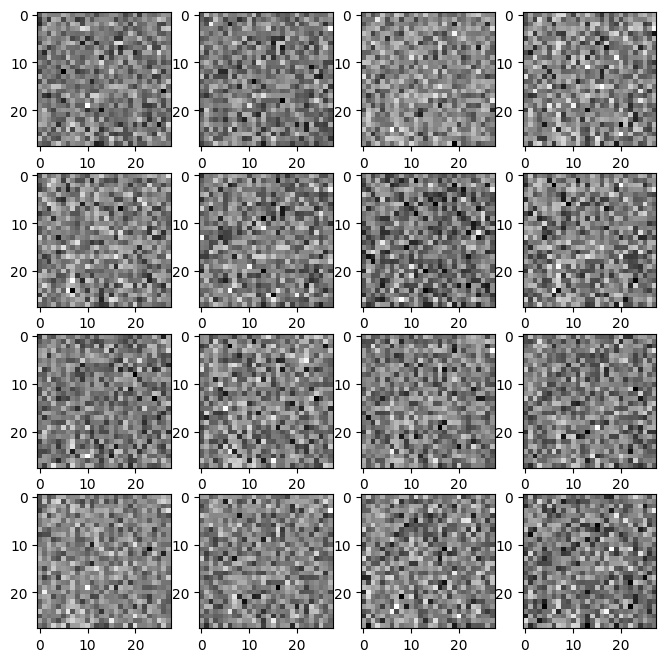

torch.Size([16, 1, 28, 28])


In [ ]:
ns = noise(16)
y = generator(ns.to(device))
gen_imgs = vec_to_imgs(y).detach().cpu()
display_images(gen_imgs)
print(gen_imgs.shape)

## Pre-training Setup
Optimizers for training the Generator and the Discriminator. The below setup generates good images with the architecture.
Feel free to adjust the optimizer settings.

Adam optimizer: https://pytorch.org/docs/stable/optim.html#torch.optim.Adam

In [ ]:
EPOCHS = 200
loss = nn.BCEWithLogitsLoss()
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)

### GAN Objective Function

This is the objective function of GAN. The goal of the generator is trying to minimize the function, while the discriminator tries to maximize it.

$$E_x[\log(D(x))] + E_z[\log(1-D(G(z)))]$$

*   D(x) is is the discriminator's estimate of the probability for real images is real.
*   E_x is the expected value over all real images.
*   D(G(z)) is the discriminator's estimate of the probability that a fake instance is real.
*   Ez is the expected value over all random inputs to the generator

Note that the generator has no effect on log(D(x)) term in the function, so, for the generator, minimizing the loss is equivalent to minimizing log(1-D(G(z))).

We will use the Binary cross entropy loss function to train the GAN.

## Training the Discriminator

![picture](https://drive.google.com/uc?id=1eRzcDla8_fhlCGcURtClBJB8N3NU16DP)

1.   Clear the gradients of the Discriminator optimizer.
2.   Estimate pred_real by passing images through the Discriminator.
3.   Compute the Discriminator error_real by calling loss_func function.
4.   Compute the gradients by backpropagating through the computational graph.
5.   Estimate pred_fake by passing the fake images through the Discriminator.
6.   Compute the Discriminator loss by calling loss_func function.
7.   Compute the gradients by backpropagating through the computational graph.
8.   Update the Discriminator parameters.

In [ ]:
"""
def train_discriminator(dmodel, optimizer, loss_func, real_data, fake_data):
    optimizer.zero_grad()
    # Train on real data
    pred_real = dmodel(real_data.to(device))
    loss_real = loss_func(pred_real, real_data_target(real_data.size(0)))
    loss_real.backward()
    # Train on fake data
    pred_fake = dmodel(fake_data.to(device))
    loss_fake = loss_func(pred_fake, fake_data_target(real_data.size(0)))
    loss_fake.backward()
    # Update weights
    optimizer.step()
    # Return error
    return loss_real + loss_fake, pred_real, pred_fake
"""

def train_discriminator(dmodel, optimizer, loss_func, real_data, fake_data):
    optimizer.zero_grad()
    # Train
    # Input real images into discriminator and classify if images are real or fake
    pred_real = dmodel(real_data.to(device))
    # Input fake images into discriminator and classify if images are real or fake
    pred_fake = dmodel(fake_data.to(device))
    # Concatenate the predictions of real and fake images
    pred = torch.cat((pred_real, pred_fake))
    # Concatenate the labels of real and fake images
    targets = torch.cat((real_data_target(real_data.size(0)), fake_data_target(real_data.size(0))))
    # Put predictions and labels into loss function
    loss = loss_func(pred, targets)
    # Backpropagate the discriminator
    loss.backward()
    # Update weights of the discriminator
    optimizer.step()
    # Compute performance indicators
    pred_real_rounded = torch.round(pred_real)
    pred_fake_rounded = torch.round(pred_fake)
    TP = (pred_real_rounded == 1.).sum(dim=0)
    FN = pred_real_rounded.shape[0] - TP
    FP = (pred_fake_rounded == 1.).sum(dim=0)
    TN = pred_fake_rounded.shape[0] - FP
    TPR = TP / (TP + FN)
    FPR = FP / (FP + TN)

    return loss, pred_real, pred_fake, TP, FN, FP, TN, TPR, FPR



## Training the Generator

![](https://drive.google.com/uc?id=16vIgiRW5jS-wUwB4bm88rBF_p94NjoQa)

1.   Clear the gradients of the Generator.
2.   Estimate fake_data by passing the fake images through the Discriminator.
3.   Compute the Generator loss by caling loss_func.
4.   Compute the gradients by backpropagating through the computational graph.
5.   Update the Generator parameters.

In [ ]:
def train_generator(dmodel, optimizer, loss_func, fake_data):
    #clear gradients
    optimizer.zero_grad()
    #in the beginning, the generator is lousy, the discriminator can identify well
    #pred below will then be close to a vector of zero
    pred = dmodel(fake_data.to(device))
    #now, we compare pred with a vector of ones
    #in the beginning, as stated above, pred will be close to a vector of zeros
    #therefore, we will have large cross entropy
    #and the training process will try to improve
    #later on, the value of loss of generator will descrease as the generator performs better
    loss = loss_func(pred, real_data_target(pred.size(0)))
    loss.backward()
    optimizer.step()
    return loss

## Training GAN
1.   Loop over epochs and batches of real images.
2.   Reshape the batch of real images into [batch, 28*28]
3.   Generate fake images by passing random numbers into the Generator. Also, .detach() the fake images as we don't compute the gradients of the Generator when optimizing Discriminator.
4.   Train the Discriminator by passing discriminator, d_optimizer, loss, real_data, fake_data into train_discriminator.
5.   Generate fake images by passing random numbers into the Generator without calling .detach().
6.   Train th Generator by passing discriminator, g_optimizer, loss, fake_data into train_generator.



In [ ]:
NUM_BATCHES = len(data_loader)
DISPLAY_EVERY = 2000
noise_for_img_display = noise(16, 128).to(device)
d_losses, g_losses, real_scores, fake_scores, TPs, FNs, FPs, TNs, TPRs, FPRs= [], [], [], [], [], [], [], [], [], []

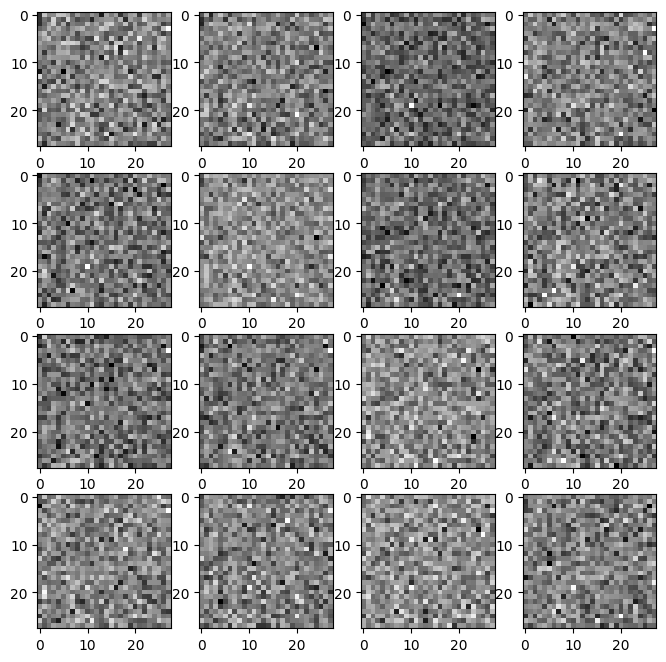

Epoch 1/200 (0.0%):
[0/60032] (0.0%)
D Error: 0.6909 G Error: 0.6616
D Real: 0.0751 D Fake: 0.0630
D_TP: 0.0000, D_FN: 128.0000, D_FP: 0.0000, D_TN: 128.0000, D_TPR: 0.0000, D_FPR: 0.0000


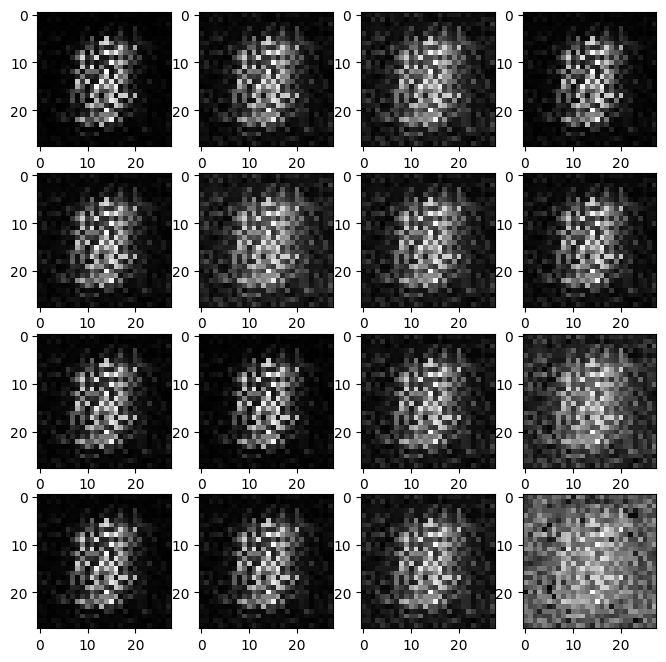

Epoch 2/200 (0.5%):
[0/60032] (0.0%)
D Error: 0.7895 G Error: 1.4642
D Real: 0.3582 D Fake: -0.5110
D_TP: 20.0000, D_FN: 108.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.1562, D_FPR: 0.1250


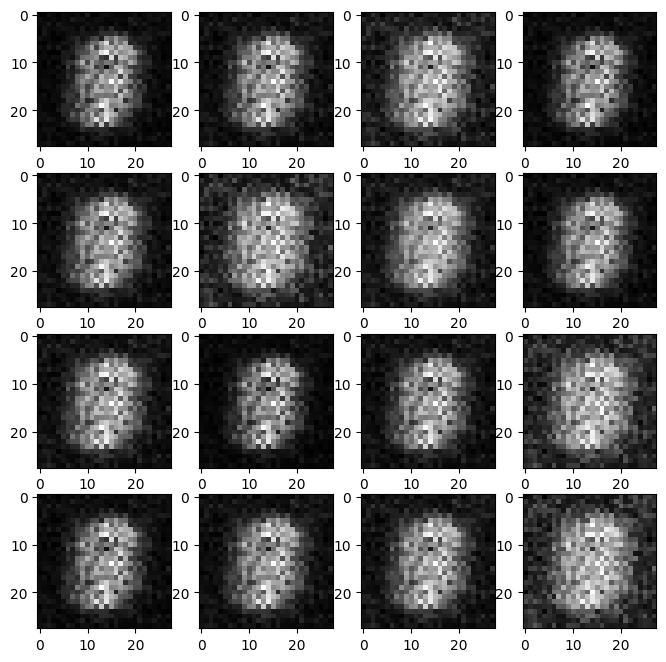

Epoch 3/200 (1.0%):
[0/60032] (0.0%)
D Error: 1.0345 G Error: 1.0582
D Real: 0.0910 D Fake: 0.3651
D_TP: 22.0000, D_FN: 106.0000, D_FP: 34.0000, D_TN: 94.0000, D_TPR: 0.1719, D_FPR: 0.2656


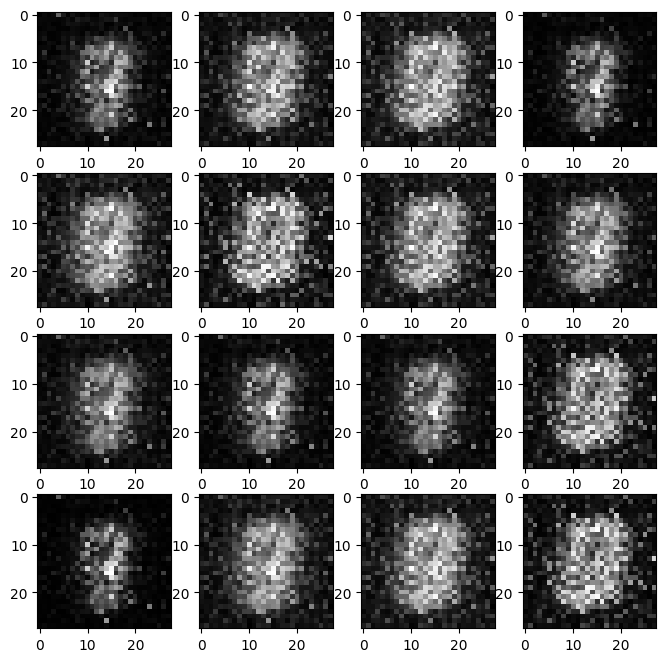

Epoch 4/200 (1.5%):
[0/60032] (0.0%)
D Error: 0.1537 G Error: 2.5444
D Real: 4.2928 D Fake: -2.7593
D_TP: 7.0000, D_FN: 121.0000, D_FP: 0.0000, D_TN: 128.0000, D_TPR: 0.0547, D_FPR: 0.0000


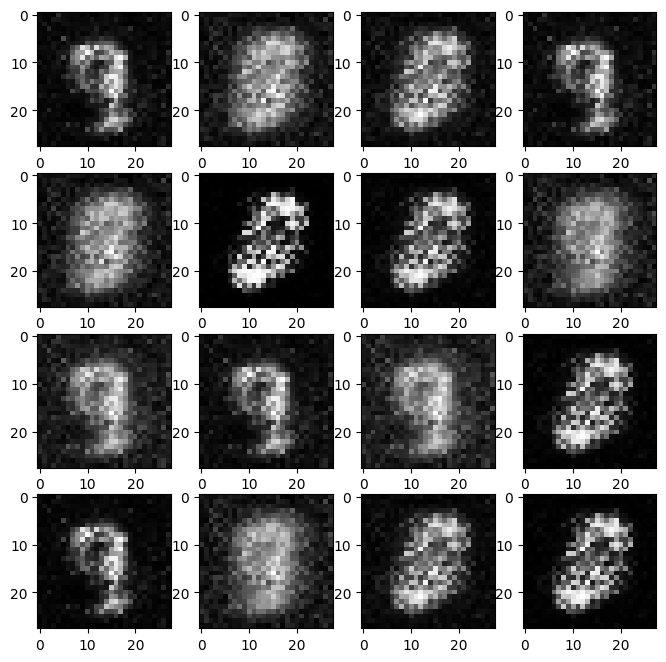

Epoch 5/200 (2.0%):
[0/60032] (0.0%)
D Error: 0.3787 G Error: 1.8290
D Real: 4.7393 D Fake: -1.2689
D_TP: 11.0000, D_FN: 117.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.0859, D_FPR: 0.0938


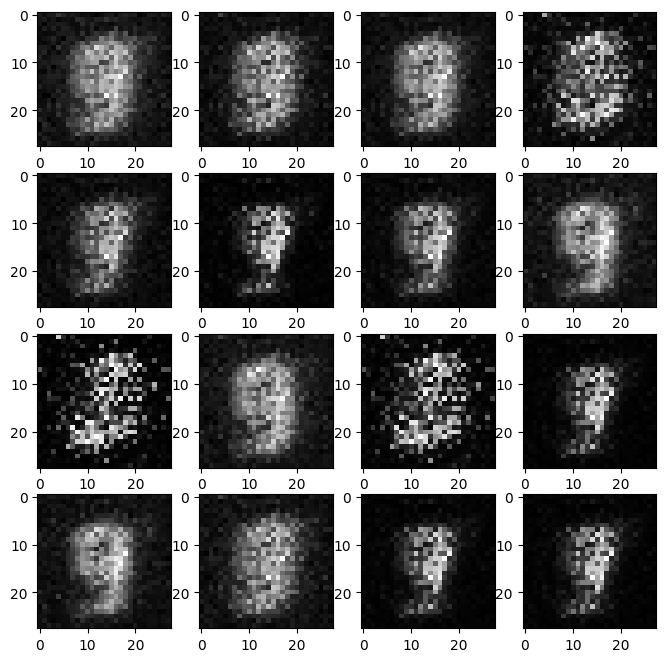

Epoch 6/200 (2.5%):
[0/60032] (0.0%)
D Error: 0.0927 G Error: 3.8271
D Real: 6.2202 D Fake: -3.0868
D_TP: 7.0000, D_FN: 121.0000, D_FP: 0.0000, D_TN: 128.0000, D_TPR: 0.0547, D_FPR: 0.0000


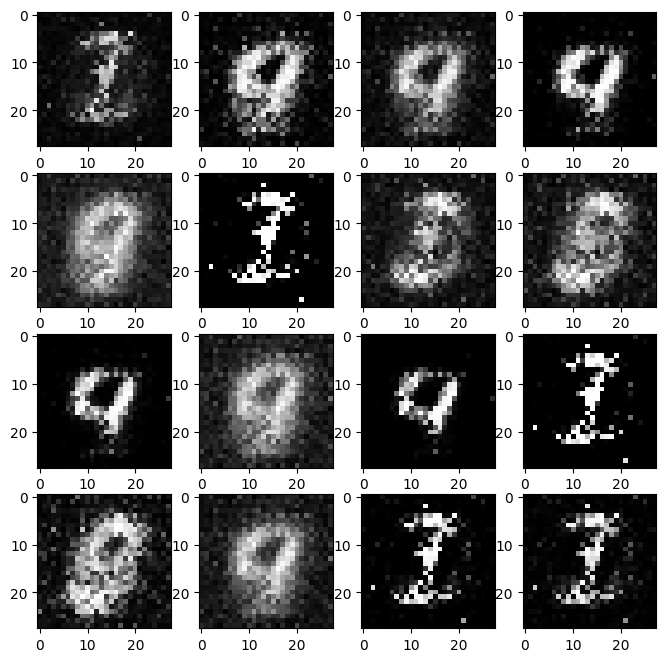

Epoch 7/200 (3.0%):
[0/60032] (0.0%)
D Error: 0.2602 G Error: 2.5274
D Real: 4.2050 D Fake: -1.9247
D_TP: 12.0000, D_FN: 116.0000, D_FP: 1.0000, D_TN: 127.0000, D_TPR: 0.0938, D_FPR: 0.0078


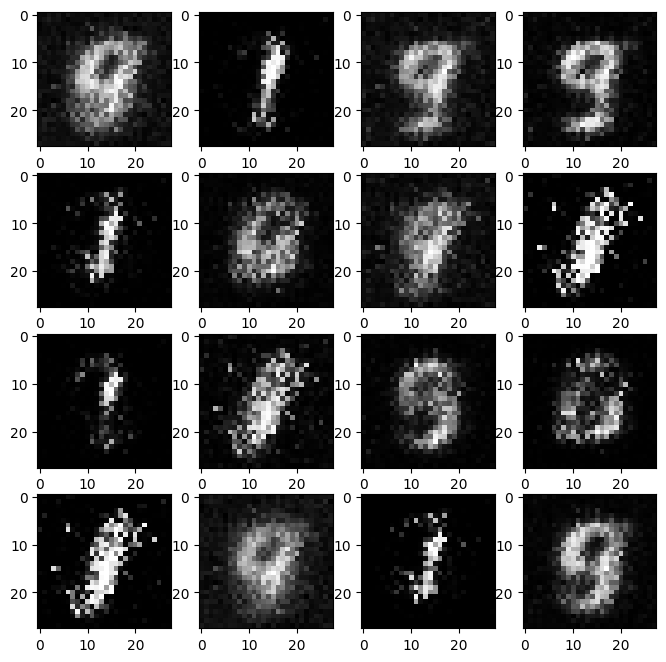

Epoch 8/200 (3.5%):
[0/60032] (0.0%)
D Error: 0.3449 G Error: 2.5192
D Real: 3.8027 D Fake: -1.7986
D_TP: 8.0000, D_FN: 120.0000, D_FP: 3.0000, D_TN: 125.0000, D_TPR: 0.0625, D_FPR: 0.0234


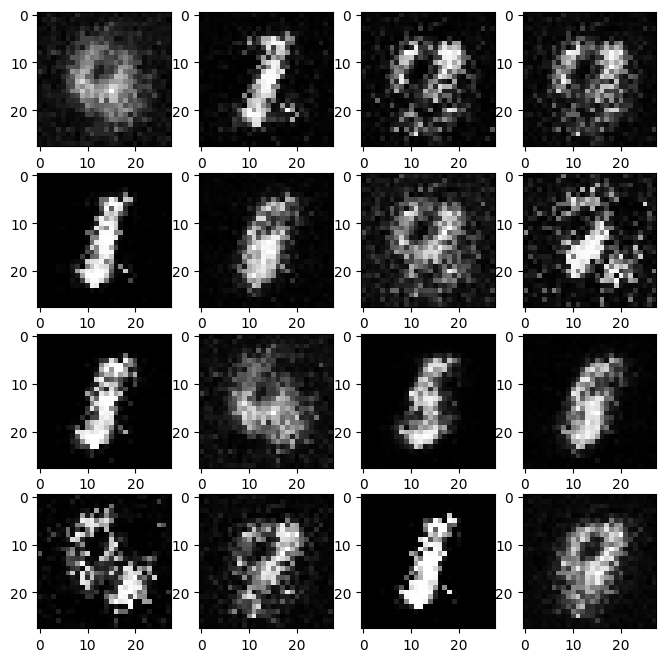

Epoch 9/200 (4.0%):
[0/60032] (0.0%)
D Error: 0.4351 G Error: 2.3072
D Real: 2.5113 D Fake: -2.0227
D_TP: 8.0000, D_FN: 120.0000, D_FP: 4.0000, D_TN: 124.0000, D_TPR: 0.0625, D_FPR: 0.0312


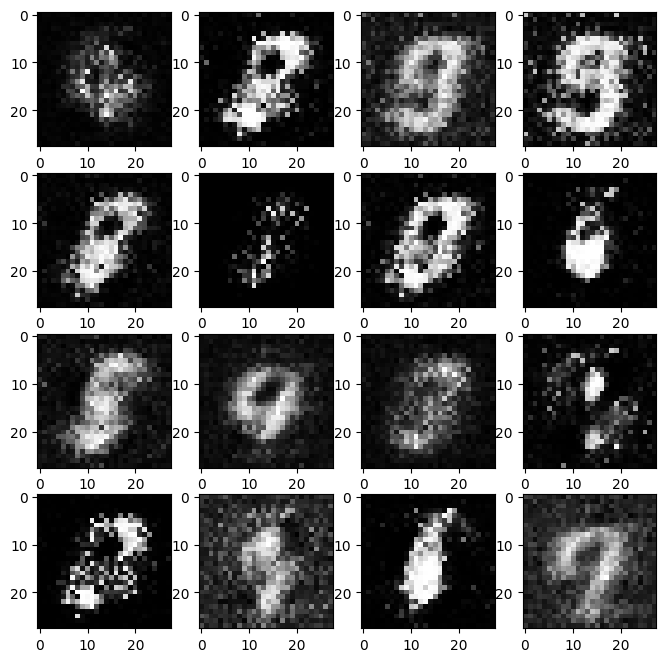

Epoch 10/200 (4.5%):
[0/60032] (0.0%)
D Error: 0.2152 G Error: 3.1104
D Real: 4.4297 D Fake: -2.5621
D_TP: 6.0000, D_FN: 122.0000, D_FP: 1.0000, D_TN: 127.0000, D_TPR: 0.0469, D_FPR: 0.0078


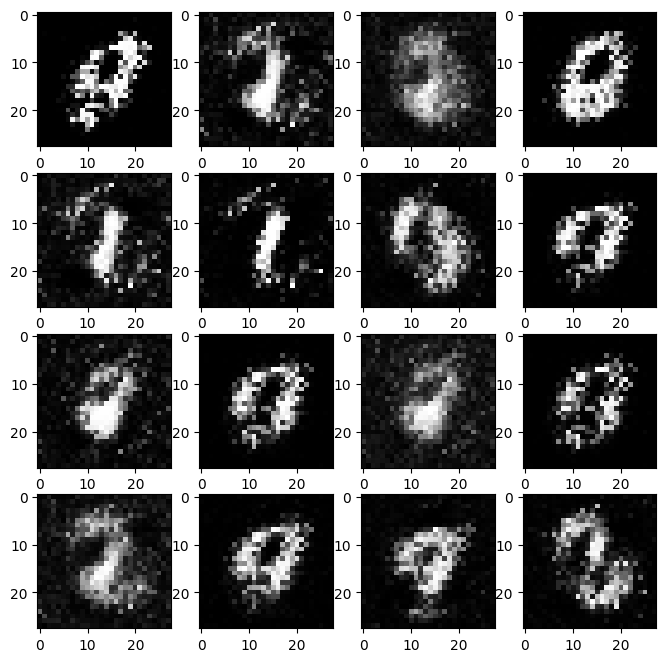

Epoch 11/200 (5.0%):
[0/60032] (0.0%)
D Error: 0.2258 G Error: 3.5064
D Real: 5.1255 D Fake: -2.7270
D_TP: 7.0000, D_FN: 121.0000, D_FP: 4.0000, D_TN: 124.0000, D_TPR: 0.0547, D_FPR: 0.0312


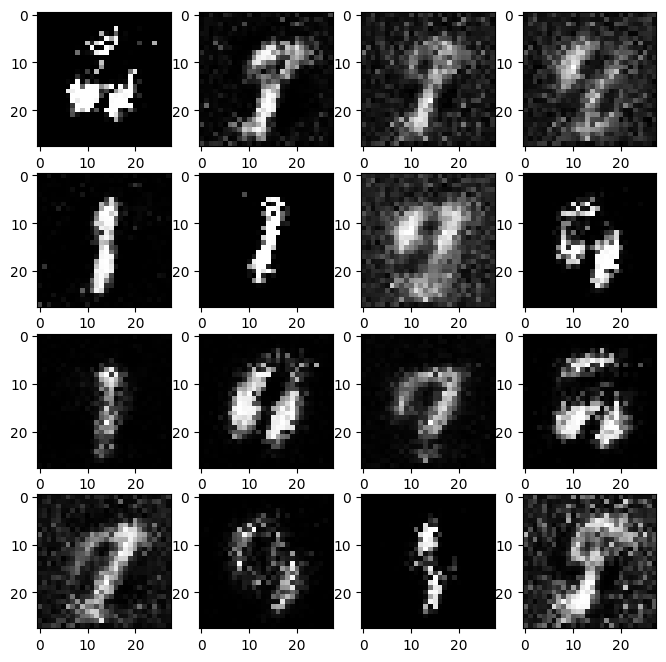

Epoch 12/200 (5.5%):
[0/60032] (0.0%)
D Error: 0.2188 G Error: 2.5478
D Real: 3.7240 D Fake: -2.3153
D_TP: 11.0000, D_FN: 117.0000, D_FP: 3.0000, D_TN: 125.0000, D_TPR: 0.0859, D_FPR: 0.0234


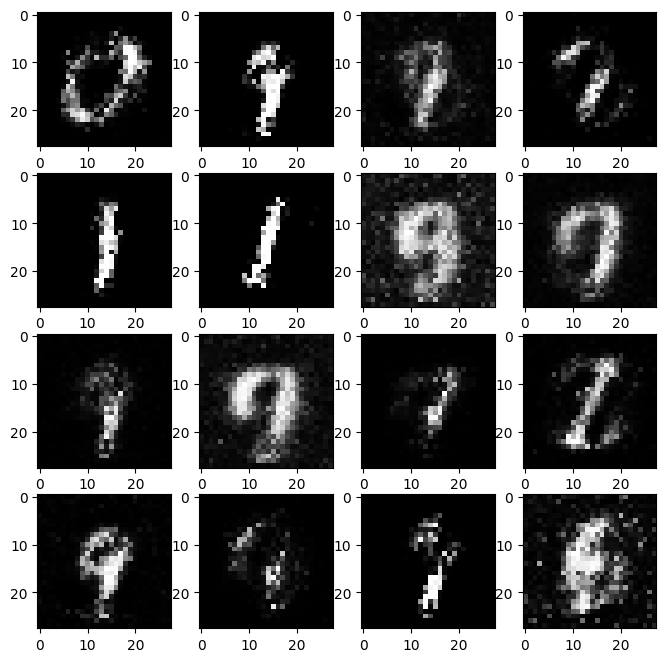

Epoch 13/200 (6.0%):
[0/60032] (0.0%)
D Error: 0.1606 G Error: 2.9291
D Real: 5.6047 D Fake: -2.2132
D_TP: 7.0000, D_FN: 121.0000, D_FP: 4.0000, D_TN: 124.0000, D_TPR: 0.0547, D_FPR: 0.0312


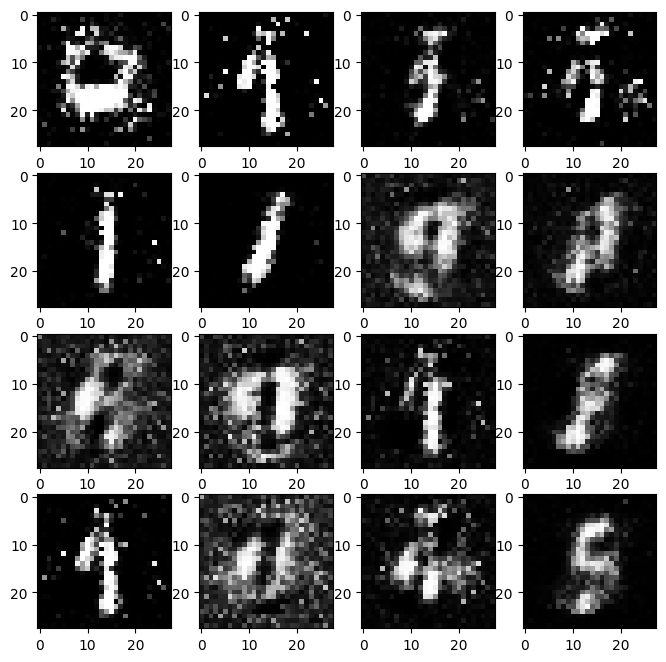

Epoch 14/200 (6.5%):
[0/60032] (0.0%)
D Error: 0.4043 G Error: 2.0759
D Real: 3.8961 D Fake: -1.2871
D_TP: 13.0000, D_FN: 115.0000, D_FP: 8.0000, D_TN: 120.0000, D_TPR: 0.1016, D_FPR: 0.0625


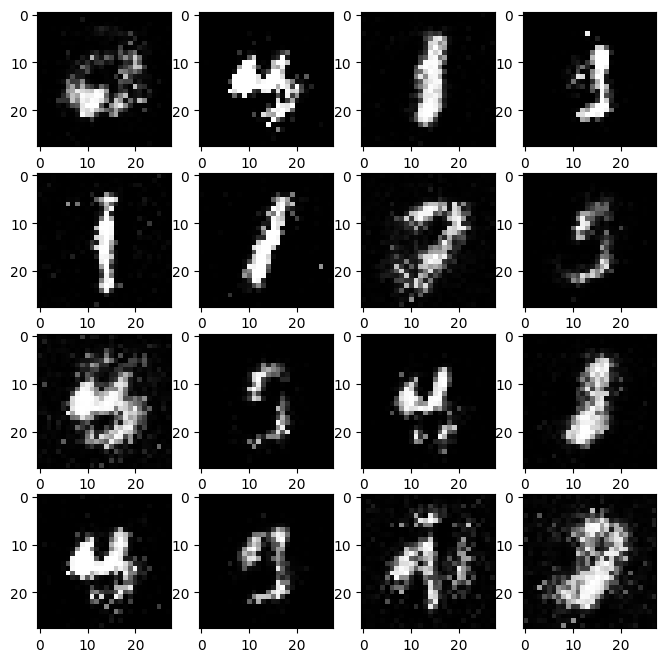

Epoch 15/200 (7.0%):
[0/60032] (0.0%)
D Error: 0.2864 G Error: 2.5626
D Real: 3.5665 D Fake: -2.6464
D_TP: 6.0000, D_FN: 122.0000, D_FP: 2.0000, D_TN: 126.0000, D_TPR: 0.0469, D_FPR: 0.0156


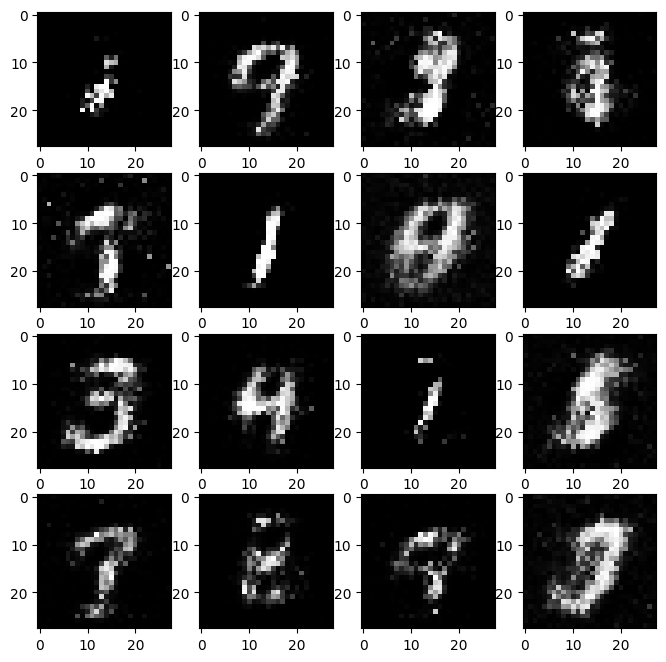

Epoch 16/200 (7.5%):
[0/60032] (0.0%)
D Error: 0.4304 G Error: 2.0909
D Real: 3.2939 D Fake: -1.4876
D_TP: 23.0000, D_FN: 105.0000, D_FP: 9.0000, D_TN: 119.0000, D_TPR: 0.1797, D_FPR: 0.0703


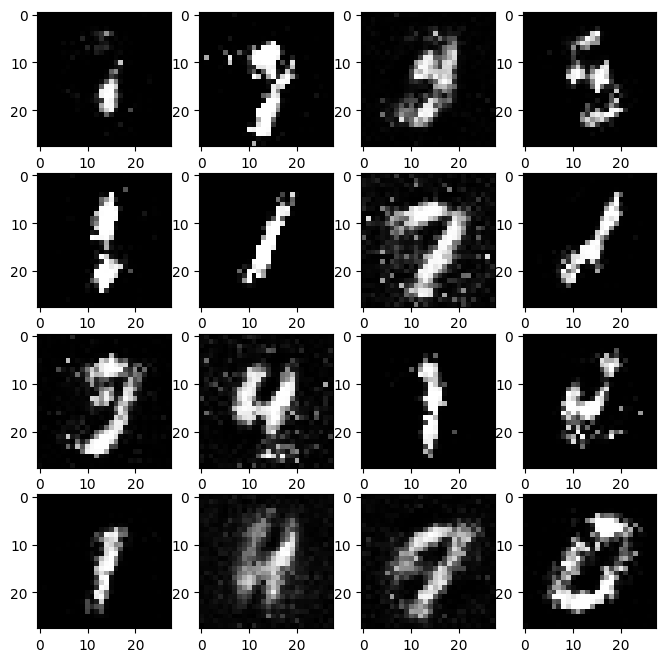

Epoch 17/200 (8.0%):
[0/60032] (0.0%)
D Error: 0.3381 G Error: 2.1478
D Real: 4.0727 D Fake: -1.7099
D_TP: 11.0000, D_FN: 117.0000, D_FP: 5.0000, D_TN: 123.0000, D_TPR: 0.0859, D_FPR: 0.0391


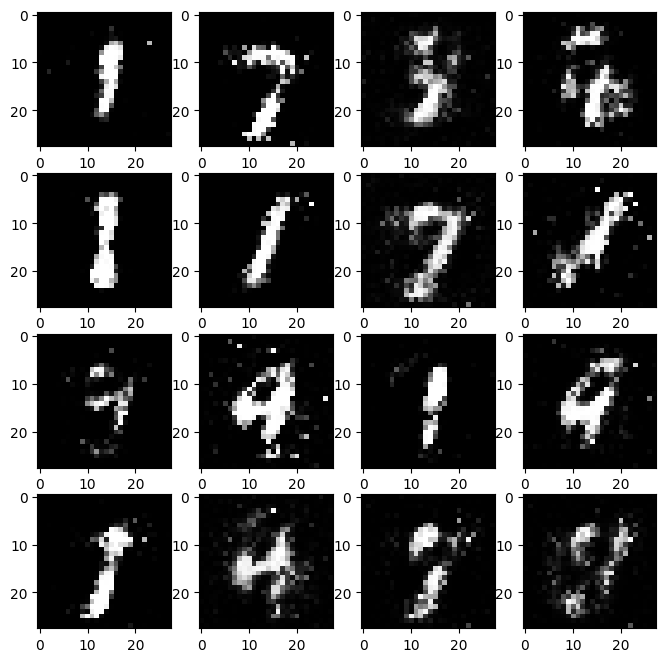

Epoch 18/200 (8.5%):
[0/60032] (0.0%)
D Error: 0.2590 G Error: 2.1776
D Real: 4.1049 D Fake: -2.0162
D_TP: 12.0000, D_FN: 116.0000, D_FP: 4.0000, D_TN: 124.0000, D_TPR: 0.0938, D_FPR: 0.0312


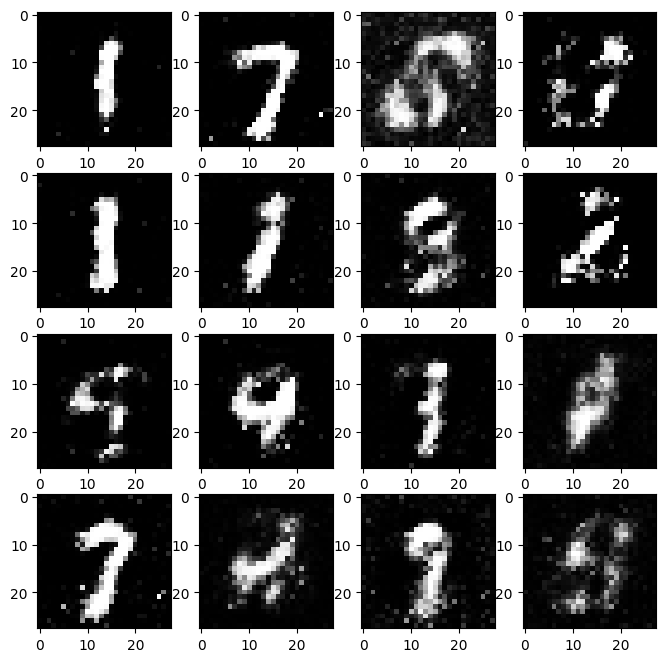

Epoch 19/200 (9.0%):
[0/60032] (0.0%)
D Error: 0.3516 G Error: 1.5714
D Real: 2.3288 D Fake: -1.4484
D_TP: 17.0000, D_FN: 111.0000, D_FP: 5.0000, D_TN: 123.0000, D_TPR: 0.1328, D_FPR: 0.0391


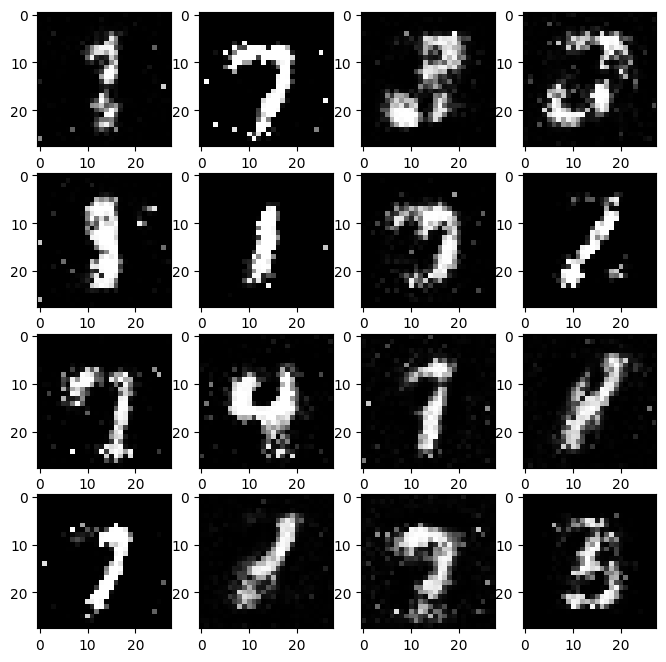

Epoch 20/200 (9.5%):
[0/60032] (0.0%)
D Error: 0.3786 G Error: 1.7924
D Real: 2.4120 D Fake: -1.4906
D_TP: 16.0000, D_FN: 112.0000, D_FP: 6.0000, D_TN: 122.0000, D_TPR: 0.1250, D_FPR: 0.0469


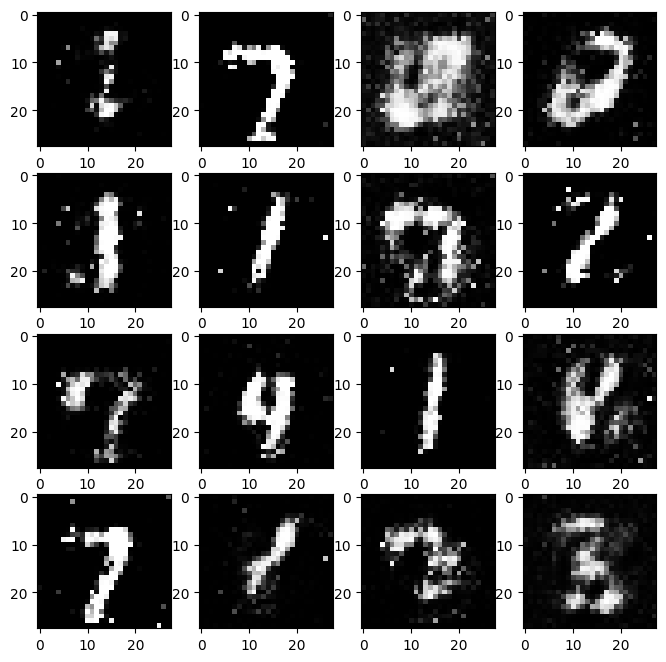

Epoch 21/200 (10.0%):
[0/60032] (0.0%)
D Error: 0.3618 G Error: 2.0848
D Real: 2.8956 D Fake: -1.6700
D_TP: 15.0000, D_FN: 113.0000, D_FP: 6.0000, D_TN: 122.0000, D_TPR: 0.1172, D_FPR: 0.0469


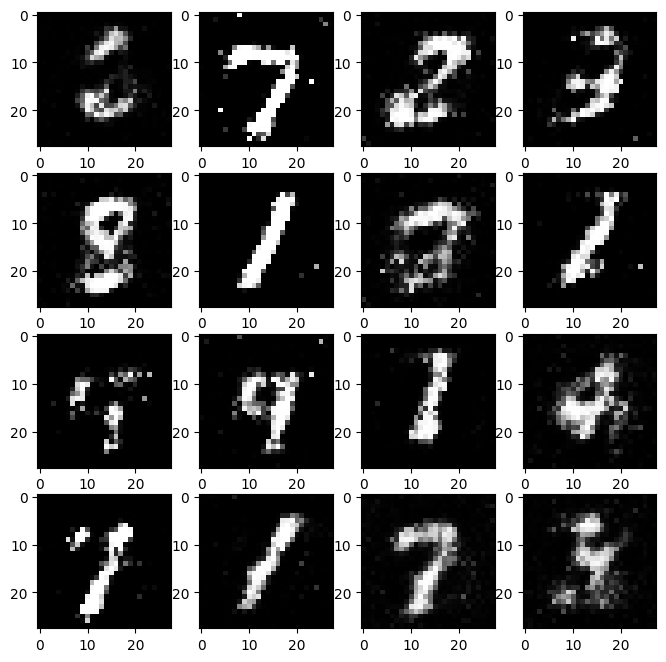

Epoch 22/200 (10.5%):
[0/60032] (0.0%)
D Error: 0.4223 G Error: 2.4497
D Real: 3.2650 D Fake: -1.1124
D_TP: 13.0000, D_FN: 115.0000, D_FP: 8.0000, D_TN: 120.0000, D_TPR: 0.1016, D_FPR: 0.0625


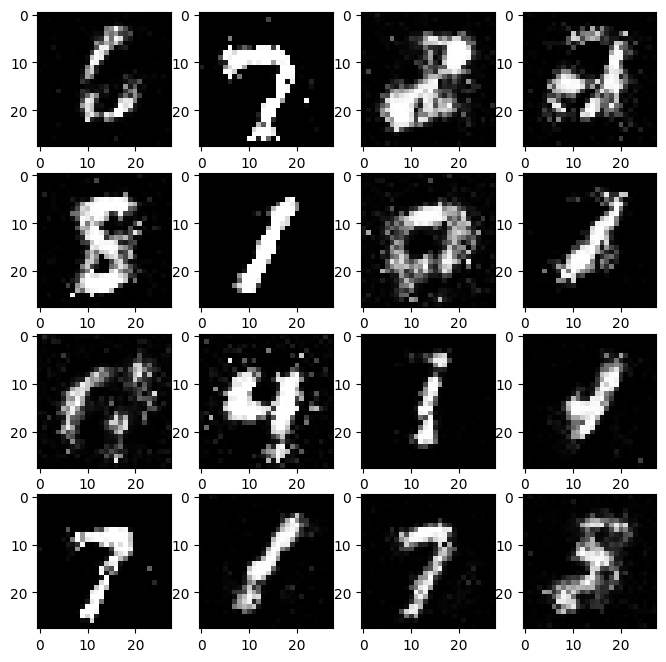

Epoch 23/200 (11.0%):
[0/60032] (0.0%)
D Error: 0.5399 G Error: 1.8653
D Real: 1.9403 D Fake: -0.8778
D_TP: 21.0000, D_FN: 107.0000, D_FP: 15.0000, D_TN: 113.0000, D_TPR: 0.1641, D_FPR: 0.1172


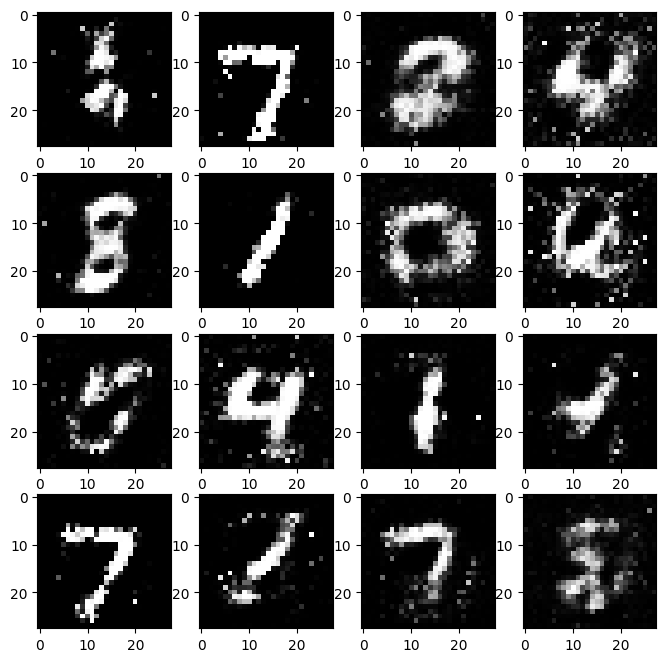

Epoch 24/200 (11.5%):
[0/60032] (0.0%)
D Error: 0.3644 G Error: 2.0162
D Real: 1.9530 D Fake: -1.8057
D_TP: 12.0000, D_FN: 116.0000, D_FP: 8.0000, D_TN: 120.0000, D_TPR: 0.0938, D_FPR: 0.0625


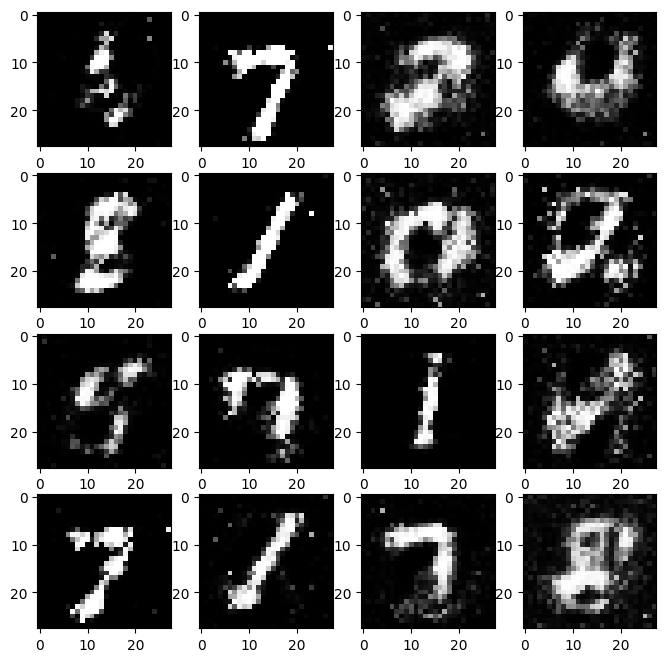

Epoch 25/200 (12.0%):
[0/60032] (0.0%)
D Error: 0.4893 G Error: 1.8163
D Real: 2.2415 D Fake: -1.1666
D_TP: 15.0000, D_FN: 113.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.1172, D_FPR: 0.0938


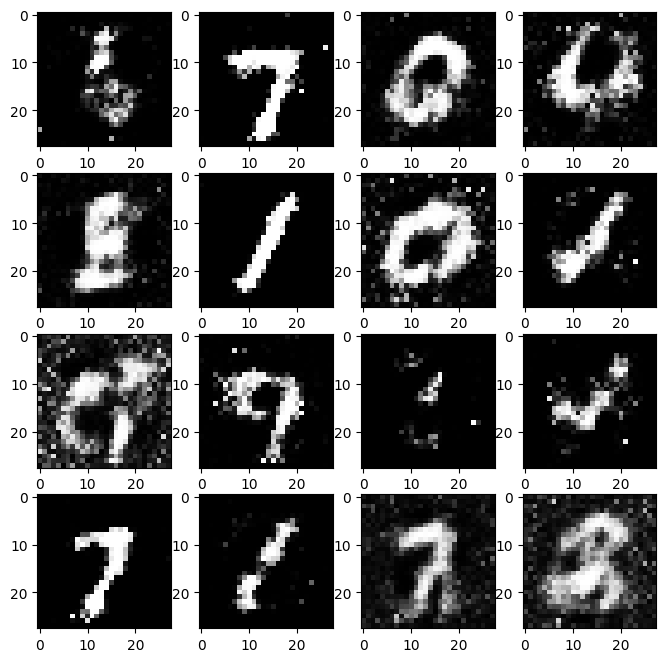

Epoch 26/200 (12.5%):
[0/60032] (0.0%)
D Error: 0.4704 G Error: 1.4525
D Real: 1.2779 D Fake: -1.1841
D_TP: 22.0000, D_FN: 106.0000, D_FP: 9.0000, D_TN: 119.0000, D_TPR: 0.1719, D_FPR: 0.0703


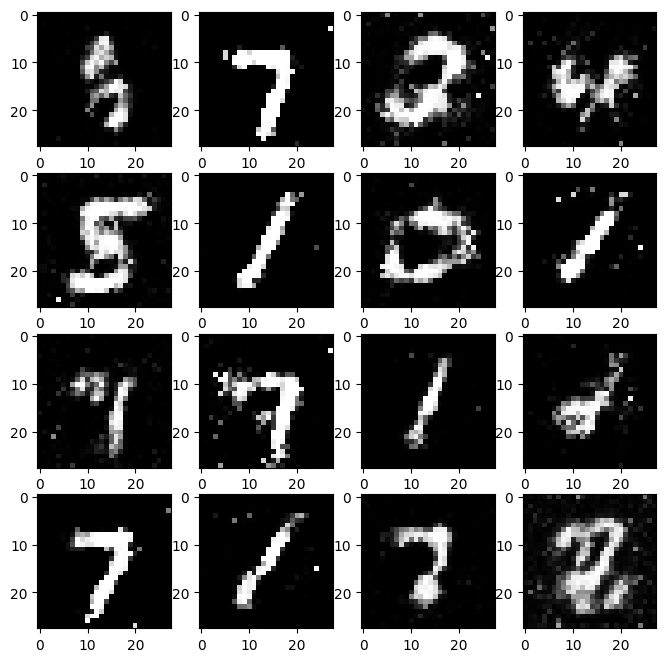

Epoch 27/200 (13.0%):
[0/60032] (0.0%)
D Error: 0.4389 G Error: 1.7928
D Real: 1.3404 D Fake: -1.9436
D_TP: 23.0000, D_FN: 105.0000, D_FP: 6.0000, D_TN: 122.0000, D_TPR: 0.1797, D_FPR: 0.0469


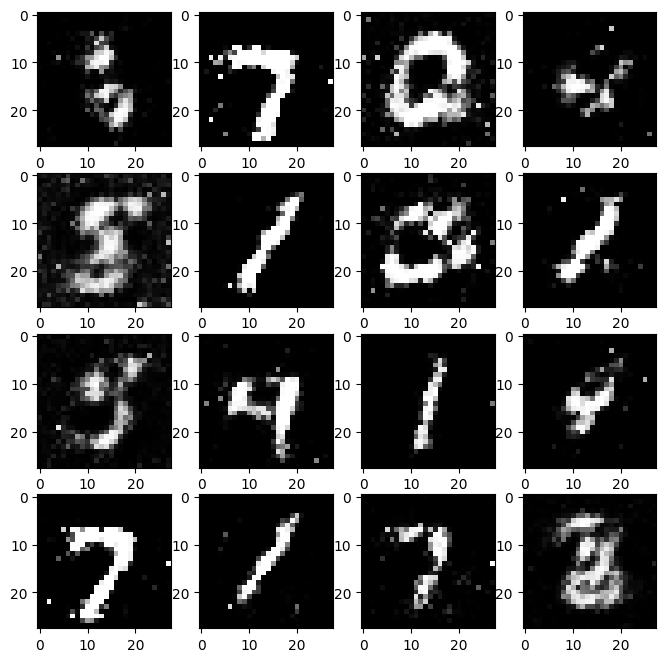

Epoch 28/200 (13.5%):
[0/60032] (0.0%)
D Error: 0.3141 G Error: 1.9932
D Real: 3.2110 D Fake: -1.5357
D_TP: 13.0000, D_FN: 115.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.1016, D_FPR: 0.0781


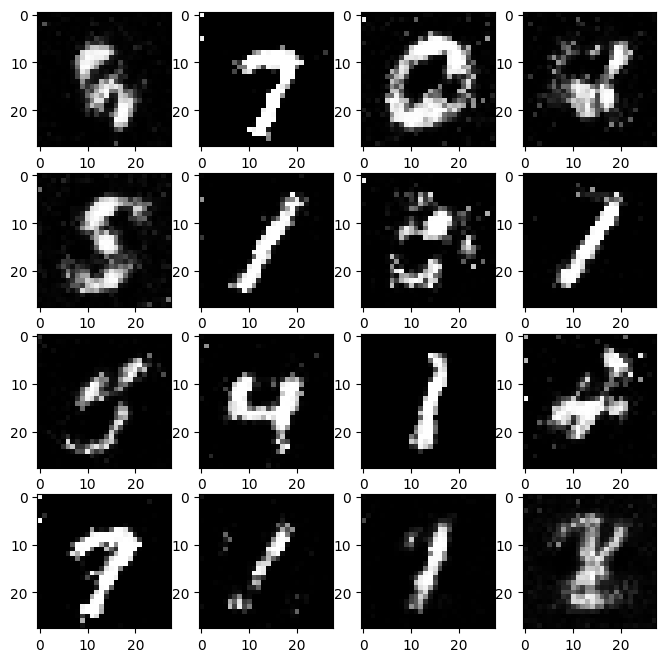

Epoch 29/200 (14.0%):
[0/60032] (0.0%)
D Error: 0.4890 G Error: 2.2425
D Real: 1.1669 D Fake: -1.8101
D_TP: 16.0000, D_FN: 112.0000, D_FP: 4.0000, D_TN: 124.0000, D_TPR: 0.1250, D_FPR: 0.0312


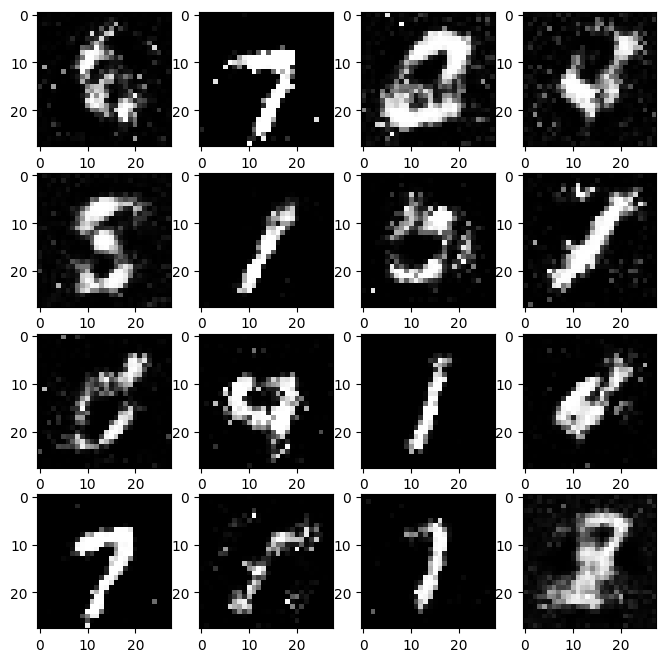

Epoch 30/200 (14.5%):
[0/60032] (0.0%)
D Error: 0.4707 G Error: 1.4591
D Real: 1.8846 D Fake: -0.6479
D_TP: 28.0000, D_FN: 100.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.2188, D_FPR: 0.1250


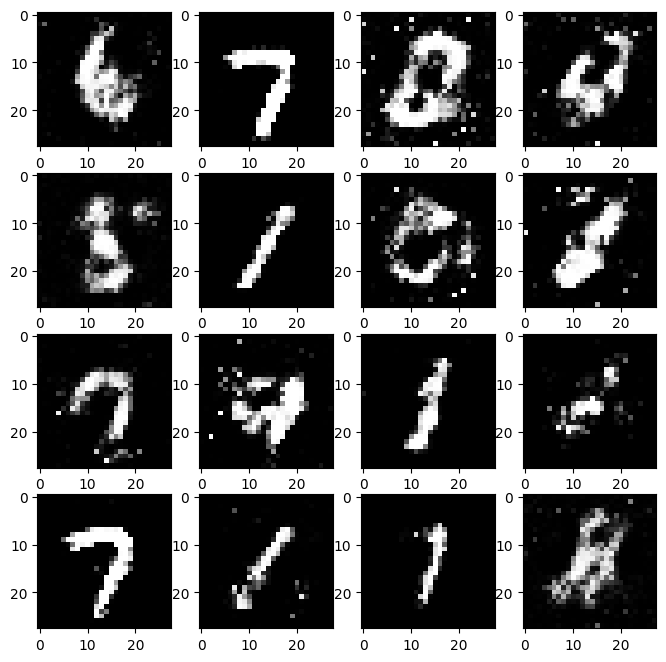

Epoch 31/200 (15.0%):
[0/60032] (0.0%)
D Error: 0.4168 G Error: 1.3538
D Real: 2.1961 D Fake: -0.7105
D_TP: 22.0000, D_FN: 106.0000, D_FP: 15.0000, D_TN: 113.0000, D_TPR: 0.1719, D_FPR: 0.1172


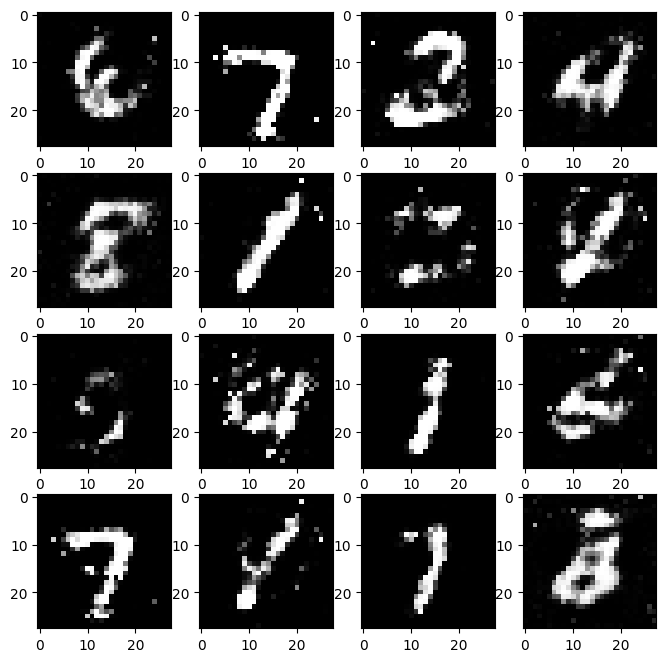

Epoch 32/200 (15.5%):
[0/60032] (0.0%)
D Error: 0.4847 G Error: 1.7106
D Real: 1.0270 D Fake: -1.2490
D_TP: 22.0000, D_FN: 106.0000, D_FP: 7.0000, D_TN: 121.0000, D_TPR: 0.1719, D_FPR: 0.0547


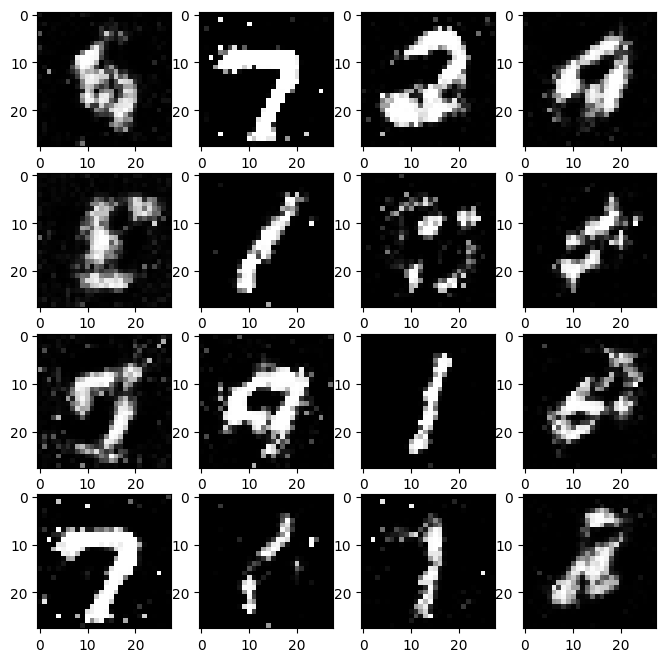

Epoch 33/200 (16.0%):
[0/60032] (0.0%)
D Error: 0.4482 G Error: 1.7276
D Real: 1.2702 D Fake: -1.5372
D_TP: 20.0000, D_FN: 108.0000, D_FP: 1.0000, D_TN: 127.0000, D_TPR: 0.1562, D_FPR: 0.0078


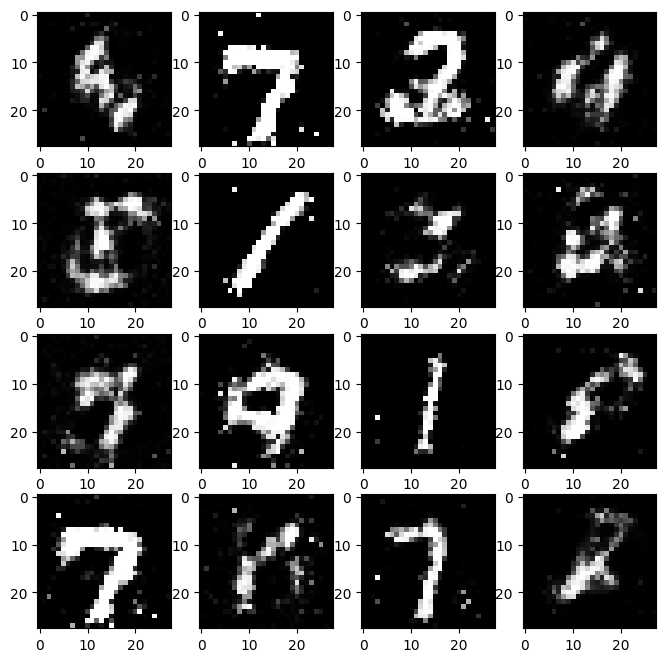

Epoch 34/200 (16.5%):
[0/60032] (0.0%)
D Error: 0.4776 G Error: 1.2483
D Real: 1.3704 D Fake: -0.6030
D_TP: 37.0000, D_FN: 91.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.2891, D_FPR: 0.1016


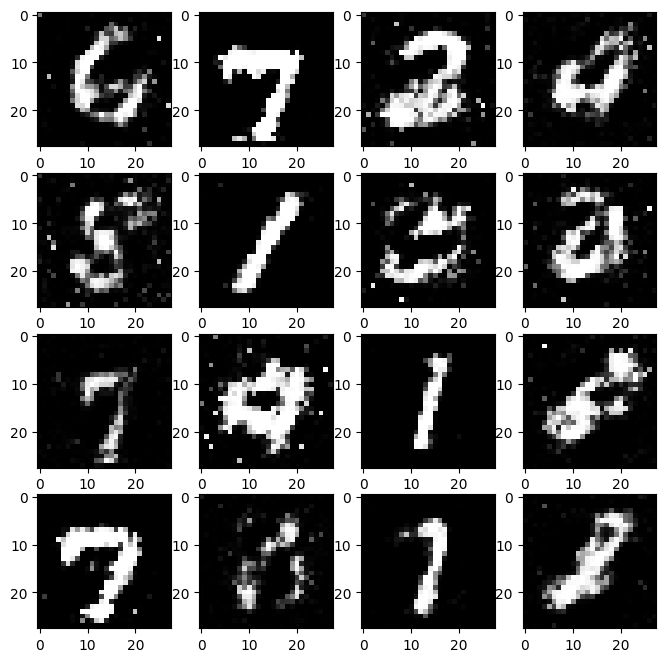

Epoch 35/200 (17.0%):
[0/60032] (0.0%)
D Error: 0.4777 G Error: 1.6219
D Real: 1.7697 D Fake: -1.0678
D_TP: 21.0000, D_FN: 107.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.1641, D_FPR: 0.0859


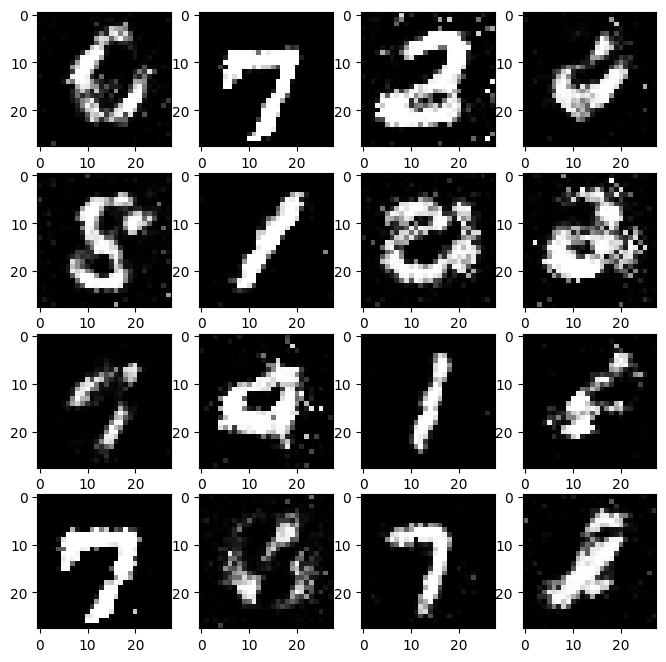

Epoch 36/200 (17.5%):
[0/60032] (0.0%)
D Error: 0.5488 G Error: 1.4630
D Real: 0.8001 D Fake: -1.0146
D_TP: 31.0000, D_FN: 97.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.2422, D_FPR: 0.0938


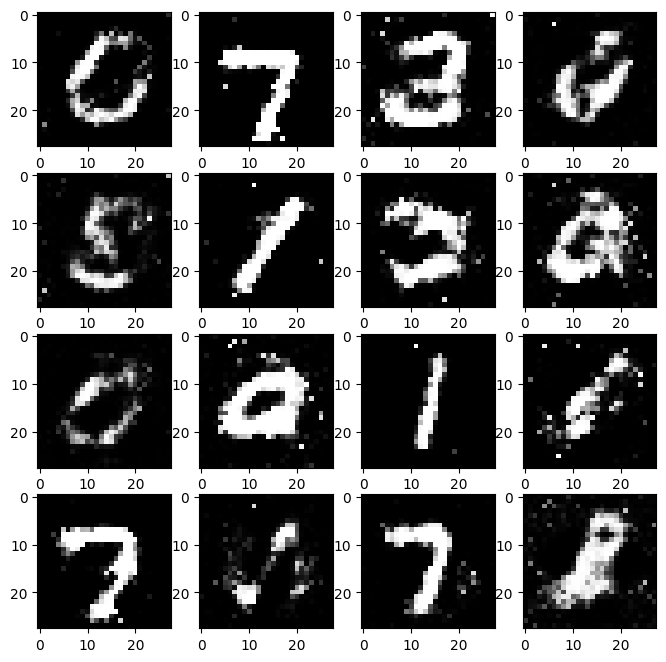

Epoch 37/200 (18.0%):
[0/60032] (0.0%)
D Error: 0.5318 G Error: 1.3016
D Real: 1.2341 D Fake: -0.4723
D_TP: 28.0000, D_FN: 100.0000, D_FP: 15.0000, D_TN: 113.0000, D_TPR: 0.2188, D_FPR: 0.1172


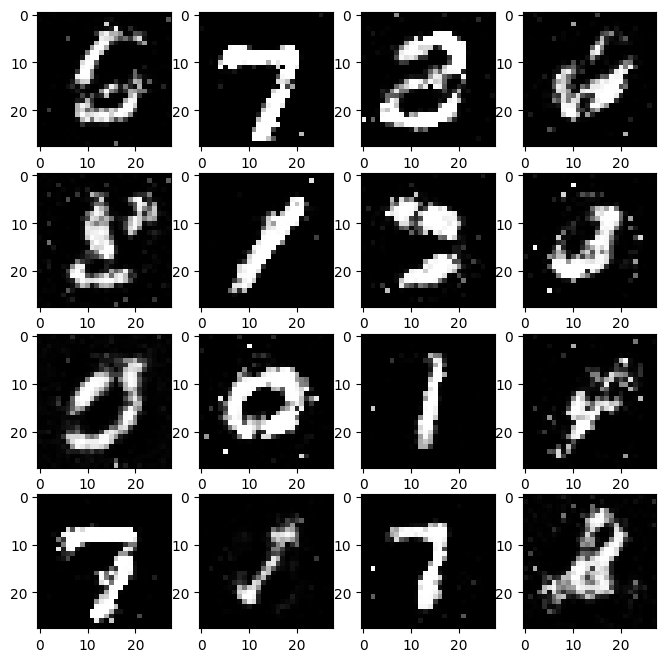

Epoch 38/200 (18.5%):
[0/60032] (0.0%)
D Error: 0.4783 G Error: 1.5464
D Real: 1.1472 D Fake: -0.9813
D_TP: 24.0000, D_FN: 104.0000, D_FP: 5.0000, D_TN: 123.0000, D_TPR: 0.1875, D_FPR: 0.0391


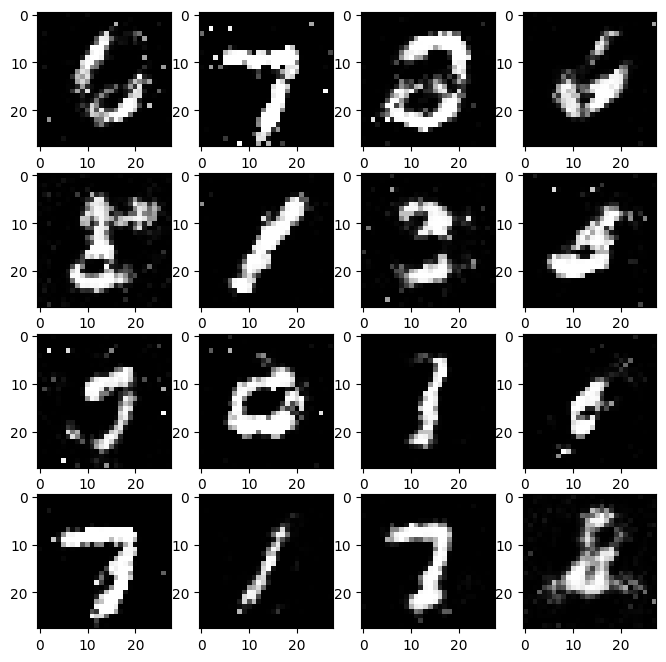

Epoch 39/200 (19.0%):
[0/60032] (0.0%)
D Error: 0.5371 G Error: 1.3016
D Real: 1.4916 D Fake: -0.6230
D_TP: 20.0000, D_FN: 108.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.1562, D_FPR: 0.0781


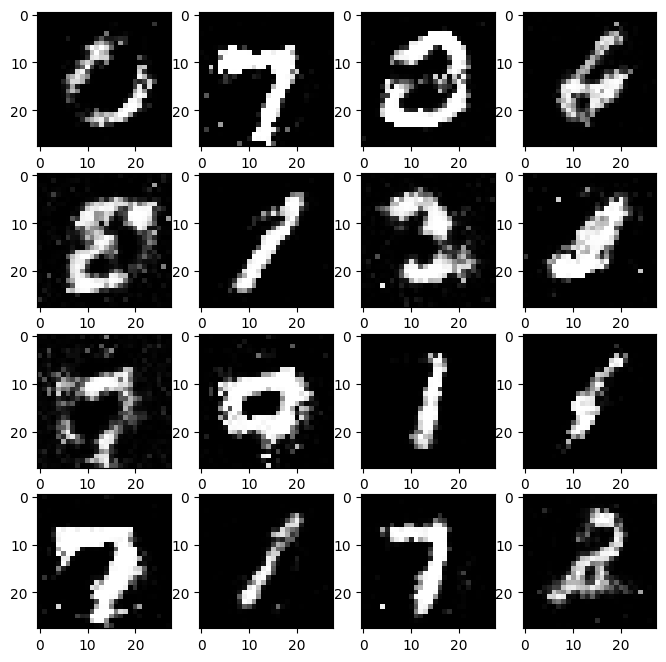

Epoch 40/200 (19.5%):
[0/60032] (0.0%)
D Error: 0.4580 G Error: 1.5161
D Real: 1.6327 D Fake: -0.9271
D_TP: 16.0000, D_FN: 112.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.1250, D_FPR: 0.1016


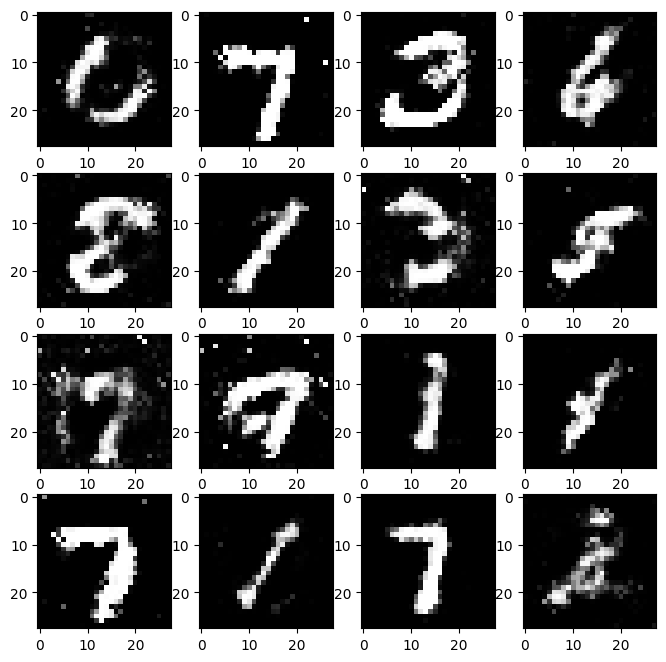

Epoch 41/200 (20.0%):
[0/60032] (0.0%)
D Error: 0.4411 G Error: 1.6665
D Real: 1.7915 D Fake: -0.9565
D_TP: 21.0000, D_FN: 107.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.1641, D_FPR: 0.1016


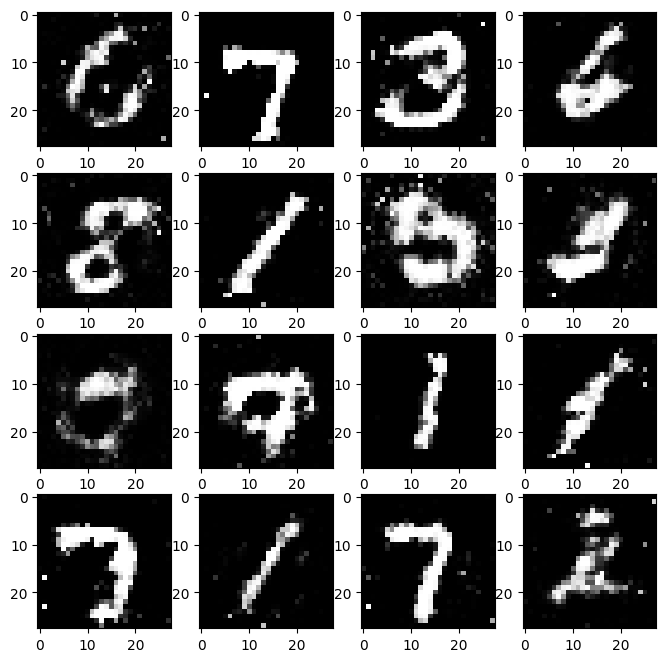

Epoch 42/200 (20.5%):
[0/60032] (0.0%)
D Error: 0.4392 G Error: 1.3969
D Real: 1.3392 D Fake: -0.8539
D_TP: 31.0000, D_FN: 97.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.2422, D_FPR: 0.0781


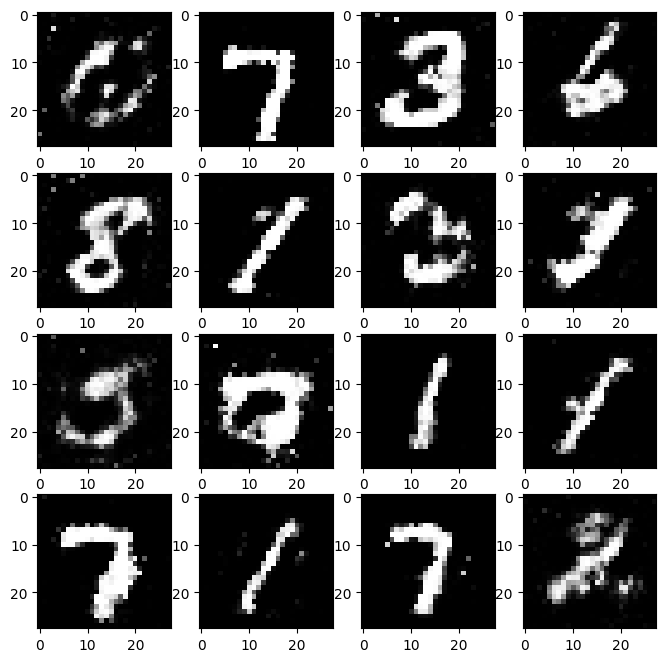

Epoch 43/200 (21.0%):
[0/60032] (0.0%)
D Error: 0.4735 G Error: 1.1617
D Real: 1.3194 D Fake: -0.5498
D_TP: 28.0000, D_FN: 100.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.2188, D_FPR: 0.0781


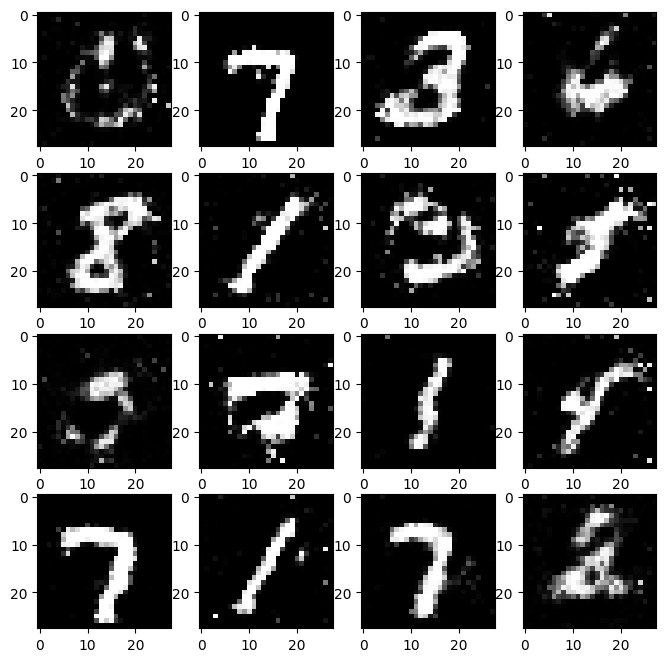

Epoch 44/200 (21.5%):
[0/60032] (0.0%)
D Error: 0.4743 G Error: 1.6615
D Real: 0.9972 D Fake: -1.0755
D_TP: 26.0000, D_FN: 102.0000, D_FP: 9.0000, D_TN: 119.0000, D_TPR: 0.2031, D_FPR: 0.0703


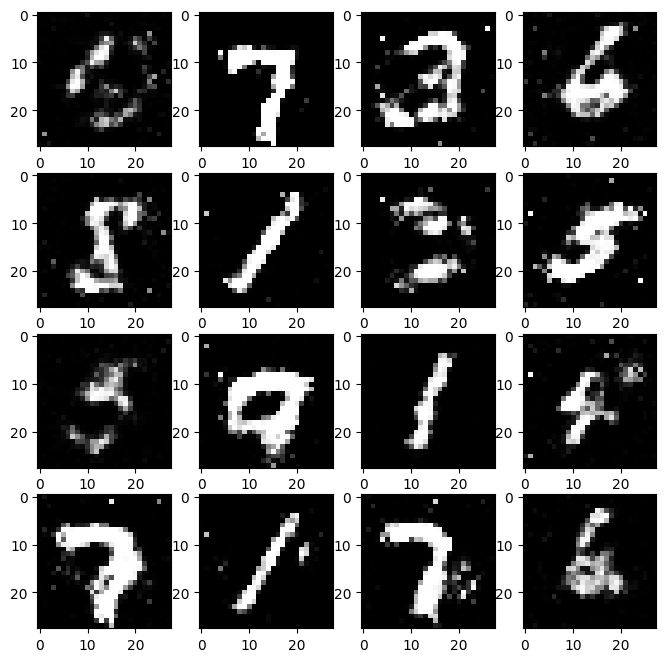

Epoch 45/200 (22.0%):
[0/60032] (0.0%)
D Error: 0.5228 G Error: 1.3576
D Real: 0.8349 D Fake: -1.0831
D_TP: 29.0000, D_FN: 99.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.2266, D_FPR: 0.0859


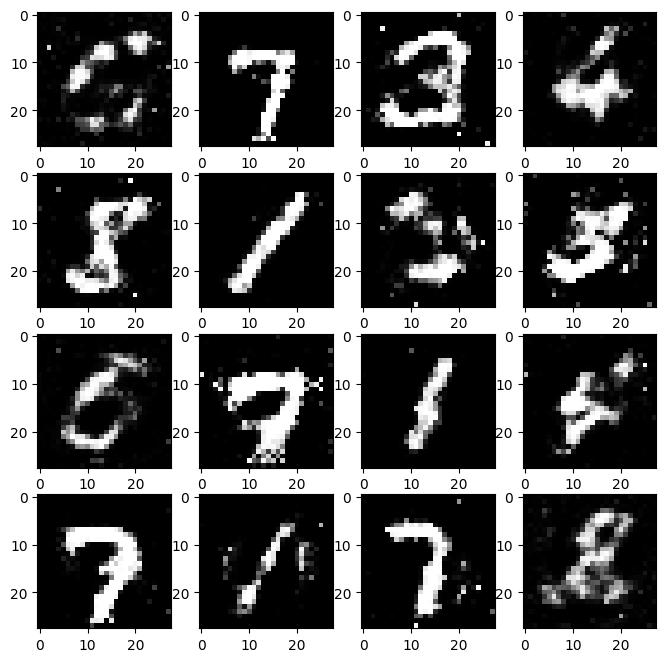

Epoch 46/200 (22.5%):
[0/60032] (0.0%)
D Error: 0.4462 G Error: 1.4007
D Real: 1.2598 D Fake: -0.7963
D_TP: 32.0000, D_FN: 96.0000, D_FP: 7.0000, D_TN: 121.0000, D_TPR: 0.2500, D_FPR: 0.0547


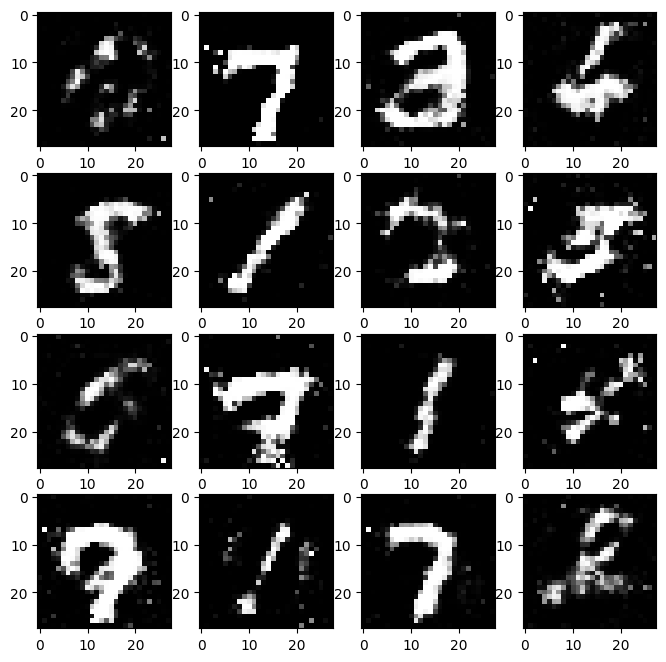

Epoch 47/200 (23.0%):
[0/60032] (0.0%)
D Error: 0.4721 G Error: 1.6228
D Real: 1.1042 D Fake: -0.9053
D_TP: 36.0000, D_FN: 92.0000, D_FP: 7.0000, D_TN: 121.0000, D_TPR: 0.2812, D_FPR: 0.0547


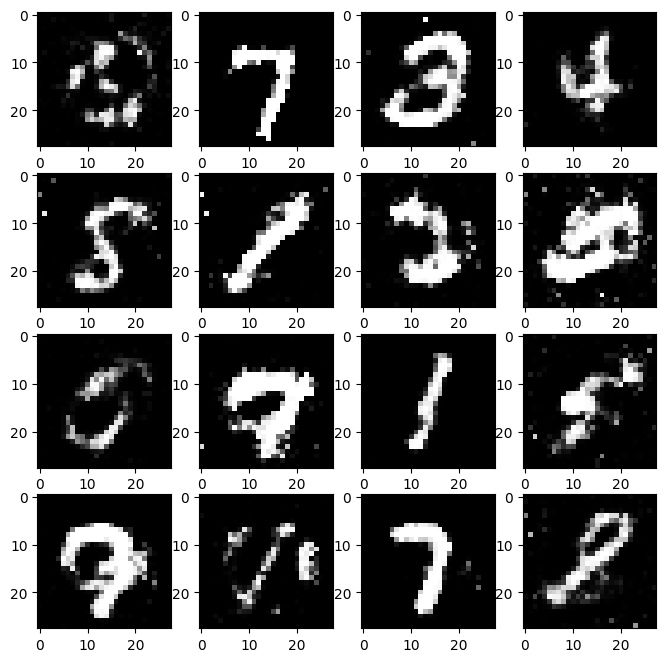

Epoch 48/200 (23.5%):
[0/60032] (0.0%)
D Error: 0.4876 G Error: 1.2143
D Real: 1.2367 D Fake: -0.6073
D_TP: 37.0000, D_FN: 91.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.2891, D_FPR: 0.1094


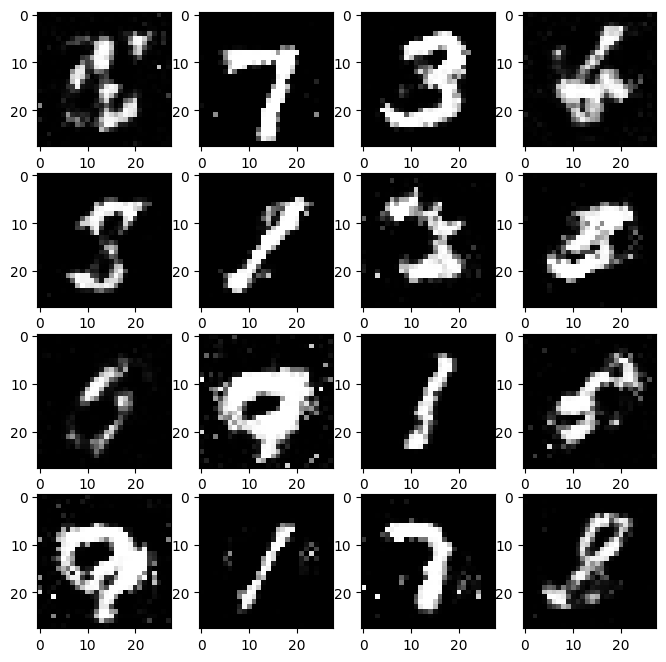

Epoch 49/200 (24.0%):
[0/60032] (0.0%)
D Error: 0.6051 G Error: 1.0402
D Real: 0.9408 D Fake: -0.5020
D_TP: 24.0000, D_FN: 104.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.1875, D_FPR: 0.1016


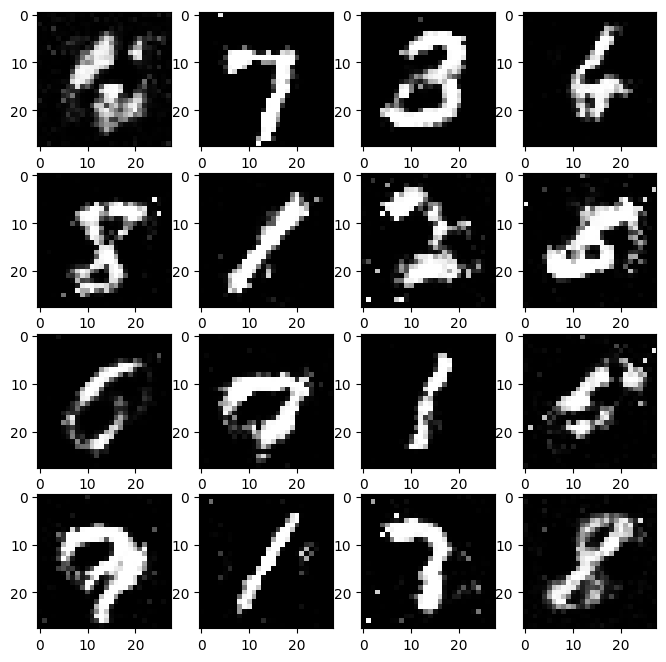

Epoch 50/200 (24.5%):
[0/60032] (0.0%)
D Error: 0.6330 G Error: 0.9826
D Real: 0.4631 D Fake: -0.4294
D_TP: 22.0000, D_FN: 106.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.1719, D_FPR: 0.1016


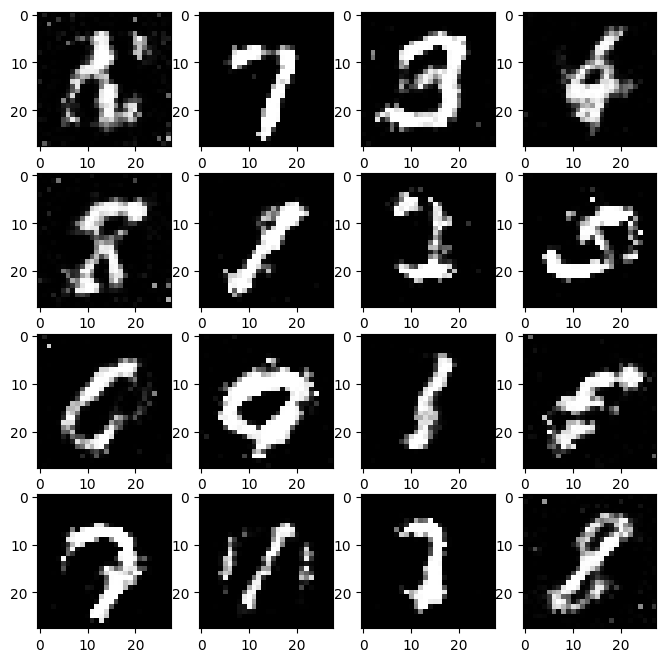

Epoch 51/200 (25.0%):
[0/60032] (0.0%)
D Error: 0.5023 G Error: 1.1102
D Real: 1.1583 D Fake: -0.5565
D_TP: 23.0000, D_FN: 105.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.1797, D_FPR: 0.0781


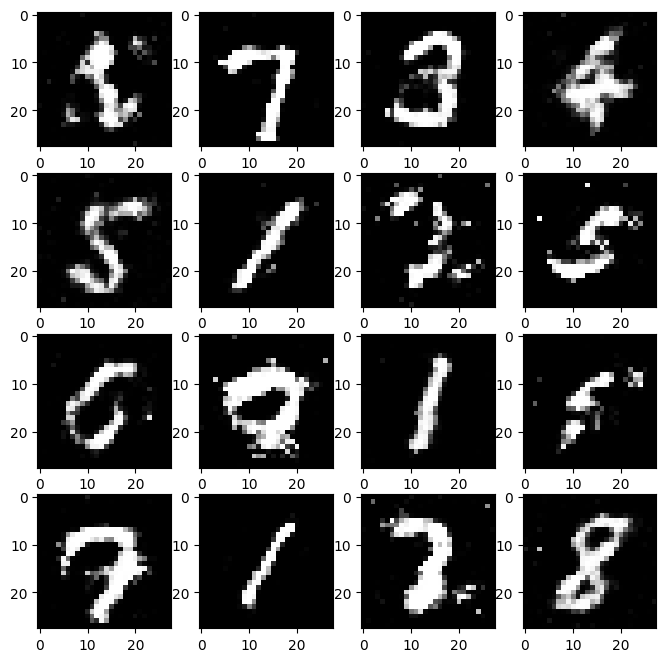

Epoch 52/200 (25.5%):
[0/60032] (0.0%)
D Error: 0.5360 G Error: 1.1801
D Real: 1.0379 D Fake: -0.6822
D_TP: 30.0000, D_FN: 98.0000, D_FP: 15.0000, D_TN: 113.0000, D_TPR: 0.2344, D_FPR: 0.1172


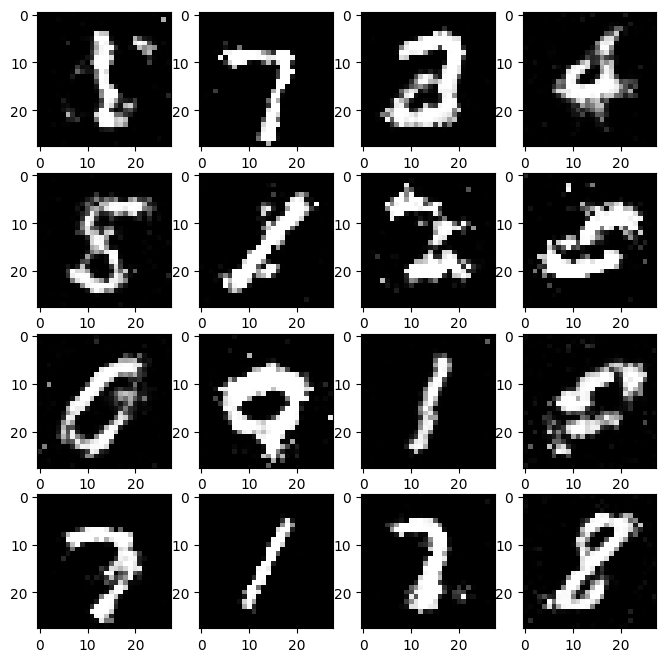

Epoch 53/200 (26.0%):
[0/60032] (0.0%)
D Error: 0.4702 G Error: 1.7308
D Real: 0.9915 D Fake: -1.5334
D_TP: 23.0000, D_FN: 105.0000, D_FP: 8.0000, D_TN: 120.0000, D_TPR: 0.1797, D_FPR: 0.0625


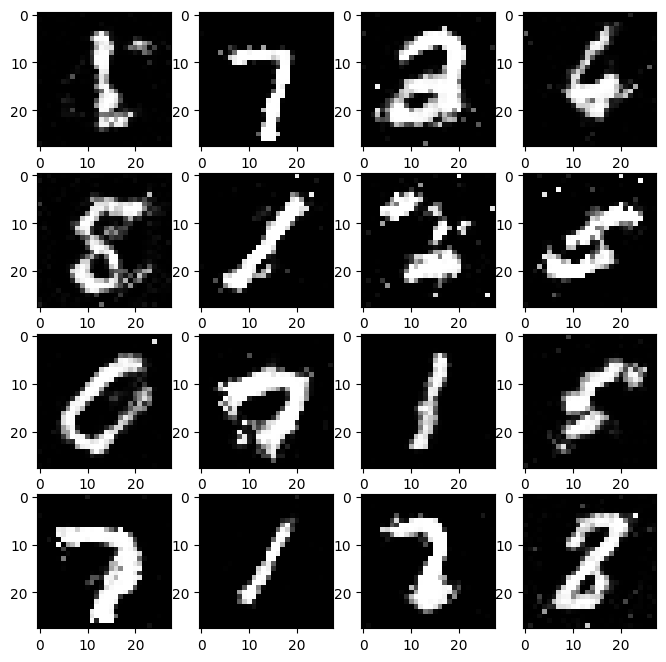

Epoch 54/200 (26.5%):
[0/60032] (0.0%)
D Error: 0.4890 G Error: 1.5878
D Real: 1.1184 D Fake: -0.7257
D_TP: 27.0000, D_FN: 101.0000, D_FP: 6.0000, D_TN: 122.0000, D_TPR: 0.2109, D_FPR: 0.0469


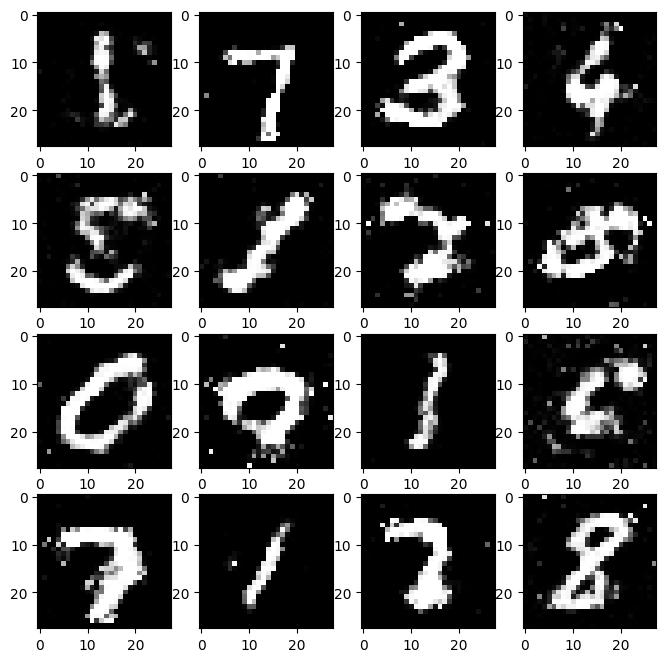

Epoch 55/200 (27.0%):
[0/60032] (0.0%)
D Error: 0.4722 G Error: 1.2072
D Real: 1.1575 D Fake: -0.7154
D_TP: 38.0000, D_FN: 90.0000, D_FP: 9.0000, D_TN: 119.0000, D_TPR: 0.2969, D_FPR: 0.0703


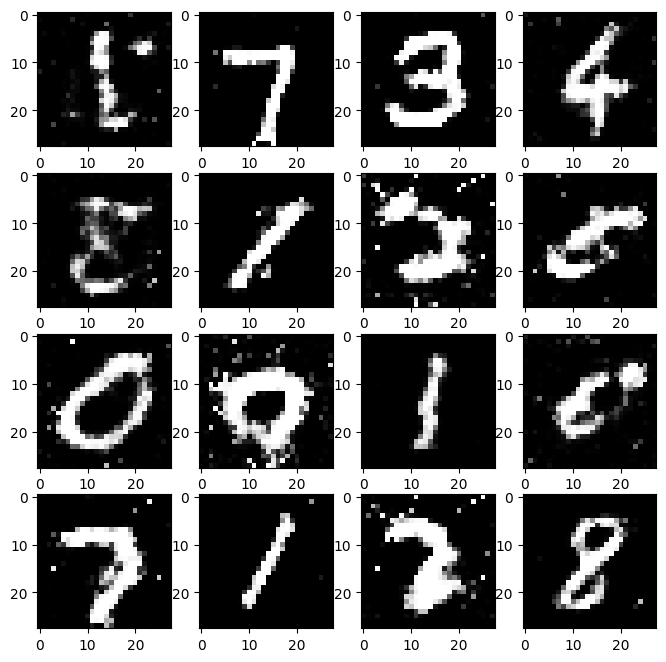

Epoch 56/200 (27.5%):
[0/60032] (0.0%)
D Error: 0.6054 G Error: 1.1162
D Real: 0.6403 D Fake: -0.5835
D_TP: 34.0000, D_FN: 94.0000, D_FP: 15.0000, D_TN: 113.0000, D_TPR: 0.2656, D_FPR: 0.1172


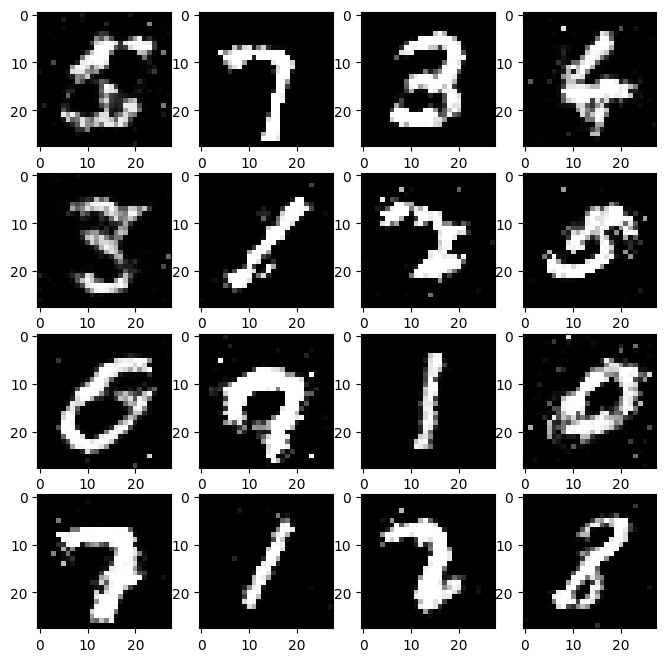

Epoch 57/200 (28.0%):
[0/60032] (0.0%)
D Error: 0.5559 G Error: 1.0076
D Real: 0.9299 D Fake: -0.3046
D_TP: 34.0000, D_FN: 94.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.2656, D_FPR: 0.0859


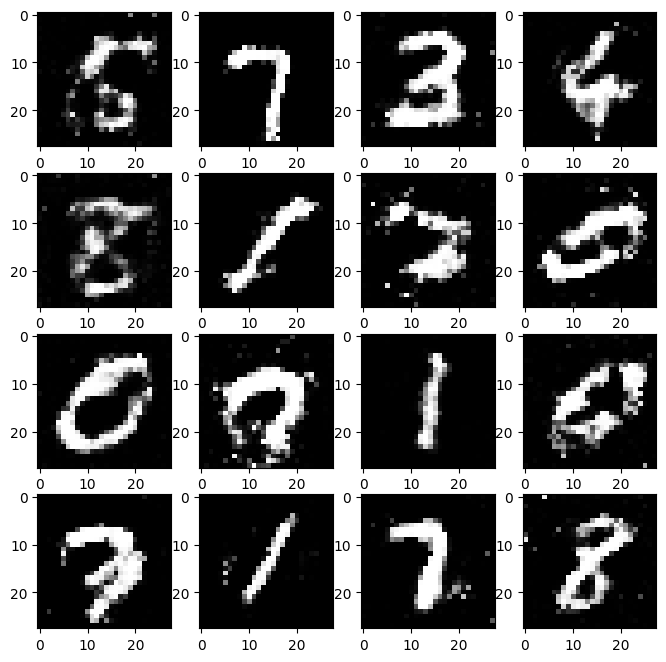

Epoch 58/200 (28.5%):
[0/60032] (0.0%)
D Error: 0.5622 G Error: 1.1427
D Real: 0.7758 D Fake: -0.5593
D_TP: 27.0000, D_FN: 101.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.2109, D_FPR: 0.0859


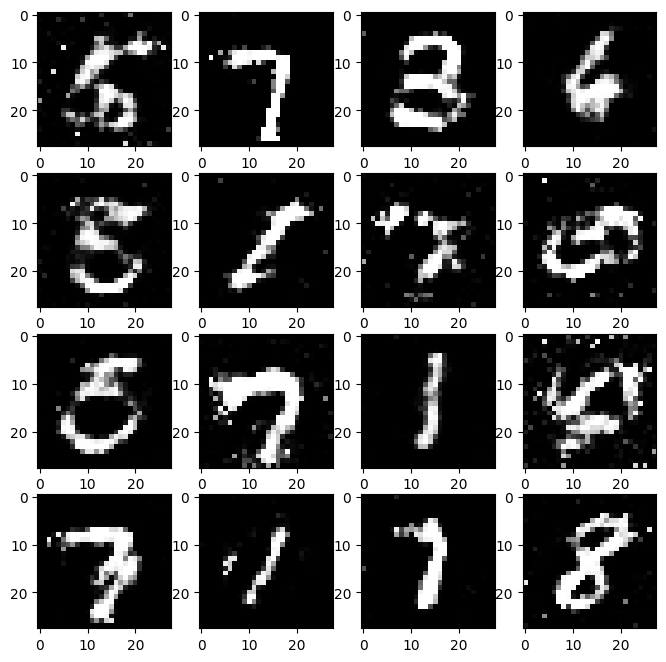

Epoch 59/200 (29.0%):
[0/60032] (0.0%)
D Error: 0.5241 G Error: 1.2309
D Real: 0.9090 D Fake: -0.5378
D_TP: 46.0000, D_FN: 82.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.3594, D_FPR: 0.1094


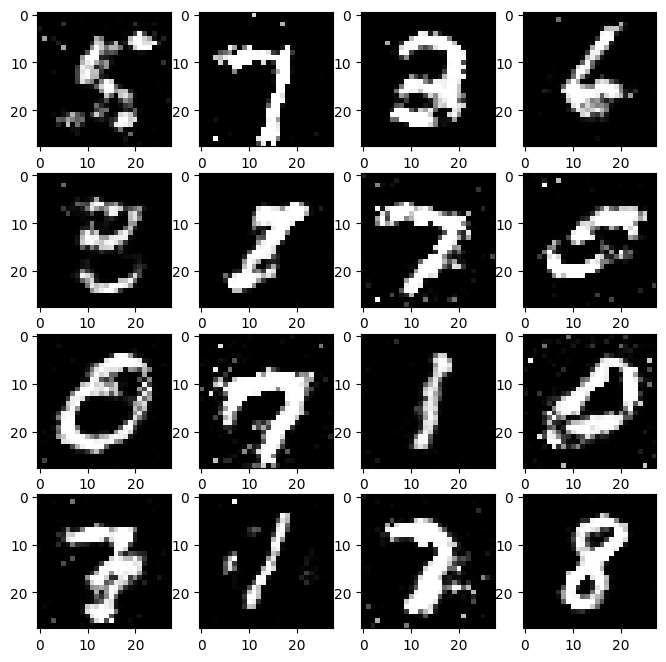

Epoch 60/200 (29.5%):
[0/60032] (0.0%)
D Error: 0.5296 G Error: 1.2794
D Real: 1.0714 D Fake: -0.4185
D_TP: 35.0000, D_FN: 93.0000, D_FP: 19.0000, D_TN: 109.0000, D_TPR: 0.2734, D_FPR: 0.1484


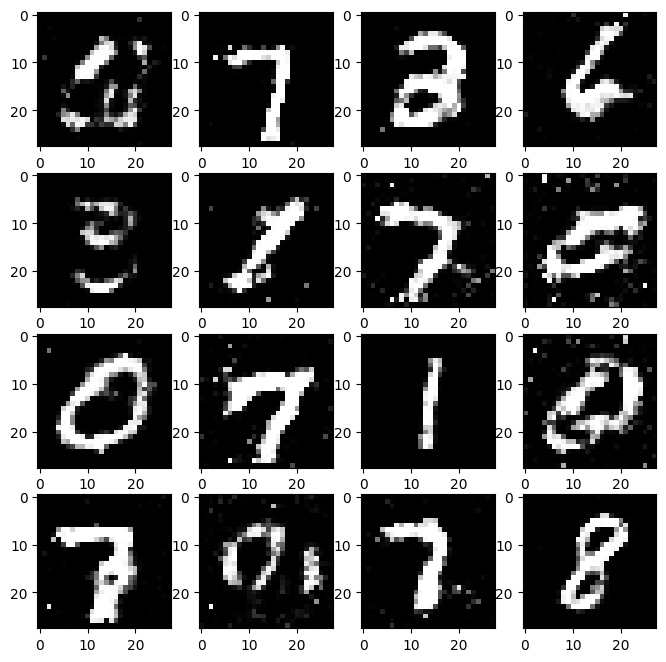

Epoch 61/200 (30.0%):
[0/60032] (0.0%)
D Error: 0.6376 G Error: 1.0373
D Real: 0.4523 D Fake: -0.4022
D_TP: 28.0000, D_FN: 100.0000, D_FP: 18.0000, D_TN: 110.0000, D_TPR: 0.2188, D_FPR: 0.1406


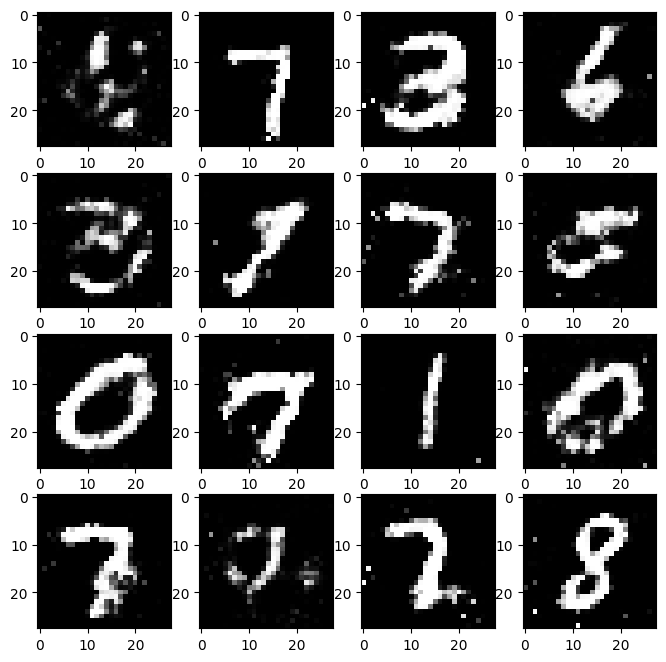

Epoch 62/200 (30.5%):
[0/60032] (0.0%)
D Error: 0.6878 G Error: 1.1486
D Real: 0.4484 D Fake: -0.3953
D_TP: 23.0000, D_FN: 105.0000, D_FP: 19.0000, D_TN: 109.0000, D_TPR: 0.1797, D_FPR: 0.1484


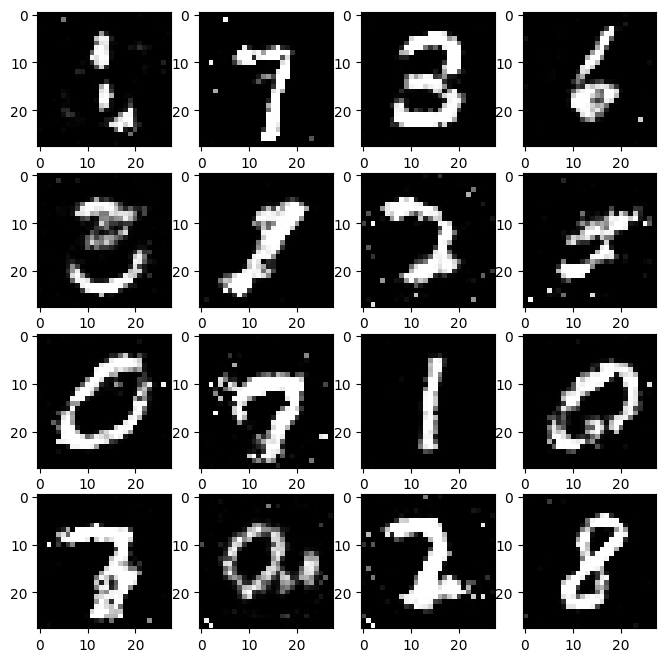

Epoch 63/200 (31.0%):
[0/60032] (0.0%)
D Error: 0.5648 G Error: 1.1173
D Real: 0.7393 D Fake: -0.5054
D_TP: 30.0000, D_FN: 98.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.2344, D_FPR: 0.0859


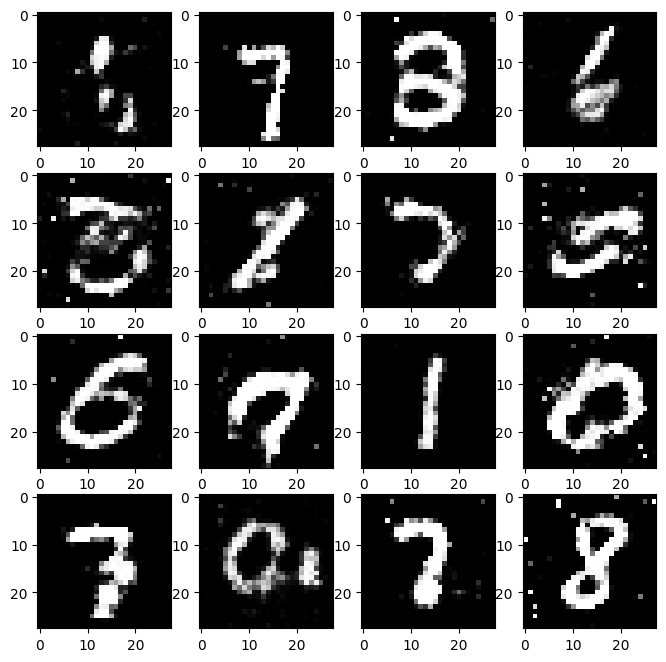

Epoch 64/200 (31.5%):
[0/60032] (0.0%)
D Error: 0.6059 G Error: 0.9536
D Real: 0.3168 D Fake: -0.4621
D_TP: 34.0000, D_FN: 94.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.2656, D_FPR: 0.0781


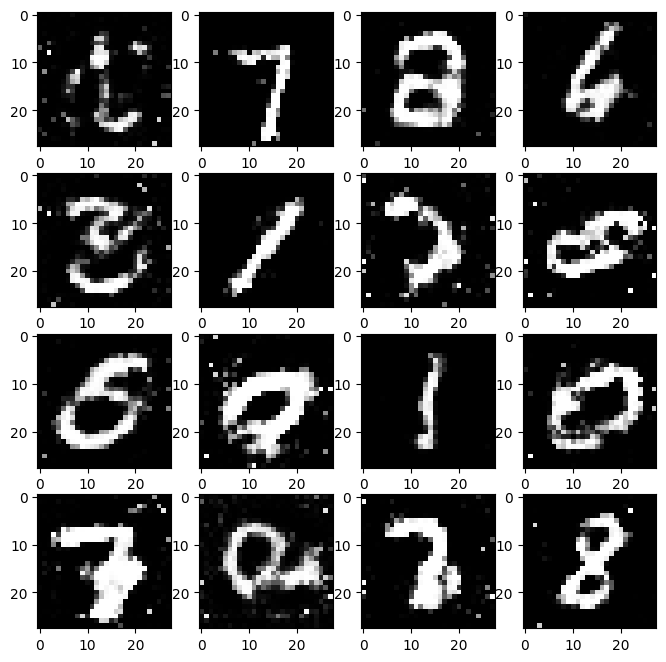

Epoch 65/200 (32.0%):
[0/60032] (0.0%)
D Error: 0.5548 G Error: 1.1084
D Real: 0.6099 D Fake: -0.6807
D_TP: 30.0000, D_FN: 98.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.2344, D_FPR: 0.0859


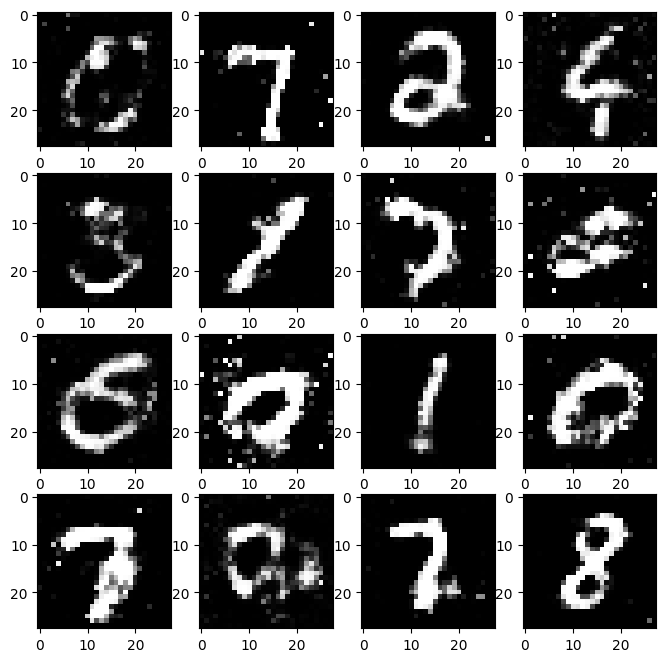

Epoch 66/200 (32.5%):
[0/60032] (0.0%)
D Error: 0.6157 G Error: 0.9181
D Real: 0.3608 D Fake: -0.4035
D_TP: 23.0000, D_FN: 105.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.1797, D_FPR: 0.1016


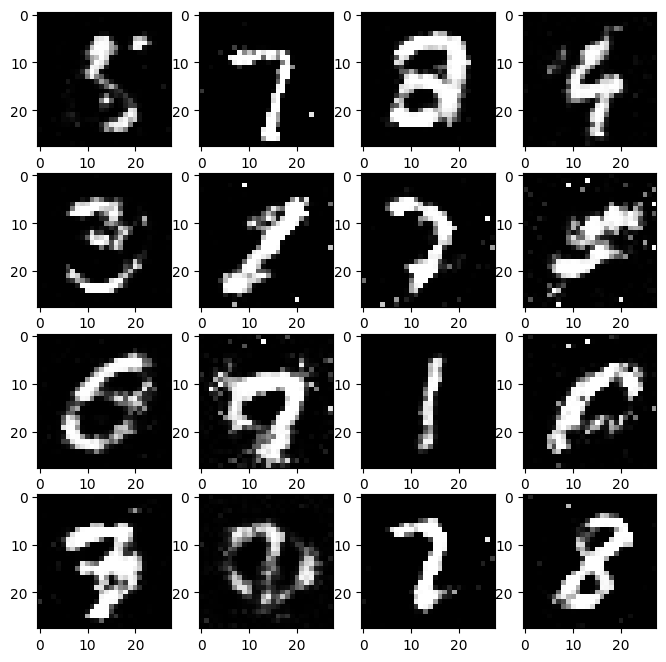

Epoch 67/200 (33.0%):
[0/60032] (0.0%)
D Error: 0.6098 G Error: 1.0314
D Real: 0.6148 D Fake: -0.5445
D_TP: 25.0000, D_FN: 103.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.1953, D_FPR: 0.0938


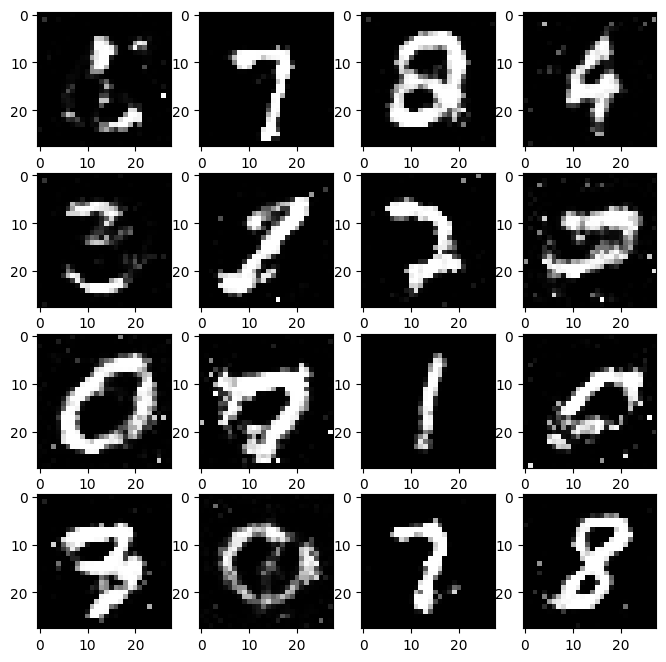

Epoch 68/200 (33.5%):
[0/60032] (0.0%)
D Error: 0.5498 G Error: 1.4253
D Real: 0.8510 D Fake: -0.4856
D_TP: 39.0000, D_FN: 89.0000, D_FP: 22.0000, D_TN: 106.0000, D_TPR: 0.3047, D_FPR: 0.1719


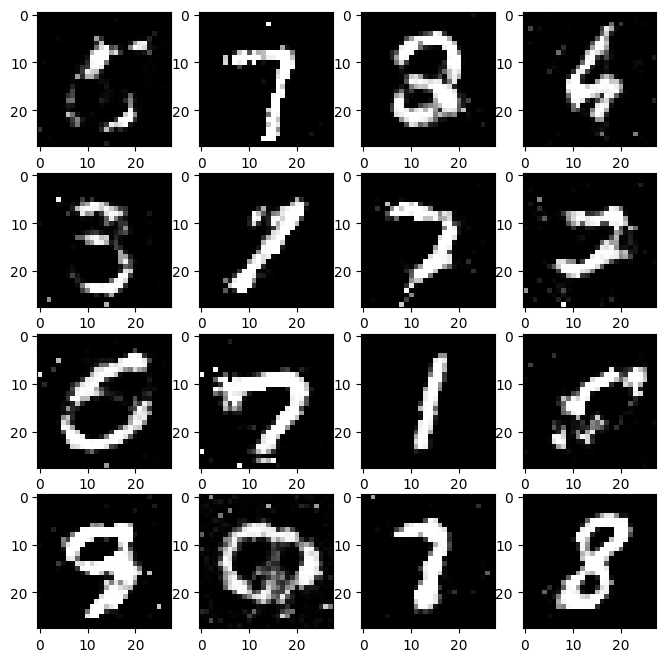

Epoch 69/200 (34.0%):
[0/60032] (0.0%)
D Error: 0.6128 G Error: 1.1197
D Real: 0.4130 D Fake: -0.3941
D_TP: 37.0000, D_FN: 91.0000, D_FP: 20.0000, D_TN: 108.0000, D_TPR: 0.2891, D_FPR: 0.1562


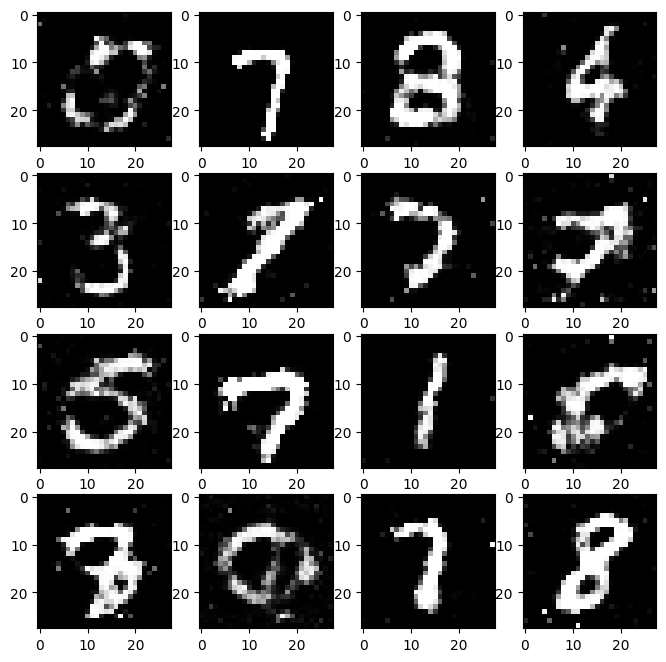

Epoch 70/200 (34.5%):
[0/60032] (0.0%)
D Error: 0.5903 G Error: 0.8879
D Real: 0.2470 D Fake: -0.4480
D_TP: 42.0000, D_FN: 86.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.3281, D_FPR: 0.0781


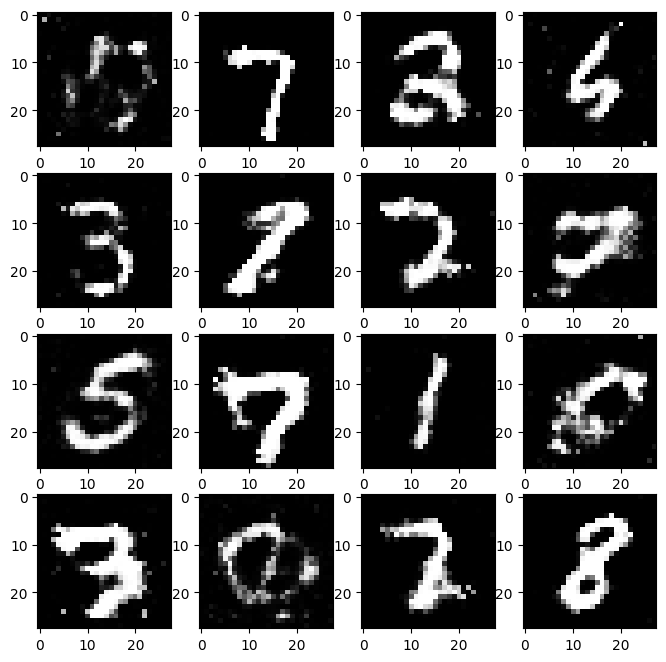

Epoch 71/200 (35.0%):
[0/60032] (0.0%)
D Error: 0.5830 G Error: 1.2820
D Real: 0.5319 D Fake: -0.5368
D_TP: 36.0000, D_FN: 92.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.2812, D_FPR: 0.0781


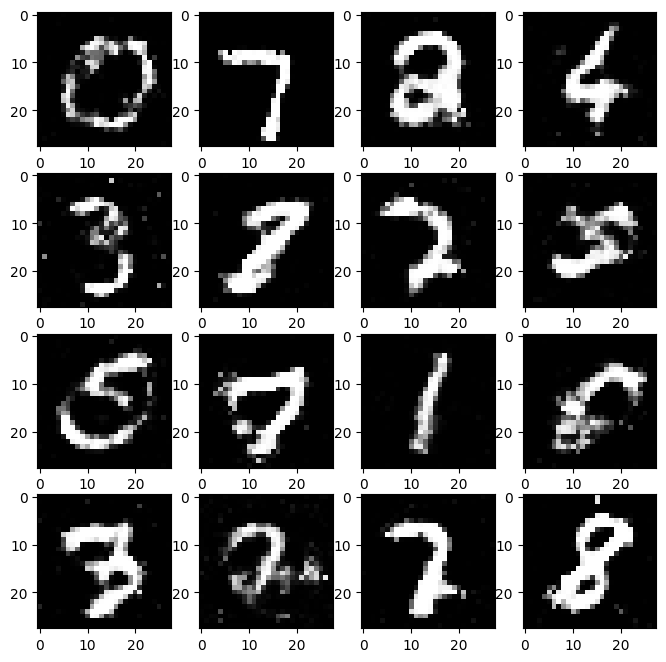

Epoch 72/200 (35.5%):
[0/60032] (0.0%)
D Error: 0.5767 G Error: 0.8447
D Real: 0.4448 D Fake: -0.3031
D_TP: 42.0000, D_FN: 86.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.3281, D_FPR: 0.1250


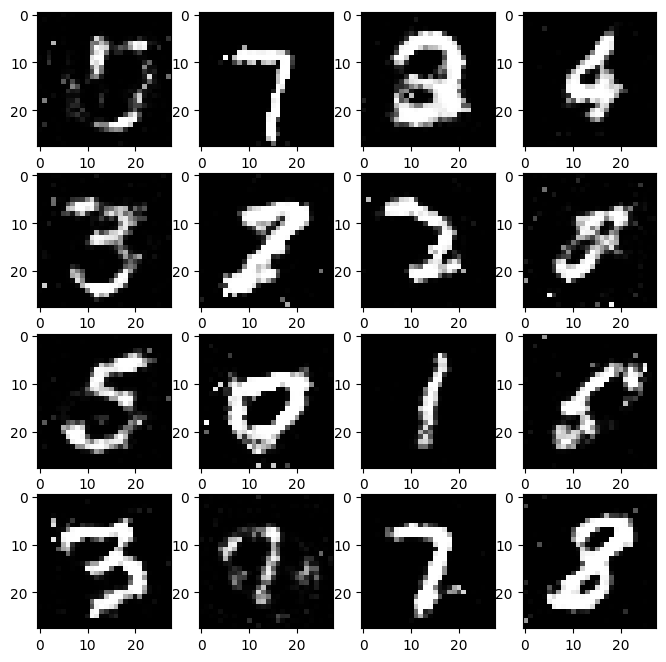

Epoch 73/200 (36.0%):
[0/60032] (0.0%)
D Error: 0.5905 G Error: 1.1774
D Real: 0.6246 D Fake: -0.6470
D_TP: 28.0000, D_FN: 100.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.2188, D_FPR: 0.1094


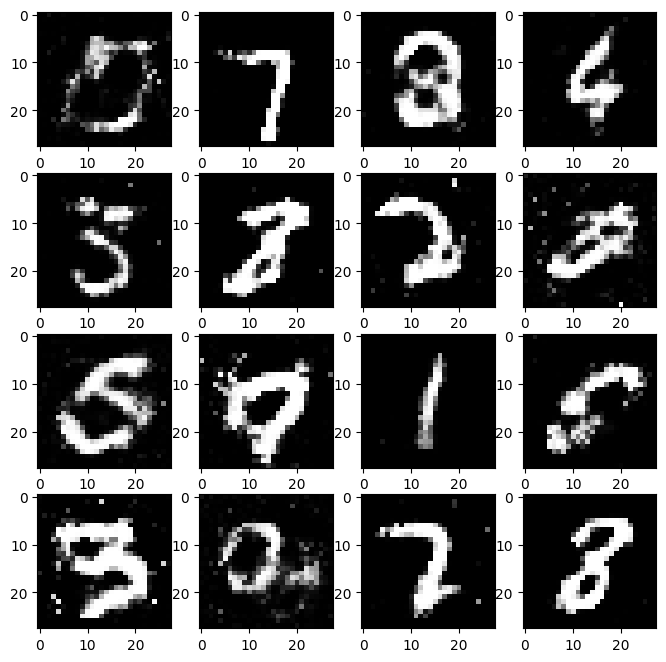

Epoch 74/200 (36.5%):
[0/60032] (0.0%)
D Error: 0.5863 G Error: 0.9064
D Real: 0.6682 D Fake: -0.2771
D_TP: 43.0000, D_FN: 85.0000, D_FP: 23.0000, D_TN: 105.0000, D_TPR: 0.3359, D_FPR: 0.1797


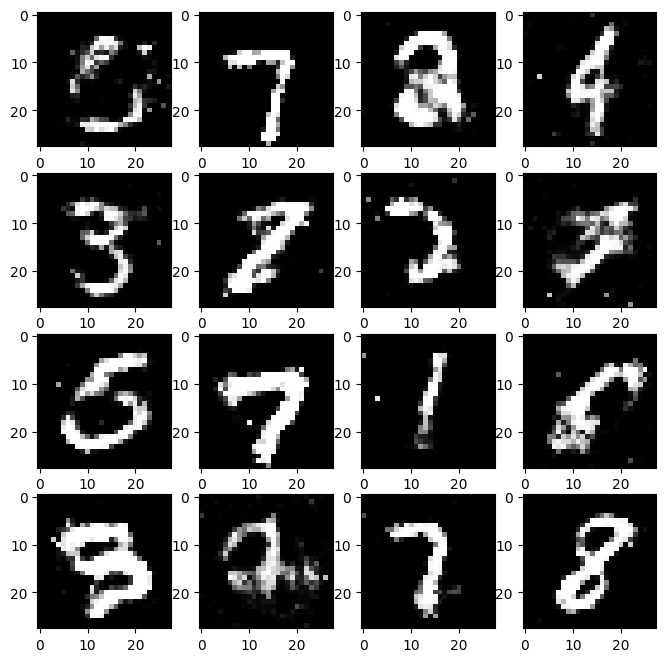

Epoch 75/200 (37.0%):
[0/60032] (0.0%)
D Error: 0.6349 G Error: 0.8011
D Real: 0.7267 D Fake: -0.0799
D_TP: 42.0000, D_FN: 86.0000, D_FP: 18.0000, D_TN: 110.0000, D_TPR: 0.3281, D_FPR: 0.1406


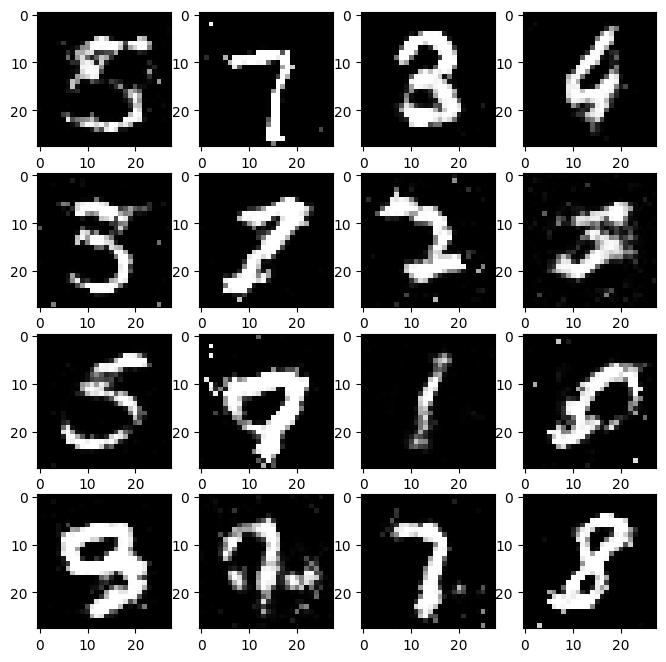

Epoch 76/200 (37.5%):
[0/60032] (0.0%)
D Error: 0.5346 G Error: 1.2288
D Real: 0.8828 D Fake: -0.5164
D_TP: 44.0000, D_FN: 84.0000, D_FP: 17.0000, D_TN: 111.0000, D_TPR: 0.3438, D_FPR: 0.1328


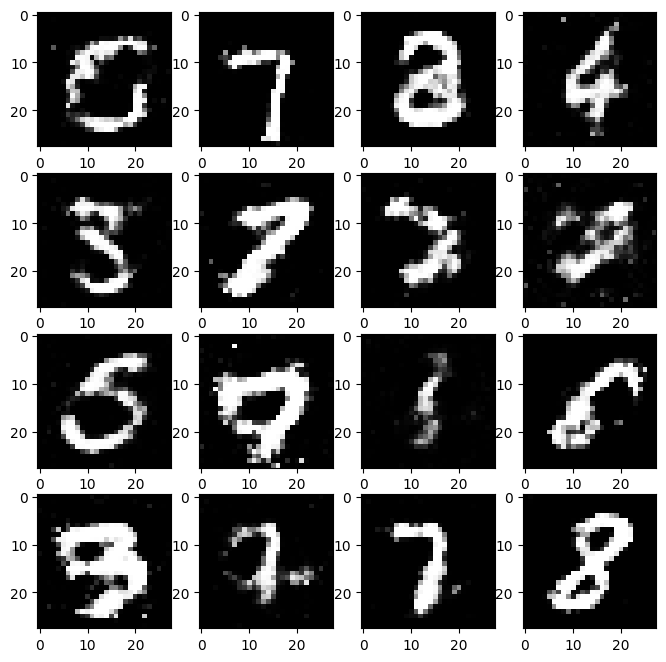

Epoch 77/200 (38.0%):
[0/60032] (0.0%)
D Error: 0.5570 G Error: 1.0524
D Real: 0.4832 D Fake: -0.6332
D_TP: 36.0000, D_FN: 92.0000, D_FP: 9.0000, D_TN: 119.0000, D_TPR: 0.2812, D_FPR: 0.0703


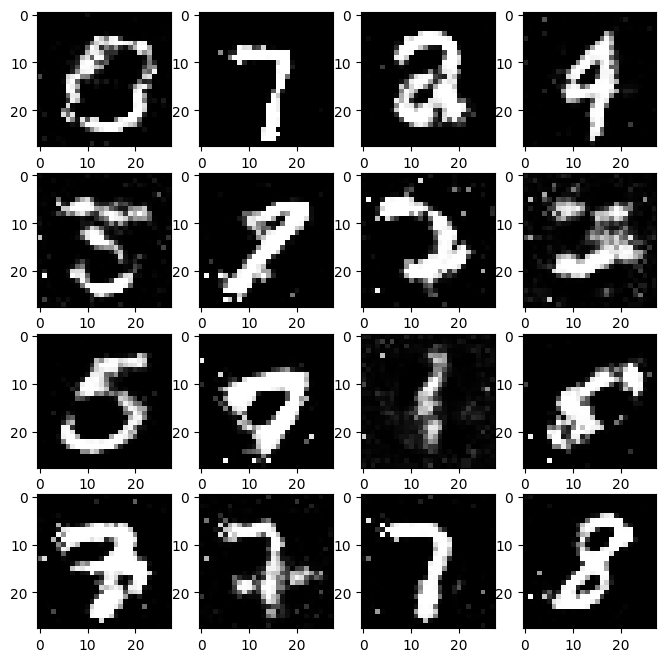

Epoch 78/200 (38.5%):
[0/60032] (0.0%)
D Error: 0.6176 G Error: 1.0102
D Real: 0.4384 D Fake: -0.3503
D_TP: 30.0000, D_FN: 98.0000, D_FP: 19.0000, D_TN: 109.0000, D_TPR: 0.2344, D_FPR: 0.1484


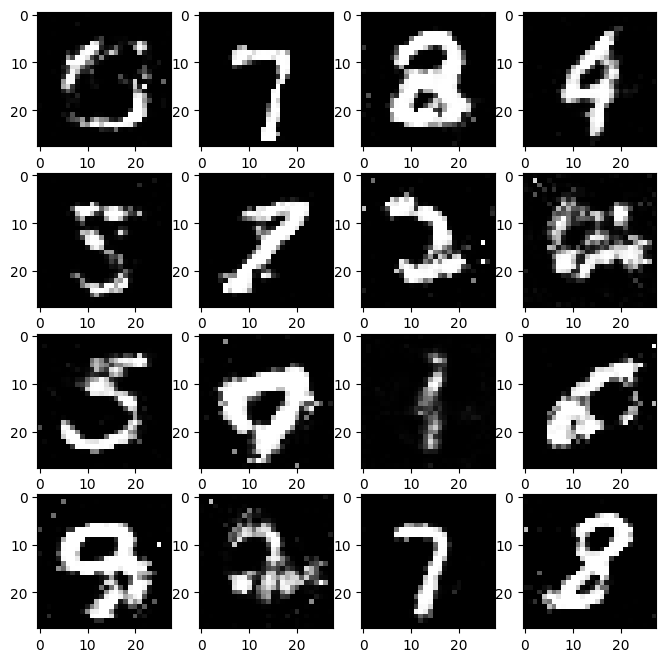

Epoch 79/200 (39.0%):
[0/60032] (0.0%)
D Error: 0.5226 G Error: 1.0808
D Real: 0.8285 D Fake: -0.5366
D_TP: 41.0000, D_FN: 87.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.3203, D_FPR: 0.1250


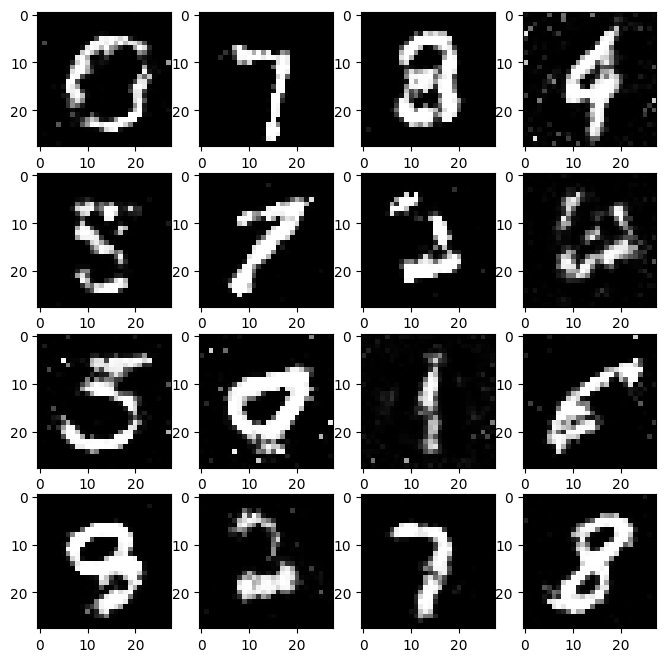

Epoch 80/200 (39.5%):
[0/60032] (0.0%)
D Error: 0.6012 G Error: 0.9930
D Real: 0.2426 D Fake: -0.5232
D_TP: 30.0000, D_FN: 98.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.2344, D_FPR: 0.0781


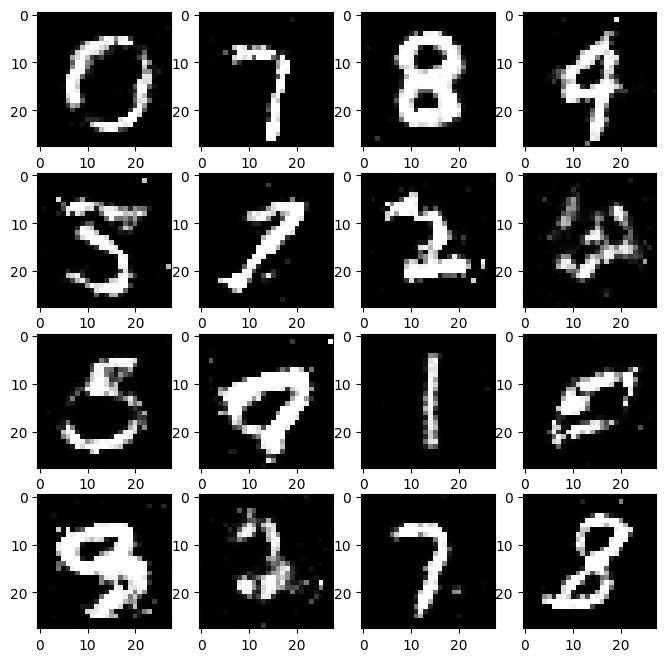

Epoch 81/200 (40.0%):
[0/60032] (0.0%)
D Error: 0.5854 G Error: 1.0646
D Real: 0.4440 D Fake: -0.5177
D_TP: 37.0000, D_FN: 91.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.2891, D_FPR: 0.1094


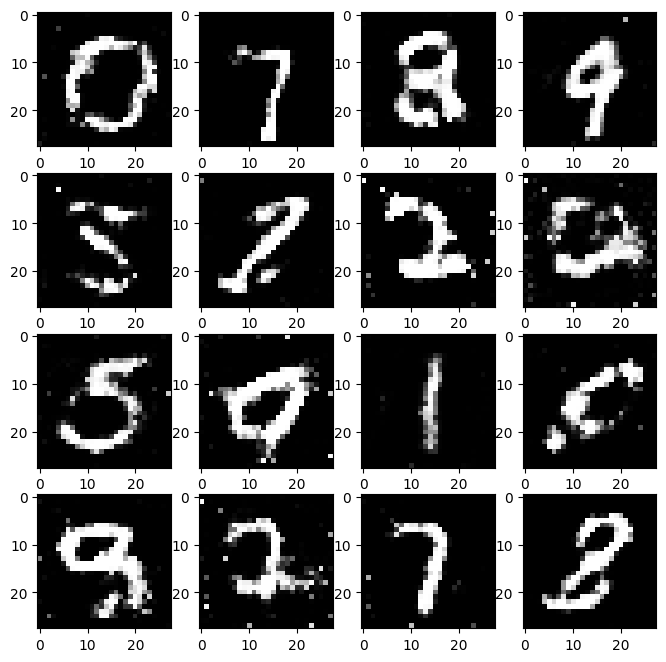

Epoch 82/200 (40.5%):
[0/60032] (0.0%)
D Error: 0.5467 G Error: 1.2183
D Real: 0.4932 D Fake: -0.5228
D_TP: 36.0000, D_FN: 92.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.2812, D_FPR: 0.0781


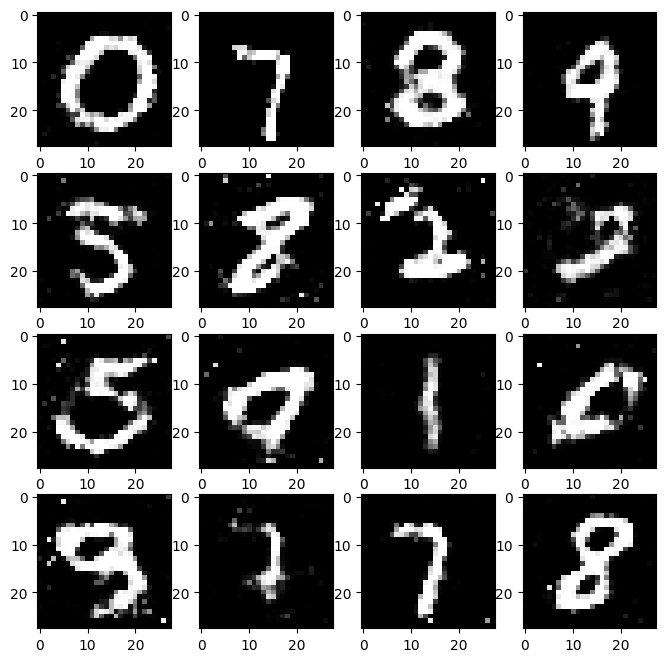

Epoch 83/200 (41.0%):
[0/60032] (0.0%)
D Error: 0.6589 G Error: 1.0335
D Real: 0.2259 D Fake: -0.4012
D_TP: 26.0000, D_FN: 102.0000, D_FP: 15.0000, D_TN: 113.0000, D_TPR: 0.2031, D_FPR: 0.1172


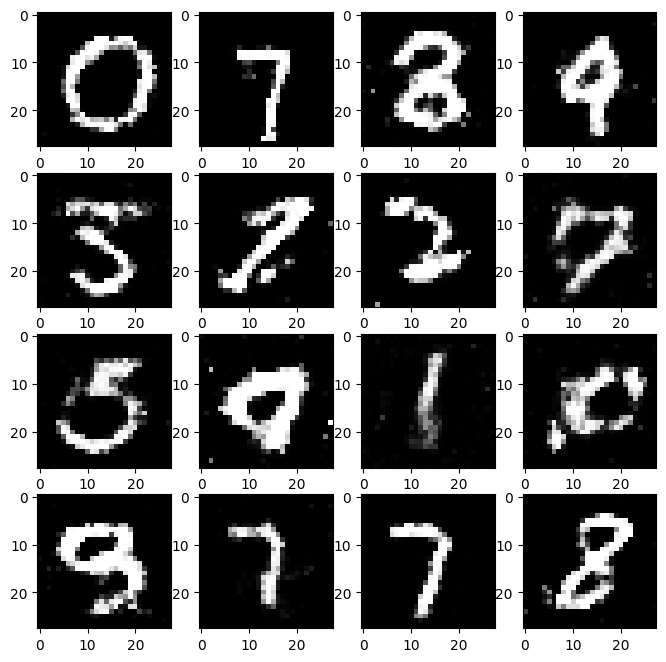

Epoch 84/200 (41.5%):
[0/60032] (0.0%)
D Error: 0.5778 G Error: 1.0561
D Real: 0.4586 D Fake: -0.3825
D_TP: 43.0000, D_FN: 85.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.3359, D_FPR: 0.0938


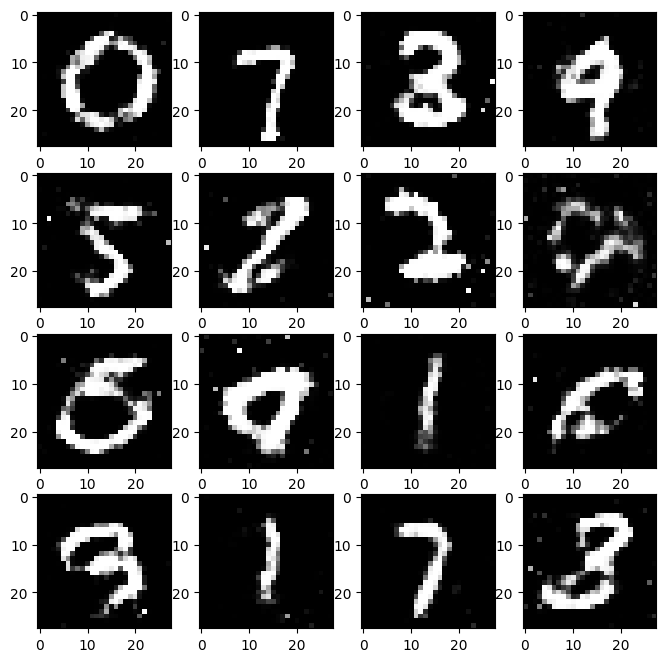

Epoch 85/200 (42.0%):
[0/60032] (0.0%)
D Error: 0.5645 G Error: 1.1131
D Real: 0.5246 D Fake: -0.5794
D_TP: 40.0000, D_FN: 88.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.3125, D_FPR: 0.0938


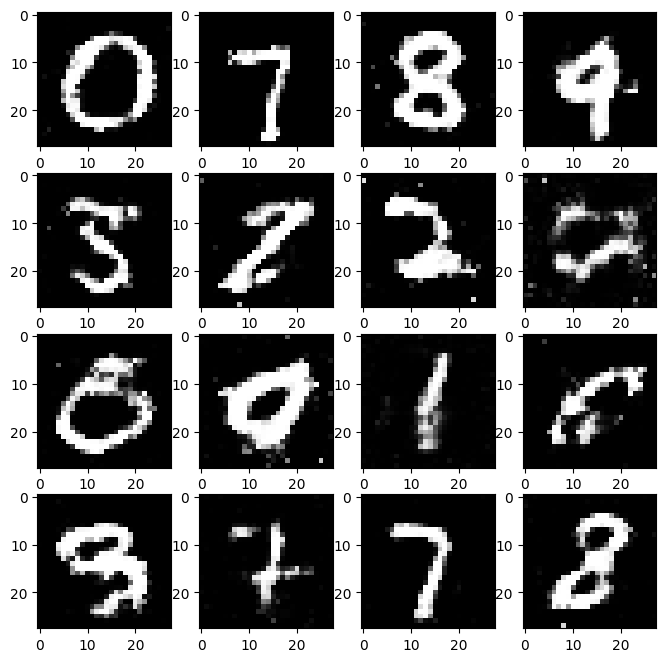

Epoch 86/200 (42.5%):
[0/60032] (0.0%)
D Error: 0.5625 G Error: 1.0951
D Real: 0.4896 D Fake: -0.6315
D_TP: 40.0000, D_FN: 88.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.3125, D_FPR: 0.1094


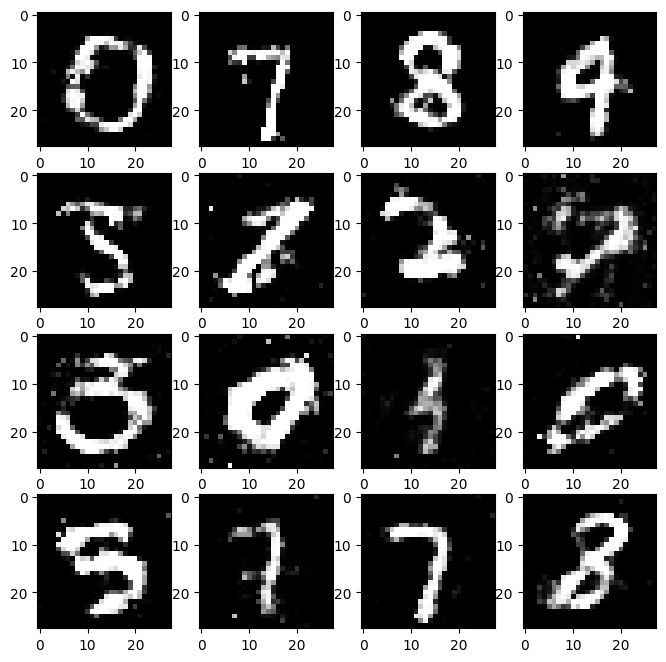

Epoch 87/200 (43.0%):
[0/60032] (0.0%)
D Error: 0.5918 G Error: 1.0369
D Real: 0.8060 D Fake: -0.2787
D_TP: 38.0000, D_FN: 90.0000, D_FP: 25.0000, D_TN: 103.0000, D_TPR: 0.2969, D_FPR: 0.1953


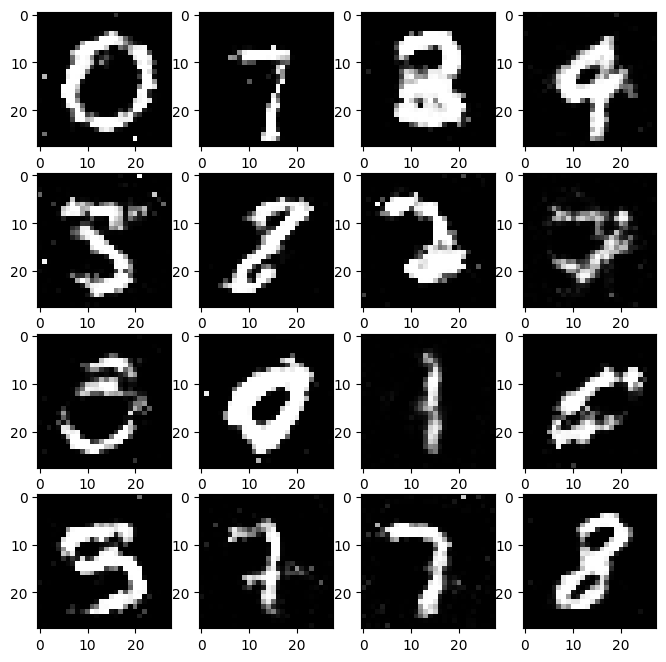

Epoch 88/200 (43.5%):
[0/60032] (0.0%)
D Error: 0.5439 G Error: 1.0768
D Real: 0.8483 D Fake: -0.3722
D_TP: 48.0000, D_FN: 80.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.3750, D_FPR: 0.0859


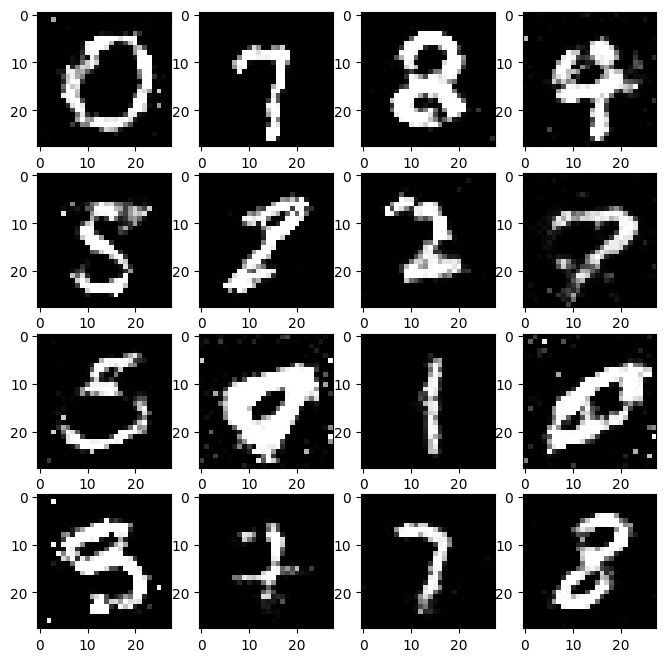

Epoch 89/200 (44.0%):
[0/60032] (0.0%)
D Error: 0.5389 G Error: 1.0849
D Real: 0.3775 D Fake: -0.6907
D_TP: 35.0000, D_FN: 93.0000, D_FP: 7.0000, D_TN: 121.0000, D_TPR: 0.2734, D_FPR: 0.0547


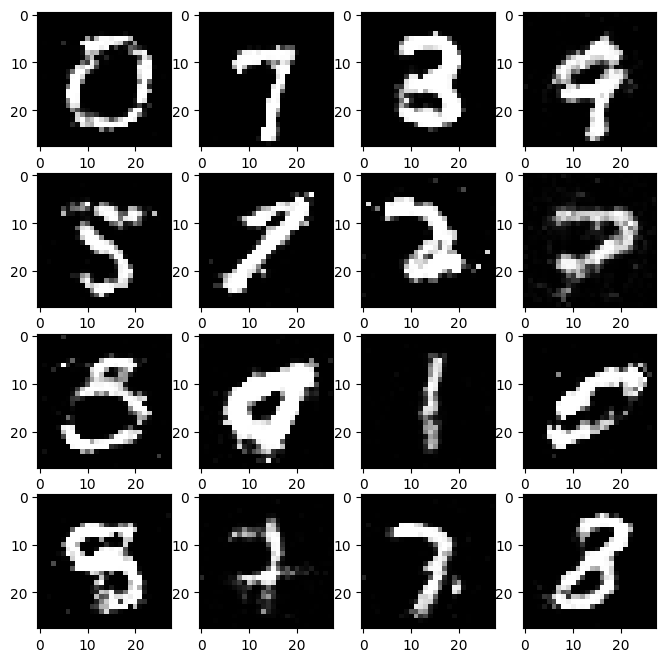

Epoch 90/200 (44.5%):
[0/60032] (0.0%)
D Error: 0.6016 G Error: 0.9994
D Real: 0.4416 D Fake: -0.4942
D_TP: 40.0000, D_FN: 88.0000, D_FP: 17.0000, D_TN: 111.0000, D_TPR: 0.3125, D_FPR: 0.1328


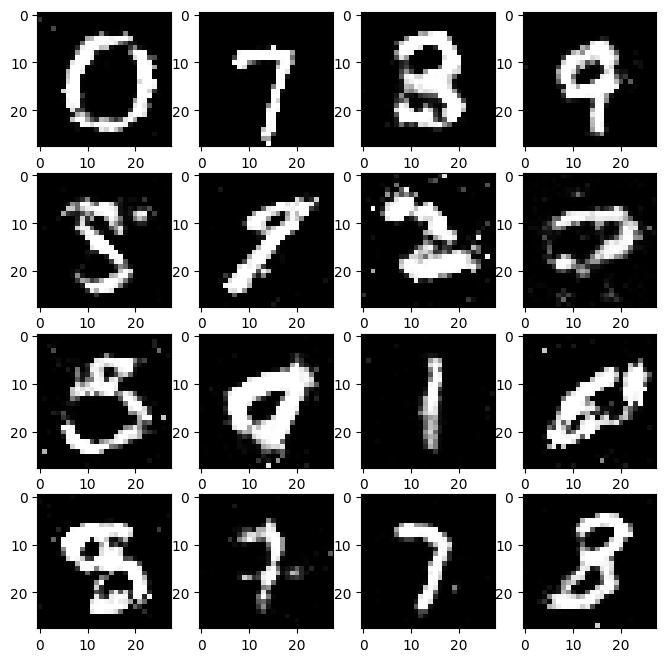

Epoch 91/200 (45.0%):
[0/60032] (0.0%)
D Error: 0.5784 G Error: 1.1688
D Real: 0.7114 D Fake: -0.4015
D_TP: 43.0000, D_FN: 85.0000, D_FP: 22.0000, D_TN: 106.0000, D_TPR: 0.3359, D_FPR: 0.1719


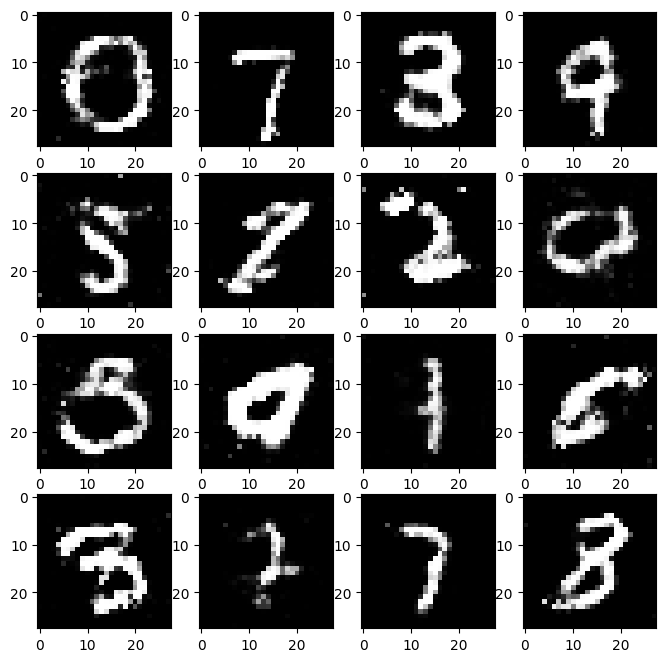

Epoch 92/200 (45.5%):
[0/60032] (0.0%)
D Error: 0.5850 G Error: 0.9530
D Real: 0.2827 D Fake: -0.3592
D_TP: 40.0000, D_FN: 88.0000, D_FP: 7.0000, D_TN: 121.0000, D_TPR: 0.3125, D_FPR: 0.0547


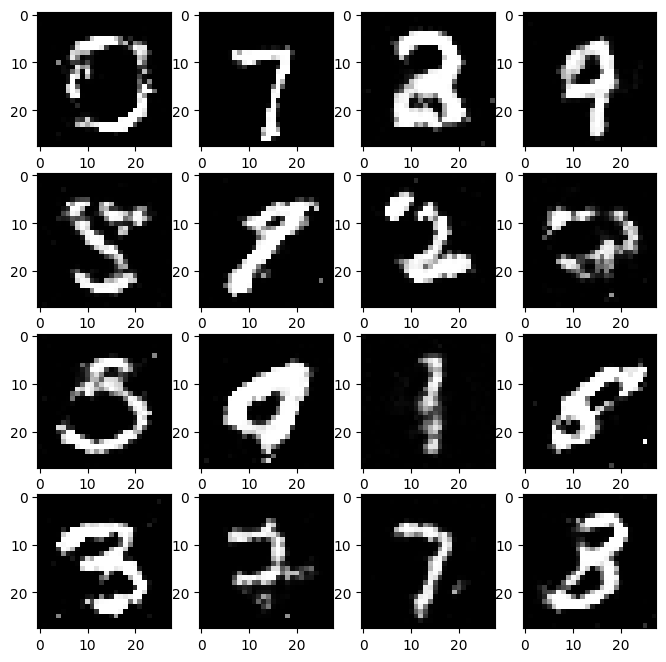

Epoch 93/200 (46.0%):
[0/60032] (0.0%)
D Error: 0.5794 G Error: 1.0252
D Real: 0.4018 D Fake: -0.5130
D_TP: 41.0000, D_FN: 87.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.3203, D_FPR: 0.1016


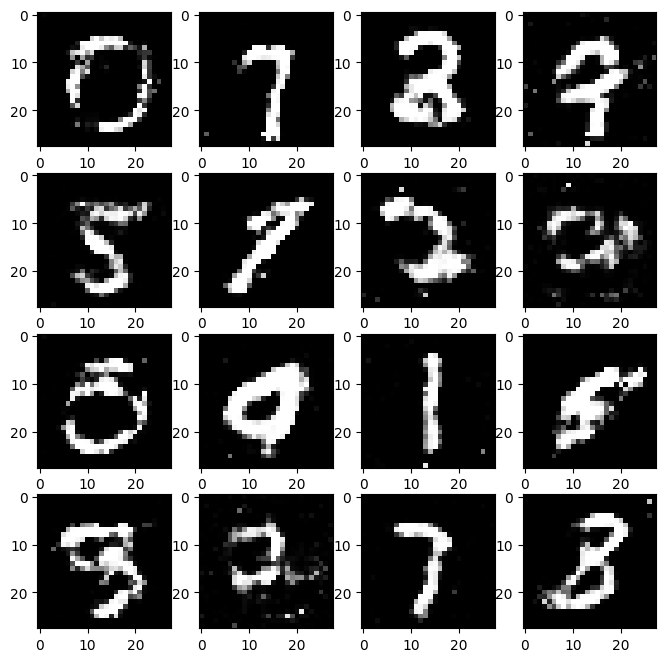

Epoch 94/200 (46.5%):
[0/60032] (0.0%)
D Error: 0.5262 G Error: 1.2926
D Real: 0.4663 D Fake: -0.7691
D_TP: 40.0000, D_FN: 88.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.3125, D_FPR: 0.0781


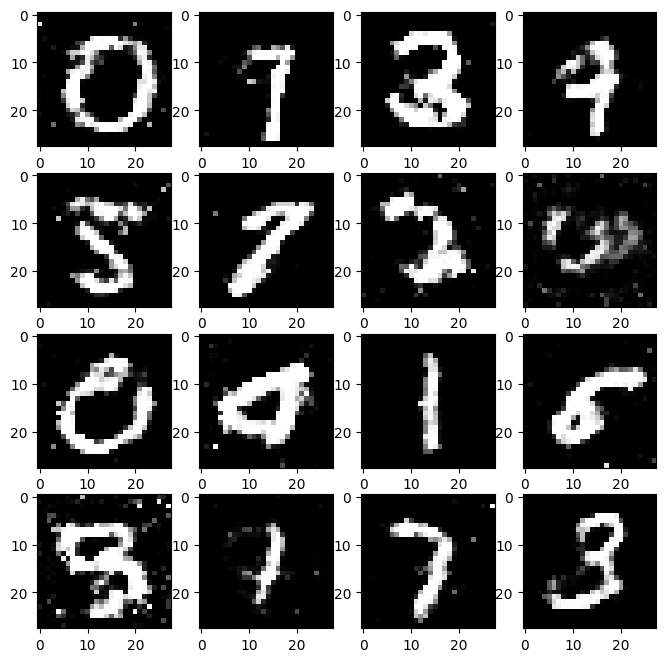

Epoch 95/200 (47.0%):
[0/60032] (0.0%)
D Error: 0.5734 G Error: 1.1239
D Real: 0.5796 D Fake: -0.4043
D_TP: 39.0000, D_FN: 89.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.3047, D_FPR: 0.0859


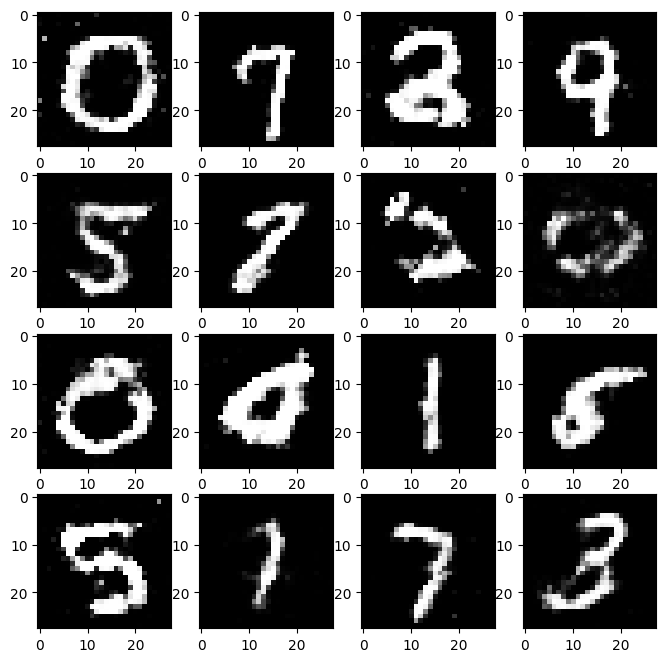

Epoch 96/200 (47.5%):
[0/60032] (0.0%)
D Error: 0.6292 G Error: 0.9950
D Real: 0.7106 D Fake: -0.1686
D_TP: 36.0000, D_FN: 92.0000, D_FP: 27.0000, D_TN: 101.0000, D_TPR: 0.2812, D_FPR: 0.2109


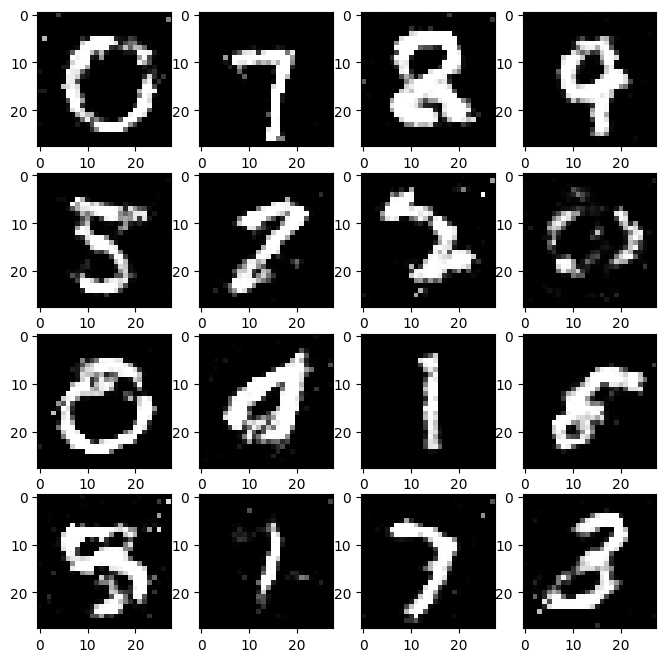

Epoch 97/200 (48.0%):
[0/60032] (0.0%)
D Error: 0.6279 G Error: 0.8263
D Real: 0.4314 D Fake: -0.2394
D_TP: 40.0000, D_FN: 88.0000, D_FP: 20.0000, D_TN: 108.0000, D_TPR: 0.3125, D_FPR: 0.1562


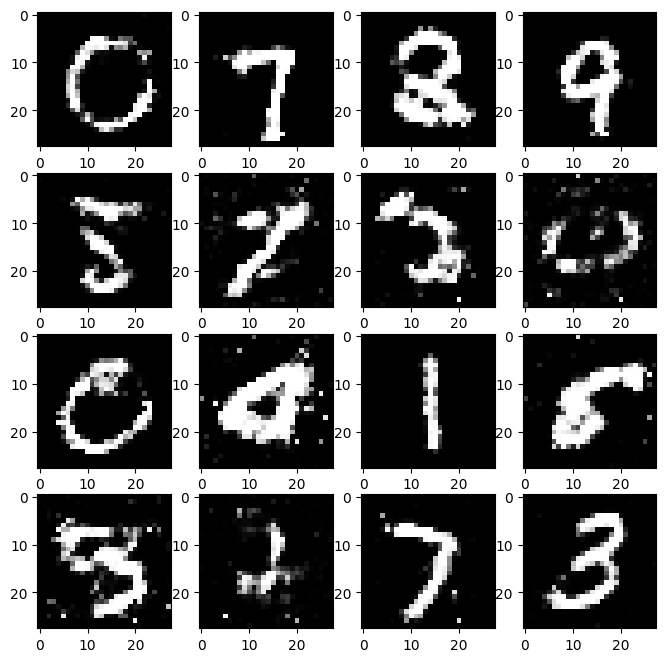

Epoch 98/200 (48.5%):
[0/60032] (0.0%)
D Error: 0.6457 G Error: 0.9844
D Real: 0.1153 D Fake: -0.3502
D_TP: 28.0000, D_FN: 100.0000, D_FP: 9.0000, D_TN: 119.0000, D_TPR: 0.2188, D_FPR: 0.0703


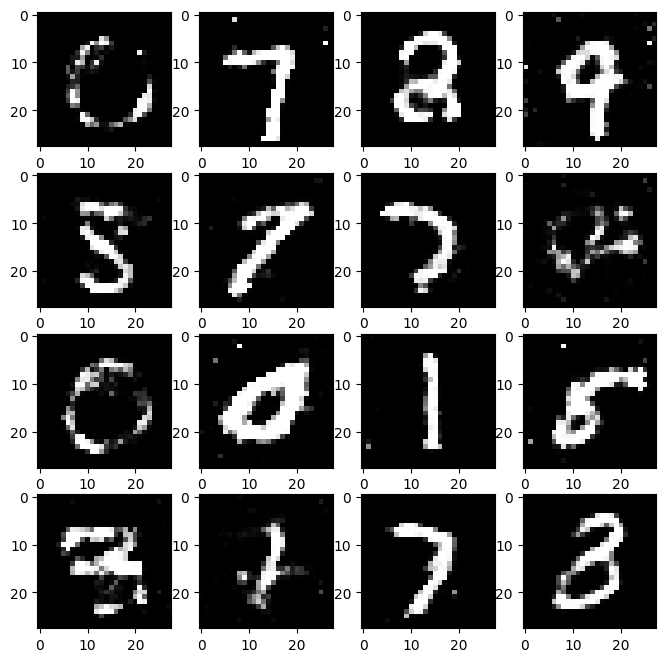

Epoch 99/200 (49.0%):
[0/60032] (0.0%)
D Error: 0.5675 G Error: 0.9897
D Real: 0.5100 D Fake: -0.6258
D_TP: 34.0000, D_FN: 94.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.2656, D_FPR: 0.0938


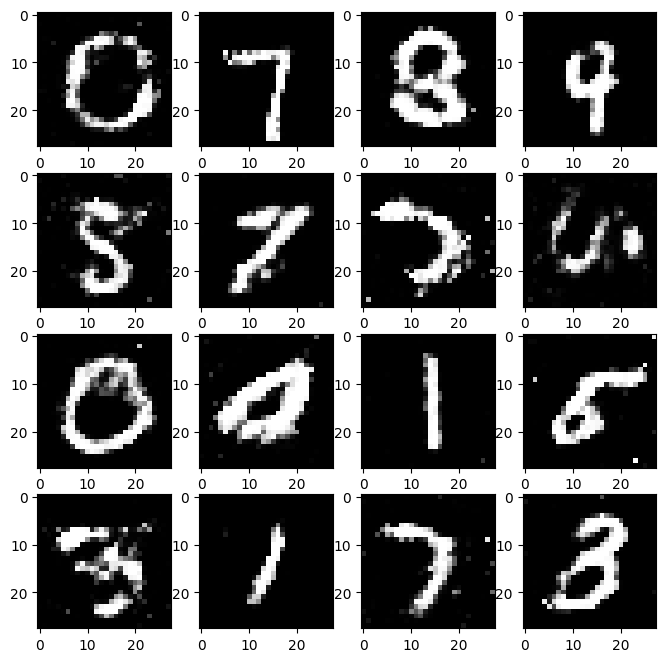

Epoch 100/200 (49.5%):
[0/60032] (0.0%)
D Error: 0.7313 G Error: 0.8027
D Real: 0.2743 D Fake: 0.1215
D_TP: 44.0000, D_FN: 84.0000, D_FP: 27.0000, D_TN: 101.0000, D_TPR: 0.3438, D_FPR: 0.2109


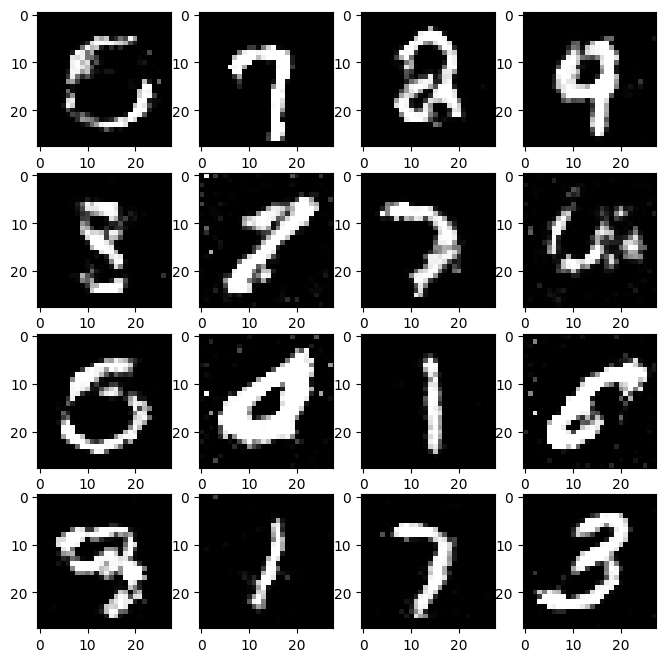

Epoch 101/200 (50.0%):
[0/60032] (0.0%)
D Error: 0.6231 G Error: 0.9876
D Real: 0.3401 D Fake: -0.4125
D_TP: 26.0000, D_FN: 102.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.2031, D_FPR: 0.1016


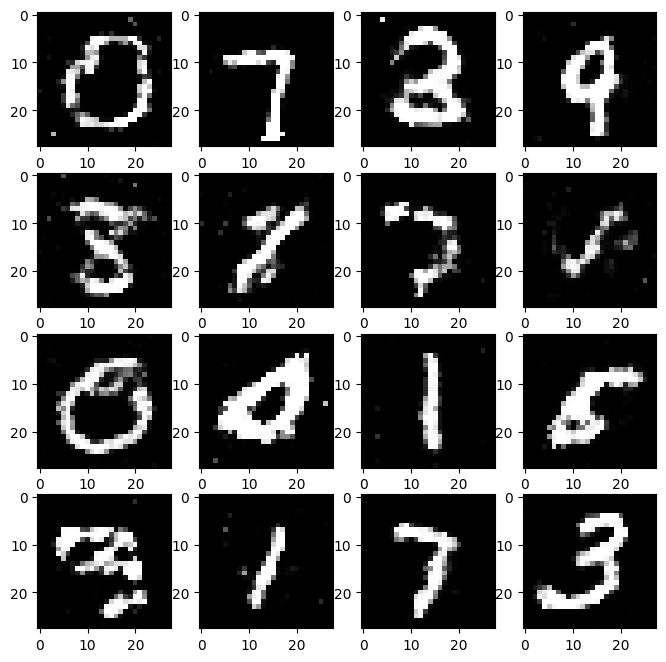

Epoch 102/200 (50.5%):
[0/60032] (0.0%)
D Error: 0.6441 G Error: 0.8266
D Real: 0.2248 D Fake: -0.2525
D_TP: 36.0000, D_FN: 92.0000, D_FP: 17.0000, D_TN: 111.0000, D_TPR: 0.2812, D_FPR: 0.1328


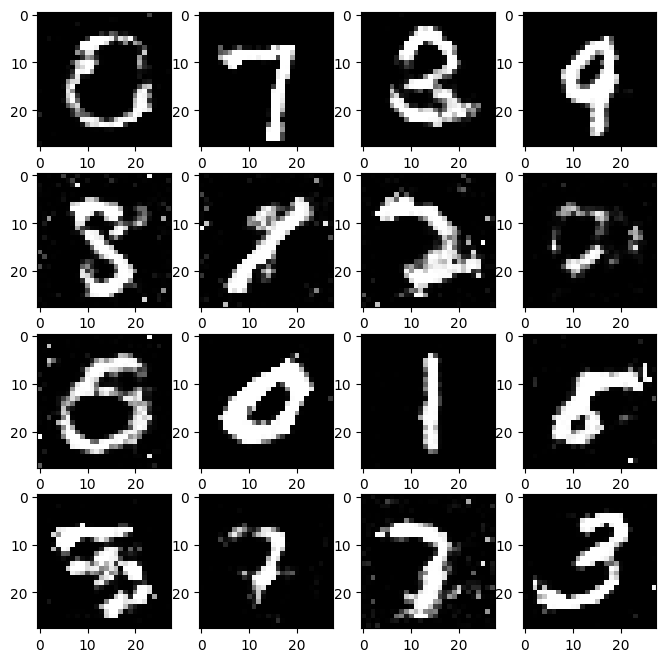

Epoch 103/200 (51.0%):
[0/60032] (0.0%)
D Error: 0.6155 G Error: 0.8870
D Real: 0.2664 D Fake: -0.2234
D_TP: 35.0000, D_FN: 93.0000, D_FP: 5.0000, D_TN: 123.0000, D_TPR: 0.2734, D_FPR: 0.0391


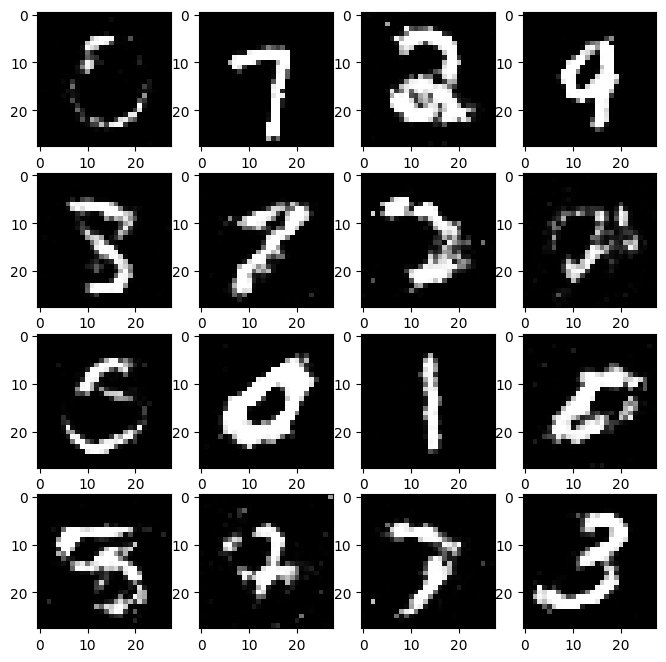

Epoch 104/200 (51.5%):
[0/60032] (0.0%)
D Error: 0.6093 G Error: 1.0634
D Real: 0.3199 D Fake: -0.4953
D_TP: 24.0000, D_FN: 104.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.1875, D_FPR: 0.0859


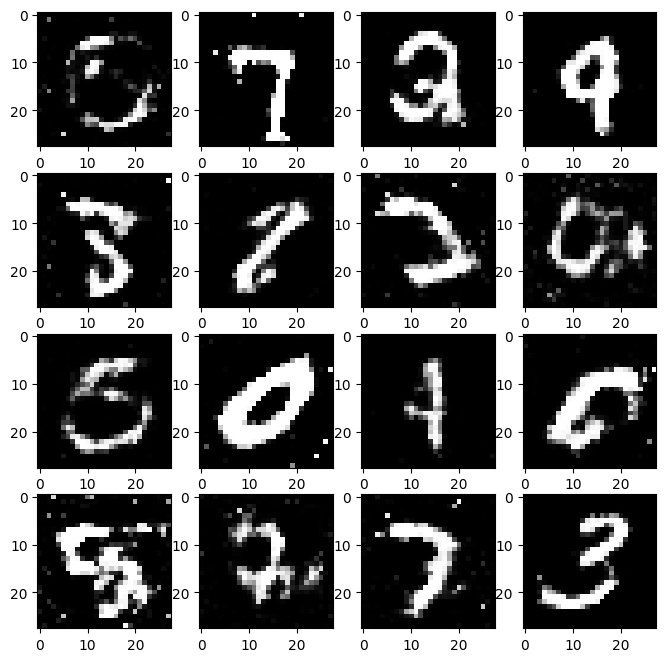

Epoch 105/200 (52.0%):
[0/60032] (0.0%)
D Error: 0.5821 G Error: 0.8728
D Real: 0.5917 D Fake: -0.1830
D_TP: 38.0000, D_FN: 90.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.2969, D_FPR: 0.1094


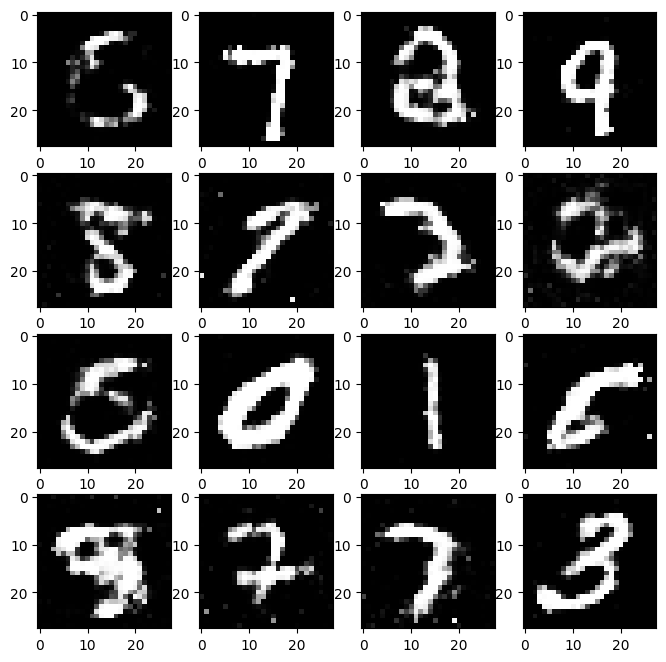

Epoch 106/200 (52.5%):
[0/60032] (0.0%)
D Error: 0.6287 G Error: 0.8465
D Real: 0.3078 D Fake: -0.2220
D_TP: 32.0000, D_FN: 96.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.2500, D_FPR: 0.1250


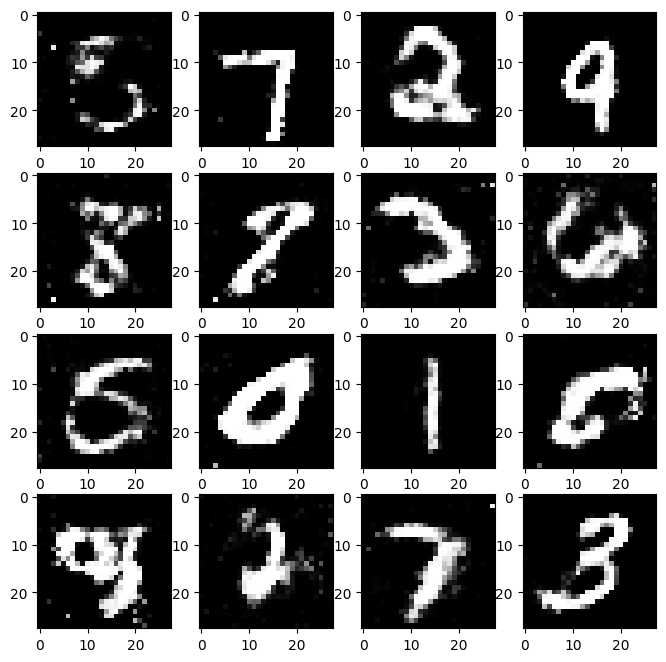

Epoch 107/200 (53.0%):
[0/60032] (0.0%)
D Error: 0.6010 G Error: 0.9954
D Real: 0.3013 D Fake: -0.3205
D_TP: 34.0000, D_FN: 94.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.2656, D_FPR: 0.0859


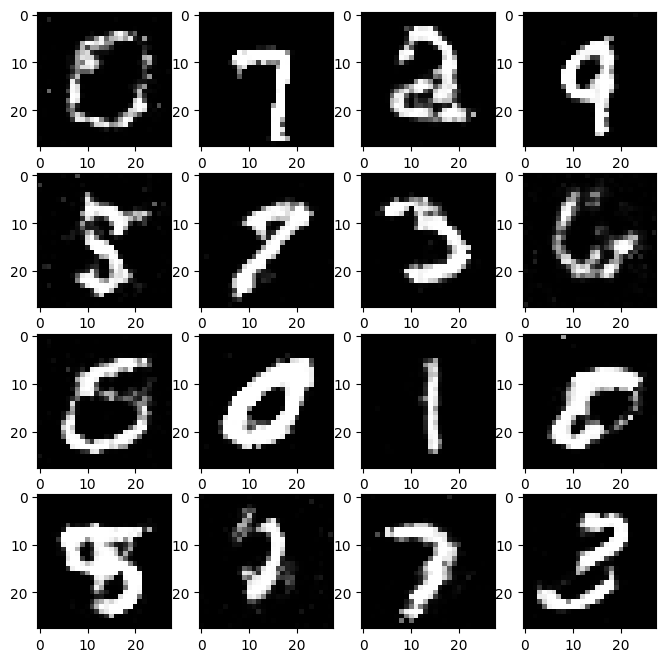

Epoch 108/200 (53.5%):
[0/60032] (0.0%)
D Error: 0.6085 G Error: 0.8533
D Real: 0.5805 D Fake: -0.1823
D_TP: 41.0000, D_FN: 87.0000, D_FP: 18.0000, D_TN: 110.0000, D_TPR: 0.3203, D_FPR: 0.1406


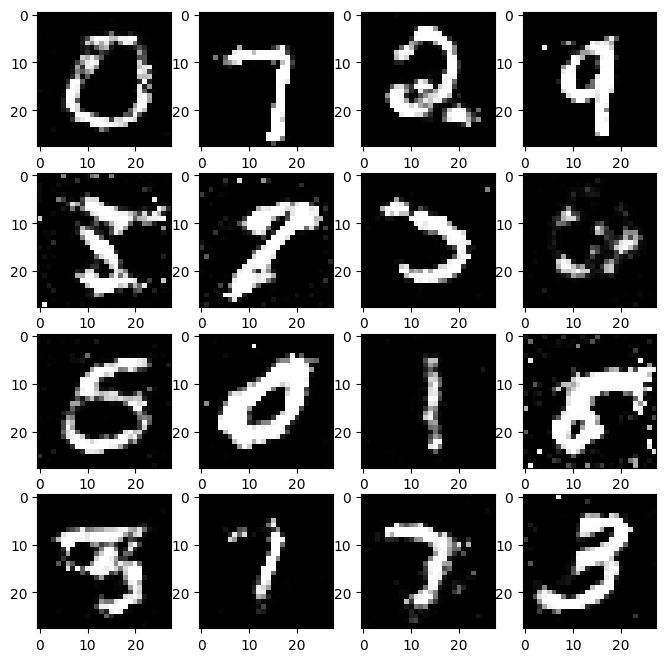

Epoch 109/200 (54.0%):
[0/60032] (0.0%)
D Error: 0.6045 G Error: 0.8426
D Real: 0.3001 D Fake: -0.2658
D_TP: 35.0000, D_FN: 93.0000, D_FP: 5.0000, D_TN: 123.0000, D_TPR: 0.2734, D_FPR: 0.0391


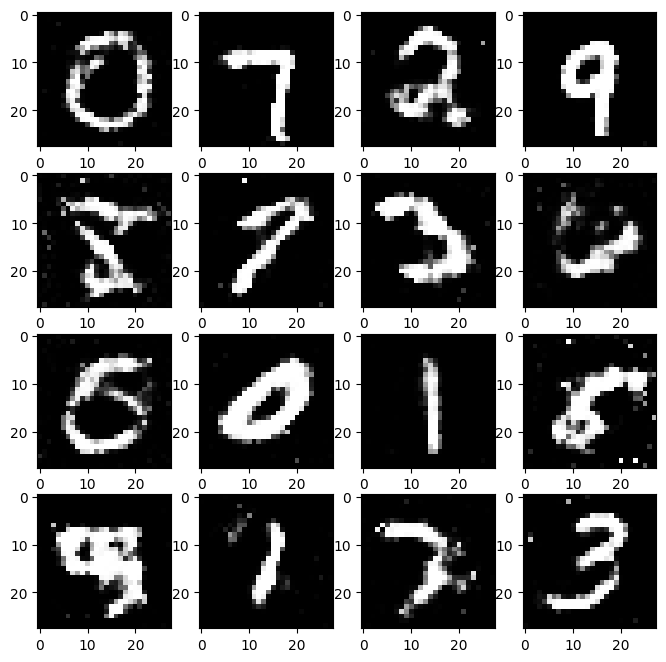

Epoch 110/200 (54.5%):
[0/60032] (0.0%)
D Error: 0.6560 G Error: 0.9499
D Real: 0.1295 D Fake: -0.2744
D_TP: 31.0000, D_FN: 97.0000, D_FP: 17.0000, D_TN: 111.0000, D_TPR: 0.2422, D_FPR: 0.1328


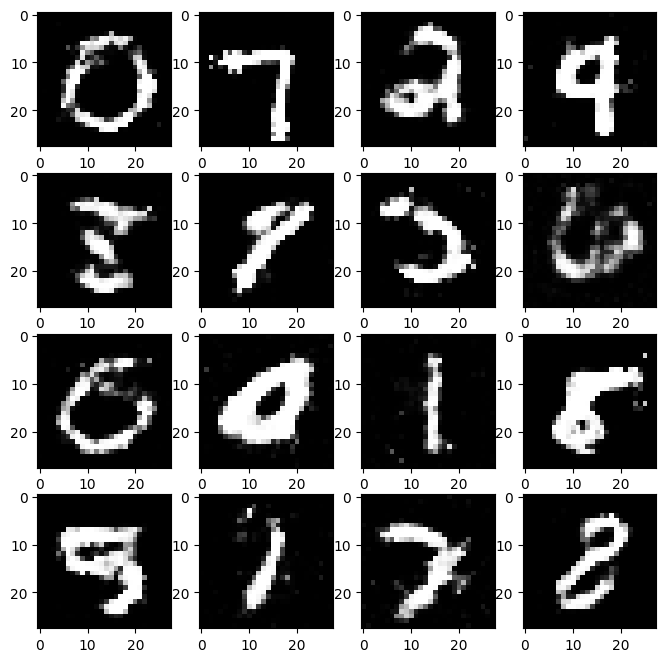

Epoch 111/200 (55.0%):
[0/60032] (0.0%)
D Error: 0.6201 G Error: 0.9518
D Real: 0.6822 D Fake: -0.1617
D_TP: 41.0000, D_FN: 87.0000, D_FP: 18.0000, D_TN: 110.0000, D_TPR: 0.3203, D_FPR: 0.1406


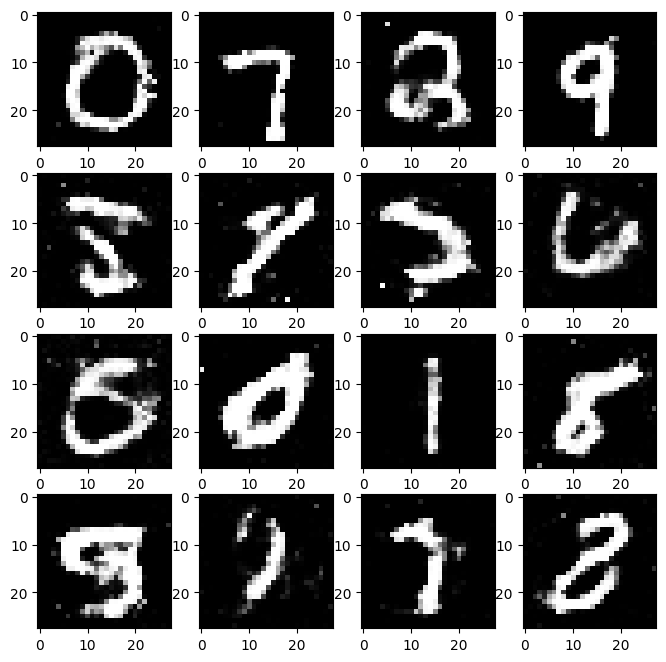

Epoch 112/200 (55.5%):
[0/60032] (0.0%)
D Error: 0.6409 G Error: 1.0201
D Real: 0.4819 D Fake: -0.1511
D_TP: 31.0000, D_FN: 97.0000, D_FP: 21.0000, D_TN: 107.0000, D_TPR: 0.2422, D_FPR: 0.1641


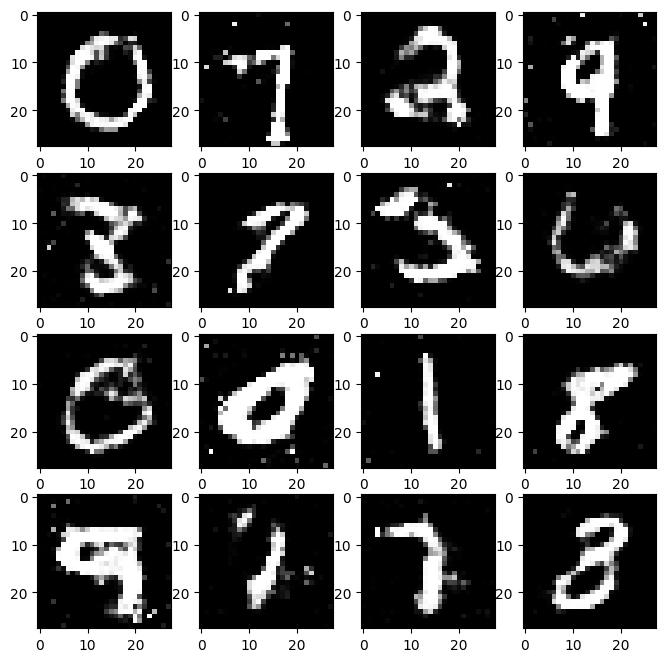

Epoch 113/200 (56.0%):
[0/60032] (0.0%)
D Error: 0.6290 G Error: 0.8258
D Real: 0.2261 D Fake: -0.2294
D_TP: 30.0000, D_FN: 98.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.2344, D_FPR: 0.0938


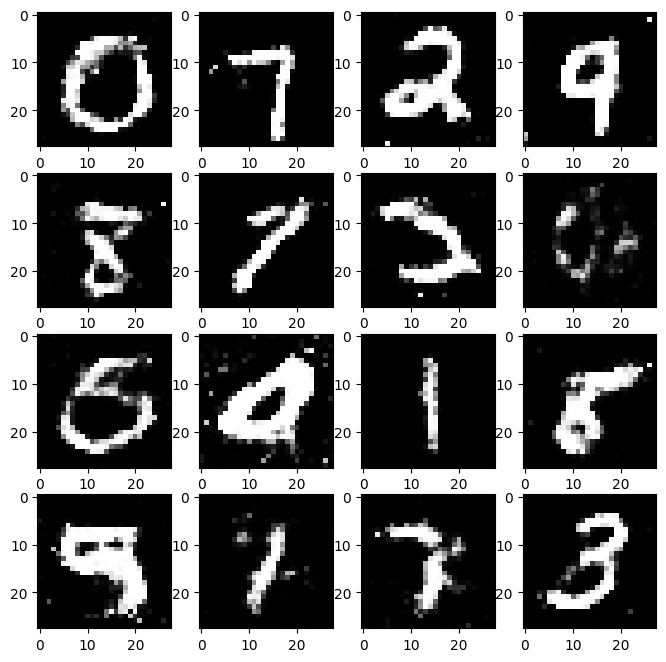

Epoch 114/200 (56.5%):
[0/60032] (0.0%)
D Error: 0.6181 G Error: 1.1222
D Real: 0.4038 D Fake: -0.2287
D_TP: 35.0000, D_FN: 93.0000, D_FP: 20.0000, D_TN: 108.0000, D_TPR: 0.2734, D_FPR: 0.1562


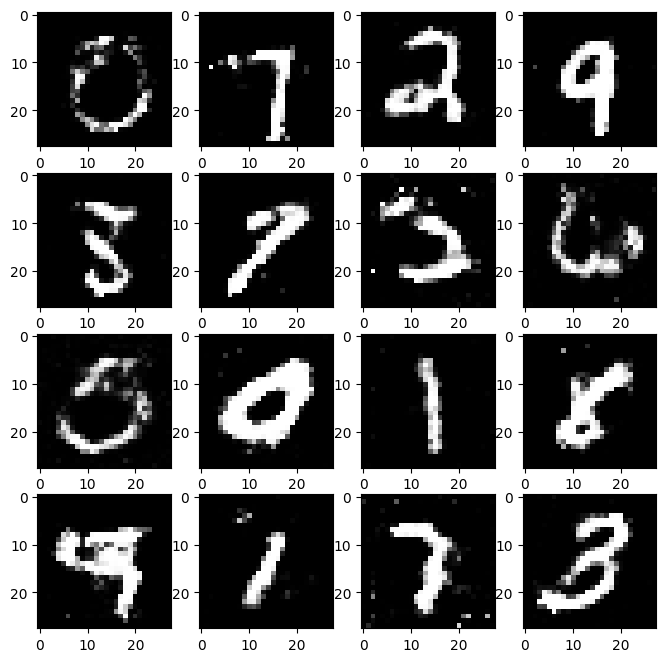

Epoch 115/200 (57.0%):
[0/60032] (0.0%)
D Error: 0.6571 G Error: 0.9502
D Real: 0.6519 D Fake: 0.0277
D_TP: 40.0000, D_FN: 88.0000, D_FP: 31.0000, D_TN: 97.0000, D_TPR: 0.3125, D_FPR: 0.2422


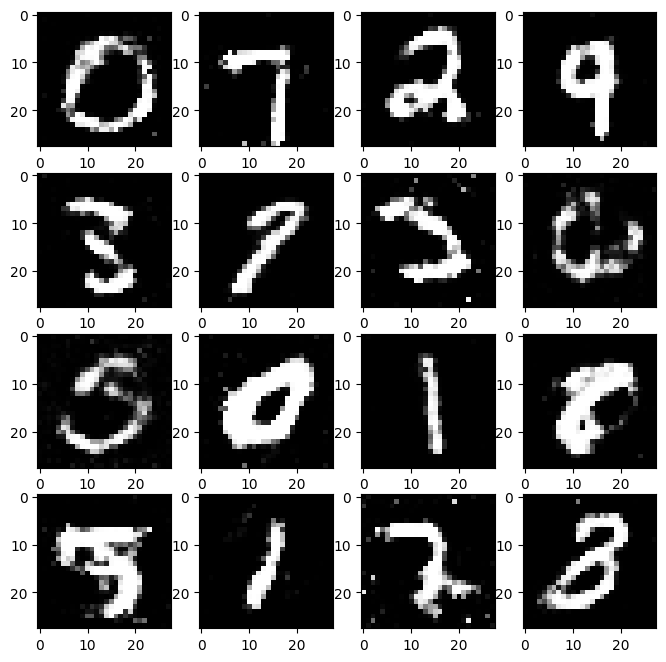

Epoch 116/200 (57.5%):
[0/60032] (0.0%)
D Error: 0.6277 G Error: 0.8889
D Real: 0.0504 D Fake: -0.3934
D_TP: 23.0000, D_FN: 105.0000, D_FP: 5.0000, D_TN: 123.0000, D_TPR: 0.1797, D_FPR: 0.0391


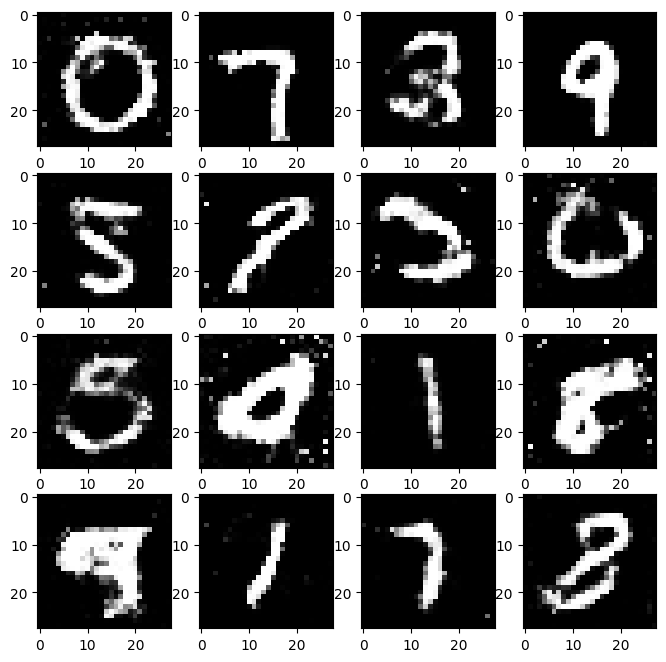

Epoch 117/200 (58.0%):
[0/60032] (0.0%)
D Error: 0.5680 G Error: 1.0084
D Real: 0.4706 D Fake: -0.3684
D_TP: 42.0000, D_FN: 86.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.3281, D_FPR: 0.0859


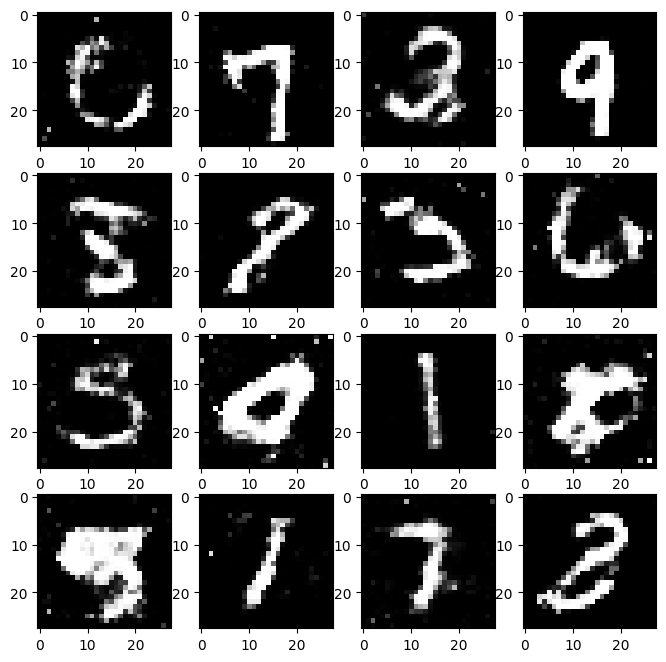

Epoch 118/200 (58.5%):
[0/60032] (0.0%)
D Error: 0.6286 G Error: 1.1346
D Real: 0.0278 D Fake: -0.5103
D_TP: 18.0000, D_FN: 110.0000, D_FP: 8.0000, D_TN: 120.0000, D_TPR: 0.1406, D_FPR: 0.0625


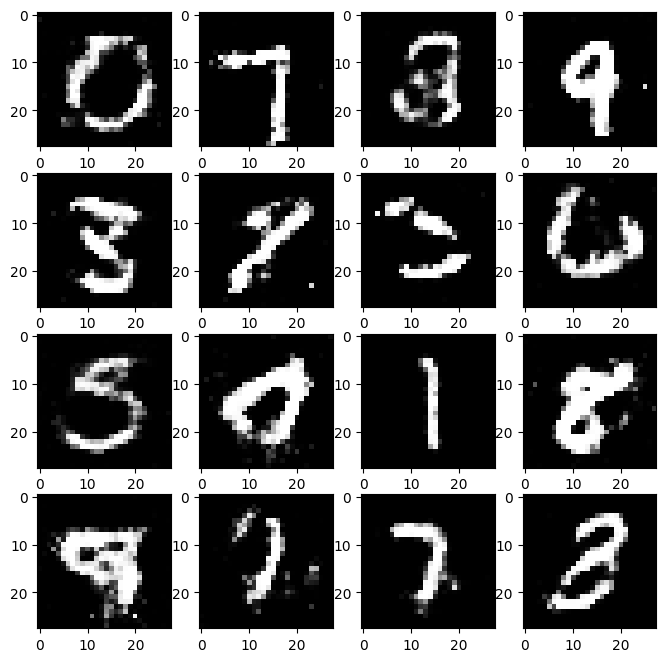

Epoch 119/200 (59.0%):
[0/60032] (0.0%)
D Error: 0.6493 G Error: 0.8986
D Real: 0.2810 D Fake: -0.1943
D_TP: 42.0000, D_FN: 86.0000, D_FP: 15.0000, D_TN: 113.0000, D_TPR: 0.3281, D_FPR: 0.1172


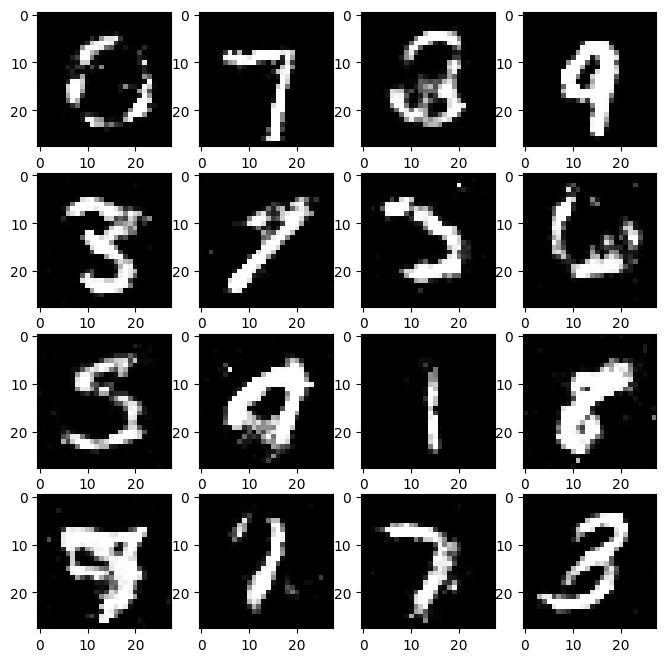

Epoch 120/200 (59.5%):
[0/60032] (0.0%)
D Error: 0.5814 G Error: 0.9532
D Real: 0.4004 D Fake: -0.3451
D_TP: 29.0000, D_FN: 99.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.2266, D_FPR: 0.0859


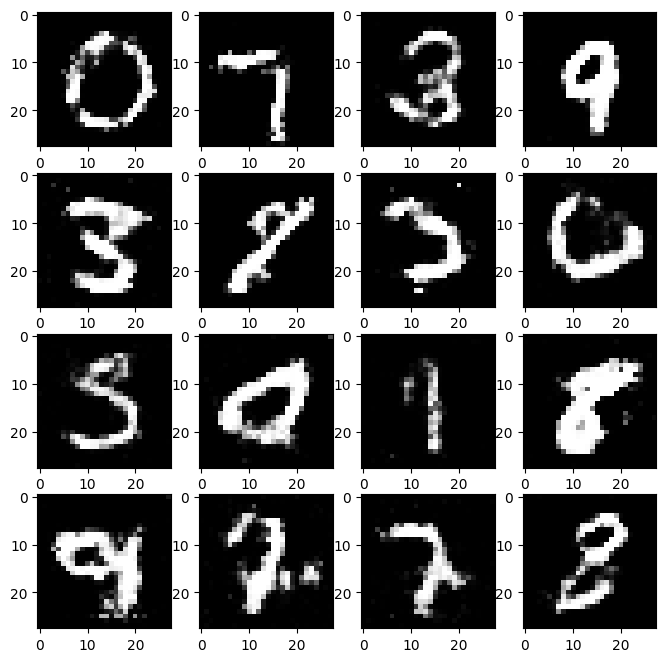

Epoch 121/200 (60.0%):
[0/60032] (0.0%)
D Error: 0.6122 G Error: 0.9114
D Real: 0.4631 D Fake: -0.1808
D_TP: 40.0000, D_FN: 88.0000, D_FP: 19.0000, D_TN: 109.0000, D_TPR: 0.3125, D_FPR: 0.1484


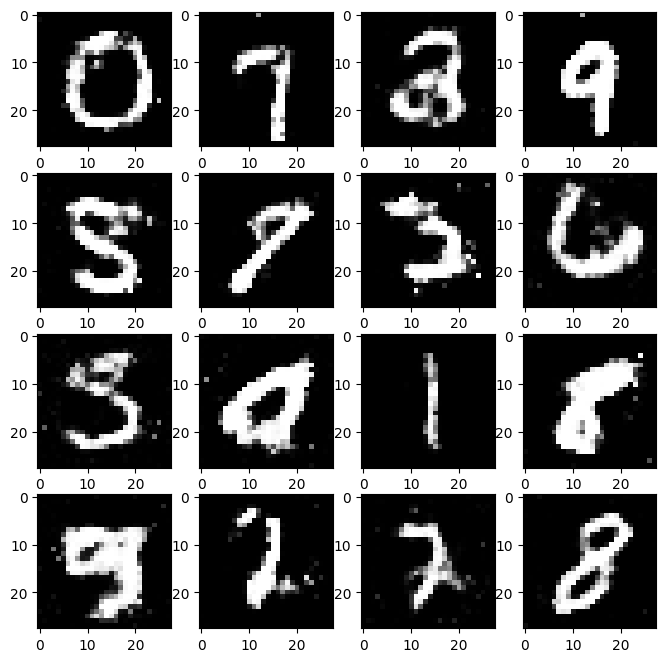

Epoch 122/200 (60.5%):
[0/60032] (0.0%)
D Error: 0.6439 G Error: 1.1343
D Real: 0.4437 D Fake: -0.3237
D_TP: 39.0000, D_FN: 89.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.3047, D_FPR: 0.1250


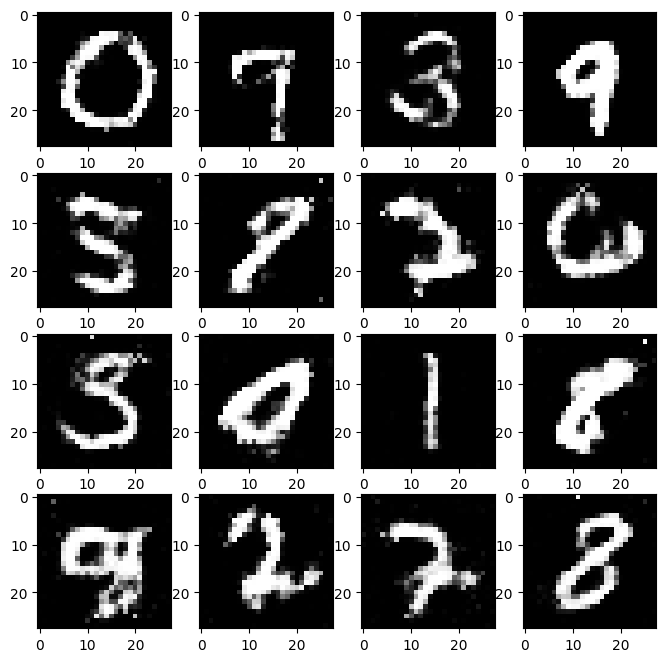

Epoch 123/200 (61.0%):
[0/60032] (0.0%)
D Error: 0.6035 G Error: 1.0818
D Real: 0.2607 D Fake: -0.4108
D_TP: 31.0000, D_FN: 97.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.2422, D_FPR: 0.0859


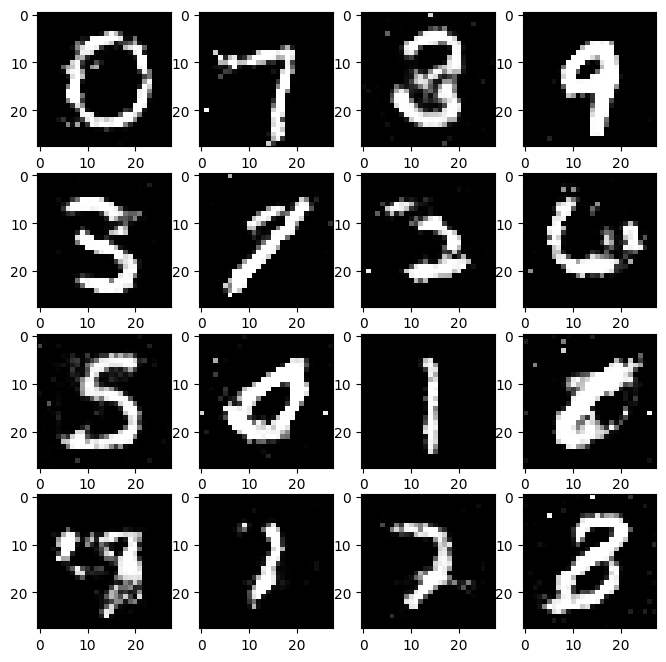

Epoch 124/200 (61.5%):
[0/60032] (0.0%)
D Error: 0.6399 G Error: 0.9005
D Real: 0.3290 D Fake: -0.1966
D_TP: 34.0000, D_FN: 94.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.2656, D_FPR: 0.1094


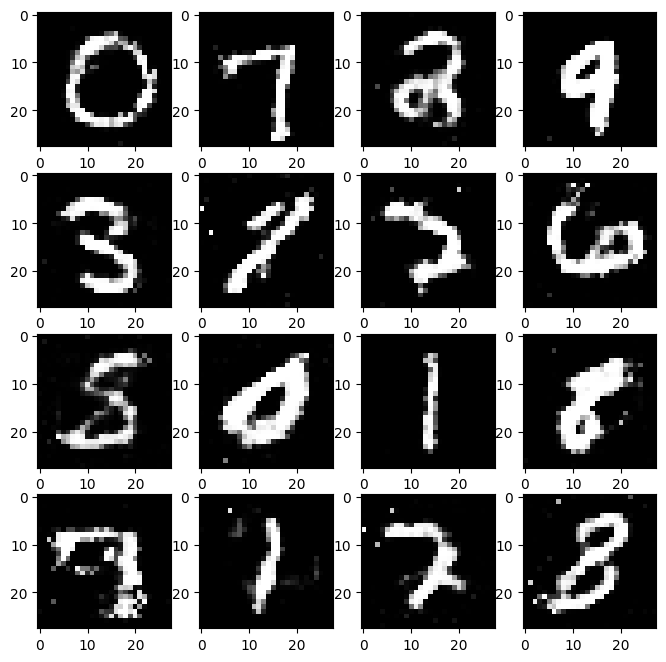

Epoch 125/200 (62.0%):
[0/60032] (0.0%)
D Error: 0.5670 G Error: 1.0420
D Real: 0.4043 D Fake: -0.4679
D_TP: 37.0000, D_FN: 91.0000, D_FP: 9.0000, D_TN: 119.0000, D_TPR: 0.2891, D_FPR: 0.0703


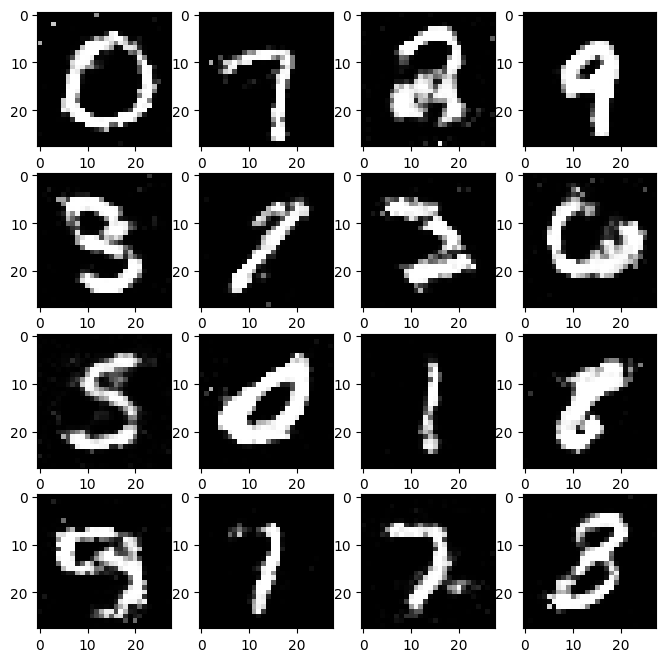

Epoch 126/200 (62.5%):
[0/60032] (0.0%)
D Error: 0.5375 G Error: 1.1527
D Real: 0.4525 D Fake: -0.6374
D_TP: 47.0000, D_FN: 81.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.3672, D_FPR: 0.0938


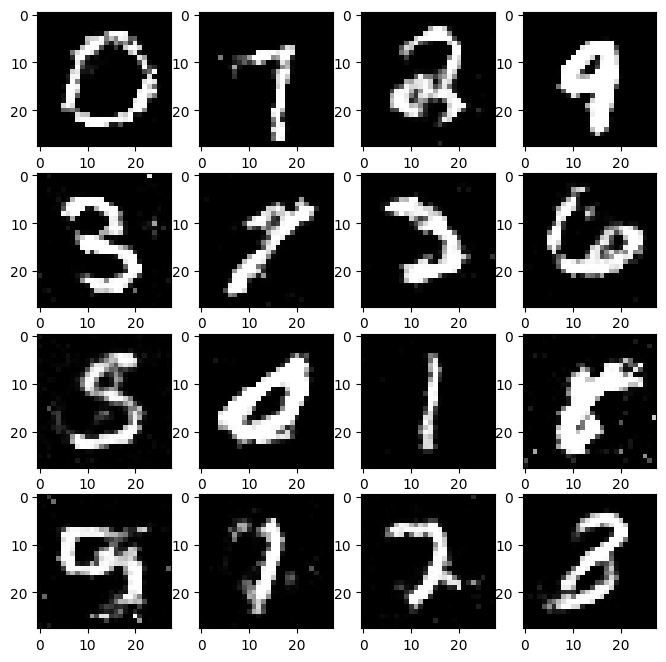

Epoch 127/200 (63.0%):
[0/60032] (0.0%)
D Error: 0.6372 G Error: 0.8534
D Real: 0.3779 D Fake: -0.2418
D_TP: 47.0000, D_FN: 81.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.3672, D_FPR: 0.1250


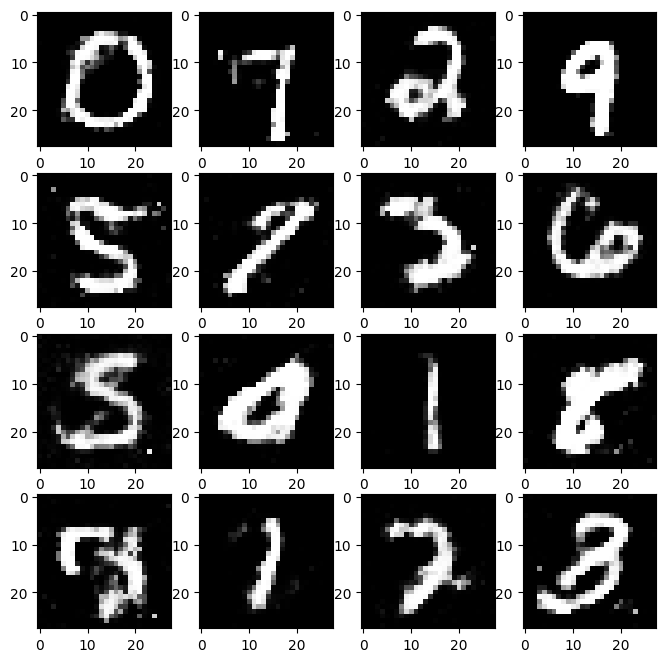

Epoch 128/200 (63.5%):
[0/60032] (0.0%)
D Error: 0.5526 G Error: 0.9407
D Real: 0.6979 D Fake: -0.3612
D_TP: 37.0000, D_FN: 91.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.2891, D_FPR: 0.0859


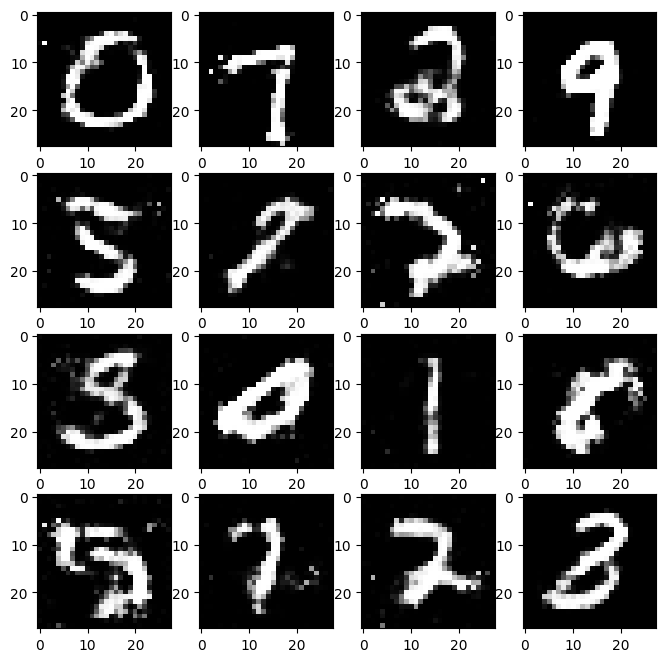

Epoch 129/200 (64.0%):
[0/60032] (0.0%)
D Error: 0.6288 G Error: 0.8908
D Real: 0.5614 D Fake: -0.1951
D_TP: 41.0000, D_FN: 87.0000, D_FP: 23.0000, D_TN: 105.0000, D_TPR: 0.3203, D_FPR: 0.1797


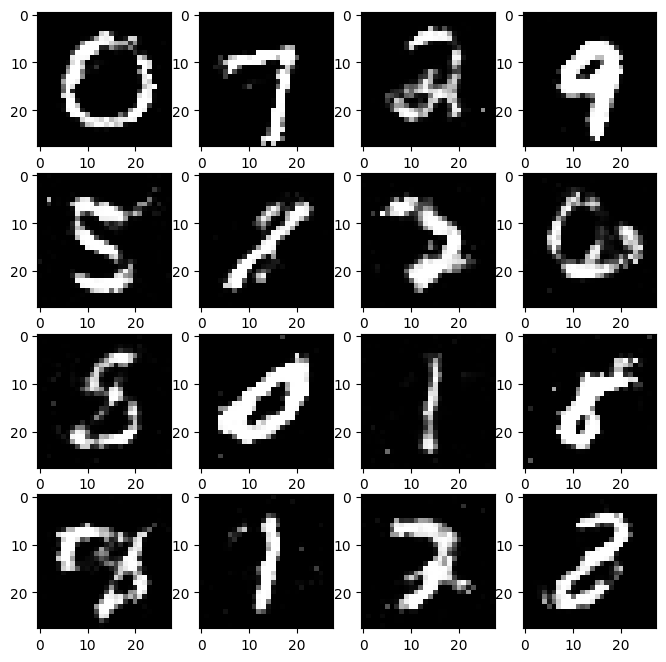

Epoch 130/200 (64.5%):
[0/60032] (0.0%)
D Error: 0.6486 G Error: 0.9641
D Real: 0.3388 D Fake: -0.2605
D_TP: 42.0000, D_FN: 86.0000, D_FP: 17.0000, D_TN: 111.0000, D_TPR: 0.3281, D_FPR: 0.1328


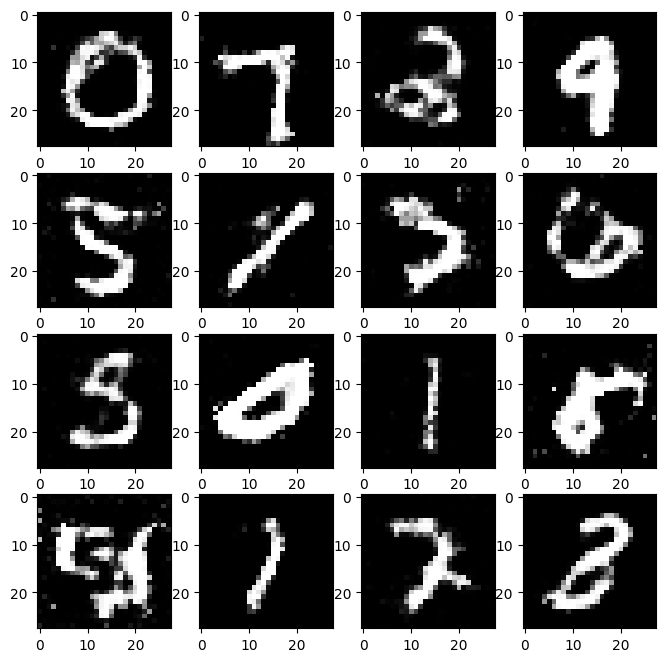

Epoch 131/200 (65.0%):
[0/60032] (0.0%)
D Error: 0.5966 G Error: 0.9946
D Real: 0.3696 D Fake: -0.3713
D_TP: 29.0000, D_FN: 99.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.2266, D_FPR: 0.1016


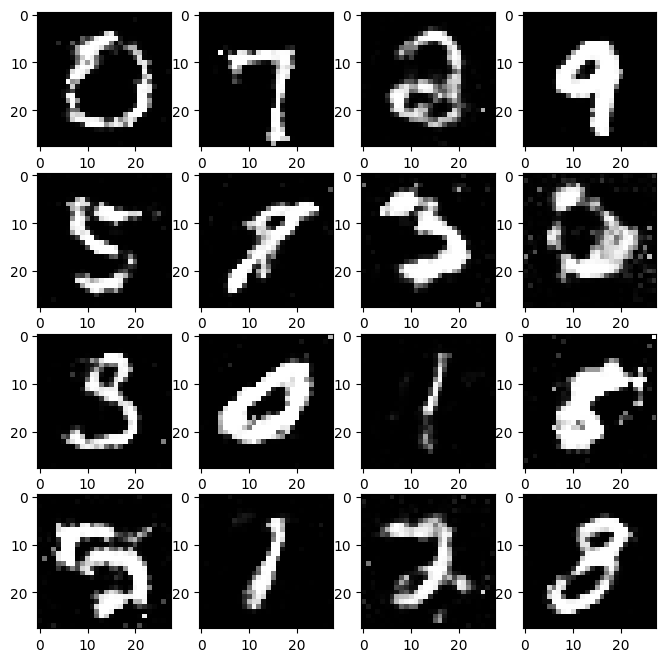

Epoch 132/200 (65.5%):
[0/60032] (0.0%)
D Error: 0.6093 G Error: 0.8429
D Real: 0.4951 D Fake: -0.2042
D_TP: 43.0000, D_FN: 85.0000, D_FP: 18.0000, D_TN: 110.0000, D_TPR: 0.3359, D_FPR: 0.1406


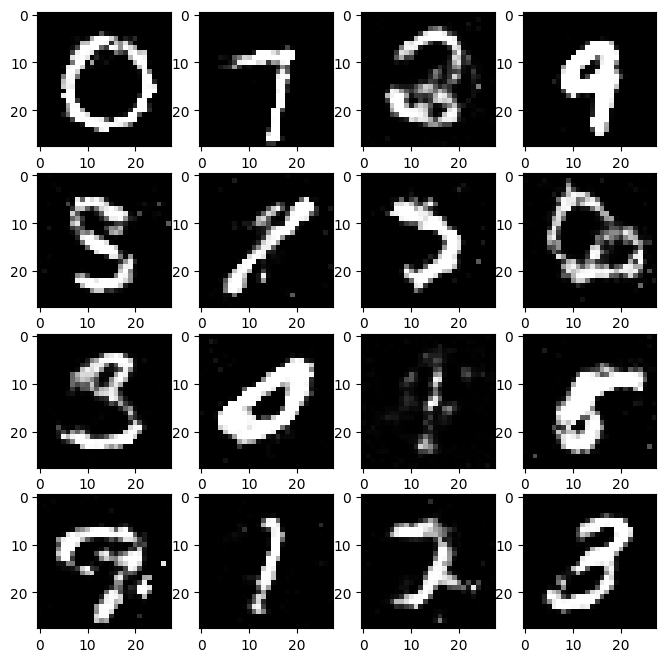

Epoch 133/200 (66.0%):
[0/60032] (0.0%)
D Error: 0.6335 G Error: 0.8622
D Real: 0.4480 D Fake: -0.2420
D_TP: 35.0000, D_FN: 93.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.2734, D_FPR: 0.1250


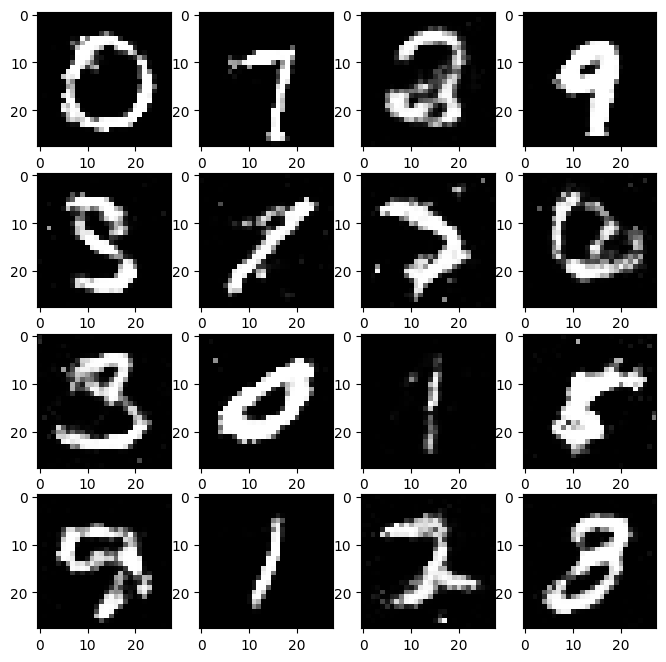

Epoch 134/200 (66.5%):
[0/60032] (0.0%)
D Error: 0.6202 G Error: 1.0562
D Real: 0.3495 D Fake: -0.3422
D_TP: 43.0000, D_FN: 85.0000, D_FP: 17.0000, D_TN: 111.0000, D_TPR: 0.3359, D_FPR: 0.1328


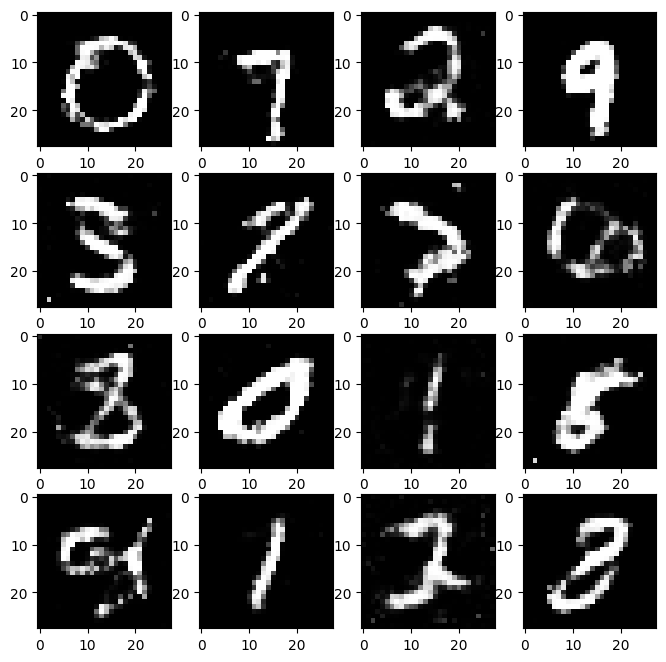

Epoch 135/200 (67.0%):
[0/60032] (0.0%)
D Error: 0.6484 G Error: 0.8959
D Real: 0.1428 D Fake: -0.3215
D_TP: 21.0000, D_FN: 107.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.1641, D_FPR: 0.0859


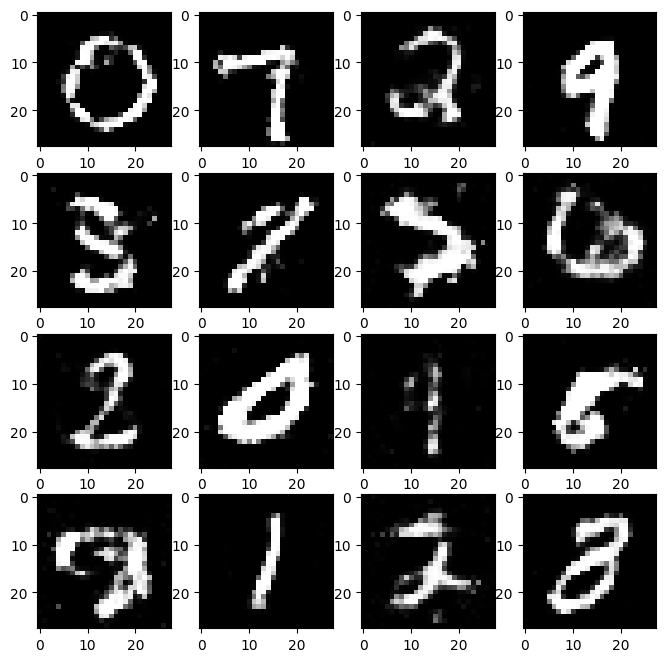

Epoch 136/200 (67.5%):
[0/60032] (0.0%)
D Error: 0.6479 G Error: 0.8122
D Real: 0.1223 D Fake: -0.2223
D_TP: 27.0000, D_FN: 101.0000, D_FP: 8.0000, D_TN: 120.0000, D_TPR: 0.2109, D_FPR: 0.0625


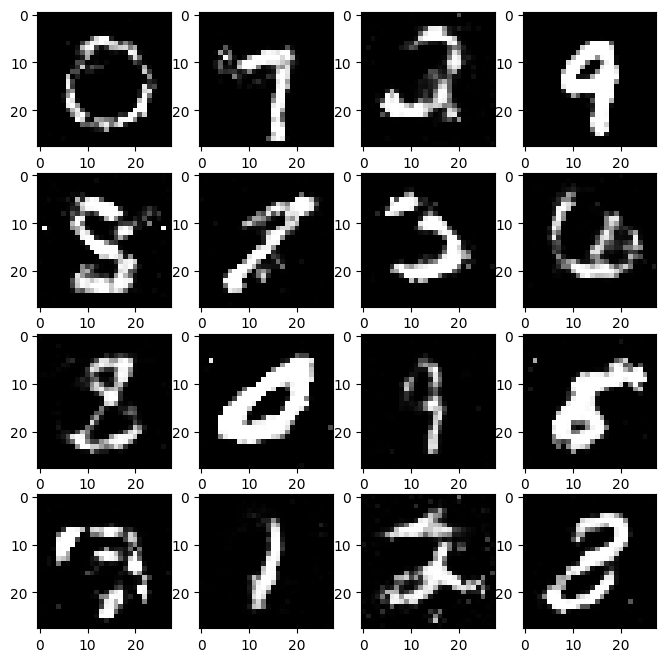

Epoch 137/200 (68.0%):
[0/60032] (0.0%)
D Error: 0.6149 G Error: 0.8842
D Real: 0.2747 D Fake: -0.2568
D_TP: 35.0000, D_FN: 93.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.2734, D_FPR: 0.1094


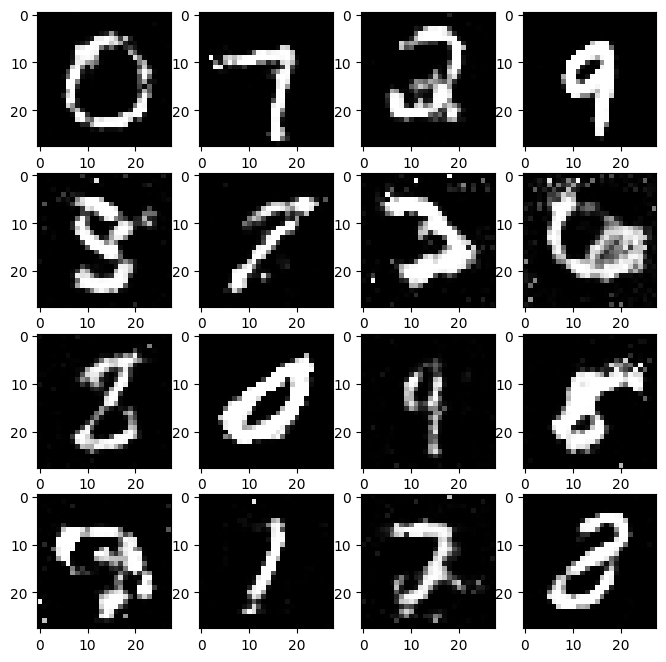

Epoch 138/200 (68.5%):
[0/60032] (0.0%)
D Error: 0.6256 G Error: 0.9311
D Real: 0.2475 D Fake: -0.2969
D_TP: 39.0000, D_FN: 89.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.3047, D_FPR: 0.1016


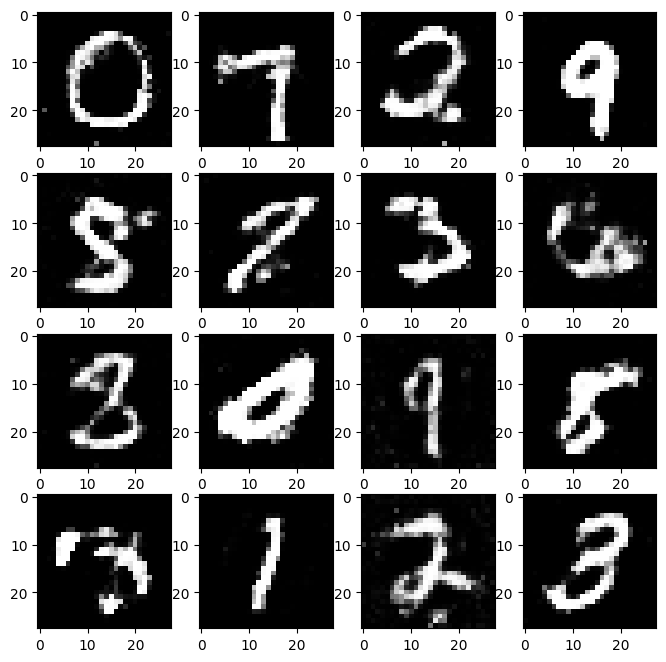

Epoch 139/200 (69.0%):
[0/60032] (0.0%)
D Error: 0.6173 G Error: 0.9934
D Real: 0.1900 D Fake: -0.5186
D_TP: 25.0000, D_FN: 103.0000, D_FP: 6.0000, D_TN: 122.0000, D_TPR: 0.1953, D_FPR: 0.0469


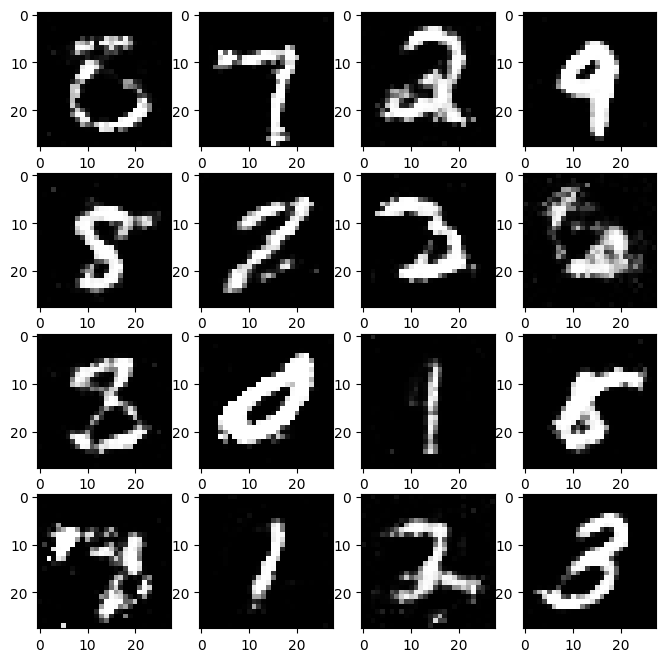

Epoch 140/200 (69.5%):
[0/60032] (0.0%)
D Error: 0.6358 G Error: 0.8500
D Real: 0.4948 D Fake: -0.1007
D_TP: 40.0000, D_FN: 88.0000, D_FP: 22.0000, D_TN: 106.0000, D_TPR: 0.3125, D_FPR: 0.1719


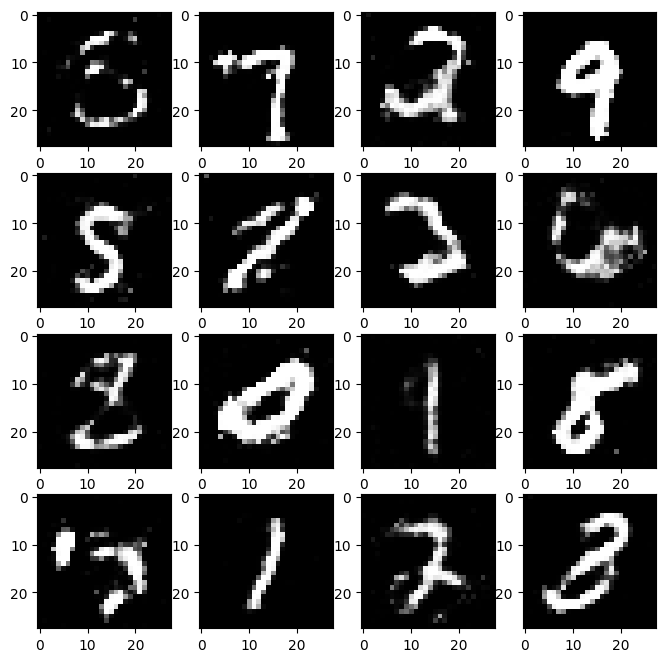

Epoch 141/200 (70.0%):
[0/60032] (0.0%)
D Error: 0.6639 G Error: 0.9037
D Real: 0.1012 D Fake: -0.2759
D_TP: 36.0000, D_FN: 92.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.2812, D_FPR: 0.0938


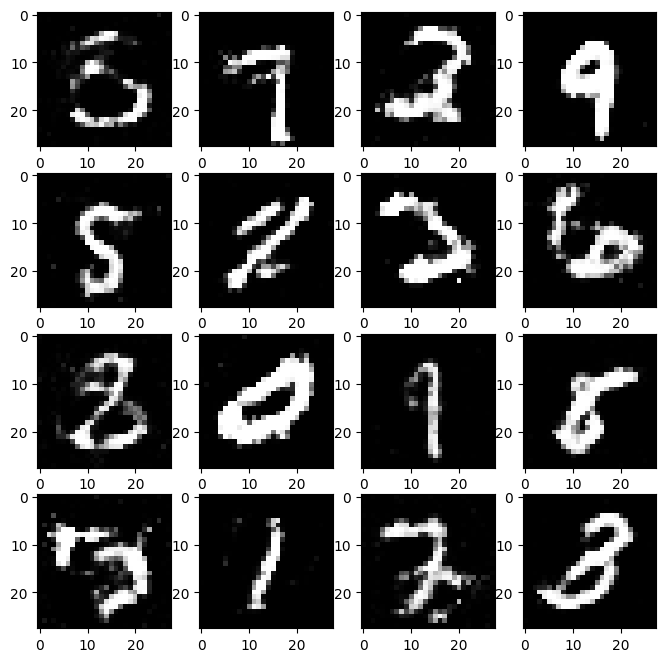

Epoch 142/200 (70.5%):
[0/60032] (0.0%)
D Error: 0.6274 G Error: 0.9095
D Real: 0.2959 D Fake: -0.2175
D_TP: 40.0000, D_FN: 88.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.3125, D_FPR: 0.1094


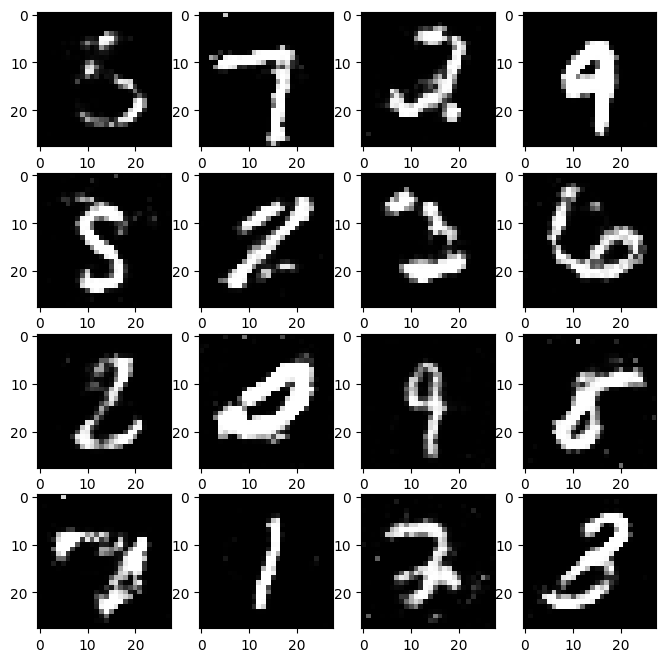

Epoch 143/200 (71.0%):
[0/60032] (0.0%)
D Error: 0.6172 G Error: 0.9996
D Real: 0.1539 D Fake: -0.4383
D_TP: 43.0000, D_FN: 85.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.3359, D_FPR: 0.0859


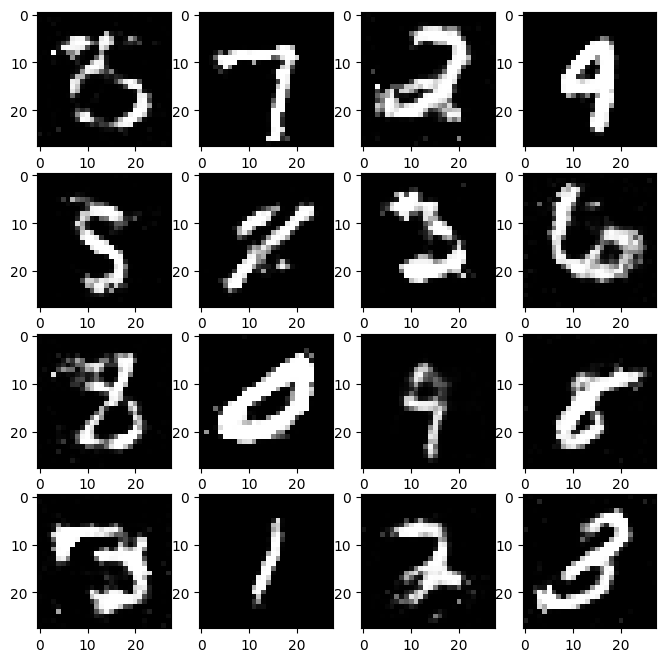

Epoch 144/200 (71.5%):
[0/60032] (0.0%)
D Error: 0.6181 G Error: 0.9059
D Real: 0.4440 D Fake: -0.2173
D_TP: 45.0000, D_FN: 83.0000, D_FP: 20.0000, D_TN: 108.0000, D_TPR: 0.3516, D_FPR: 0.1562


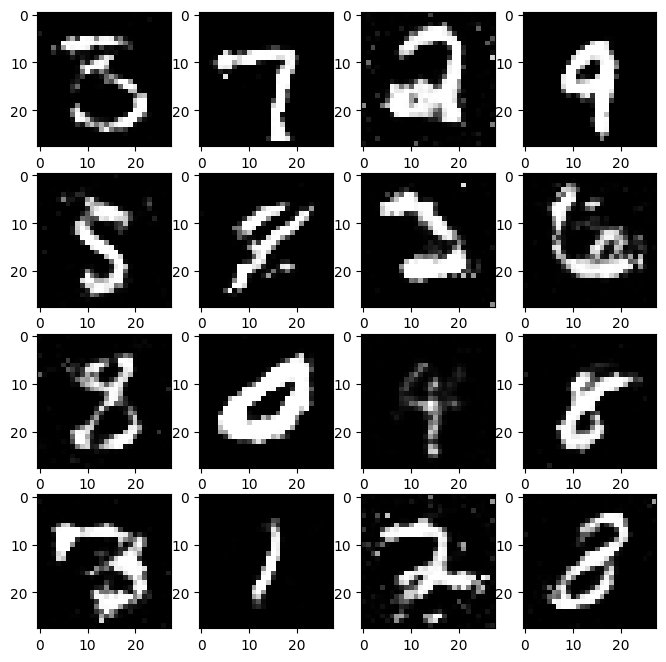

Epoch 145/200 (72.0%):
[0/60032] (0.0%)
D Error: 0.5717 G Error: 1.0199
D Real: 0.4436 D Fake: -0.5334
D_TP: 31.0000, D_FN: 97.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.2422, D_FPR: 0.0859


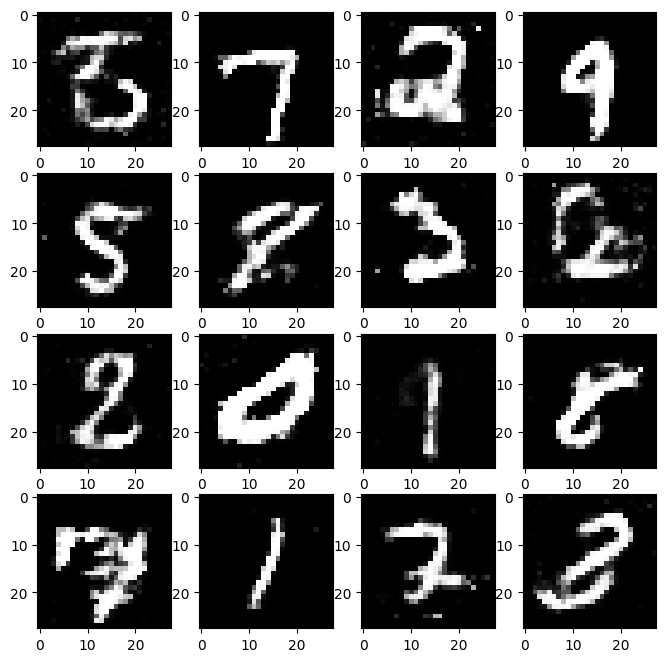

Epoch 146/200 (72.5%):
[0/60032] (0.0%)
D Error: 0.6498 G Error: 0.8098
D Real: 0.3347 D Fake: -0.2480
D_TP: 35.0000, D_FN: 93.0000, D_FP: 18.0000, D_TN: 110.0000, D_TPR: 0.2734, D_FPR: 0.1406


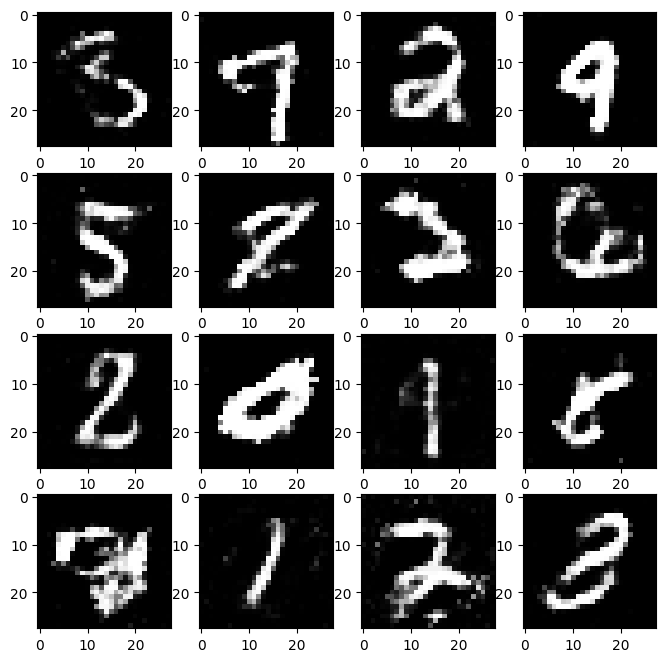

Epoch 147/200 (73.0%):
[0/60032] (0.0%)
D Error: 0.6335 G Error: 0.9716
D Real: 0.3565 D Fake: -0.2543
D_TP: 46.0000, D_FN: 82.0000, D_FP: 26.0000, D_TN: 102.0000, D_TPR: 0.3594, D_FPR: 0.2031


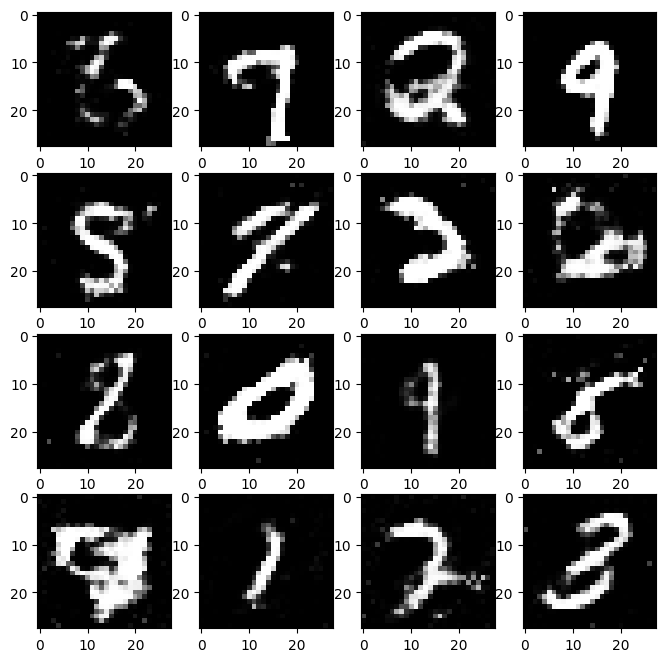

Epoch 148/200 (73.5%):
[0/60032] (0.0%)
D Error: 0.5801 G Error: 0.8932
D Real: 0.5289 D Fake: -0.3912
D_TP: 41.0000, D_FN: 87.0000, D_FP: 22.0000, D_TN: 106.0000, D_TPR: 0.3203, D_FPR: 0.1719


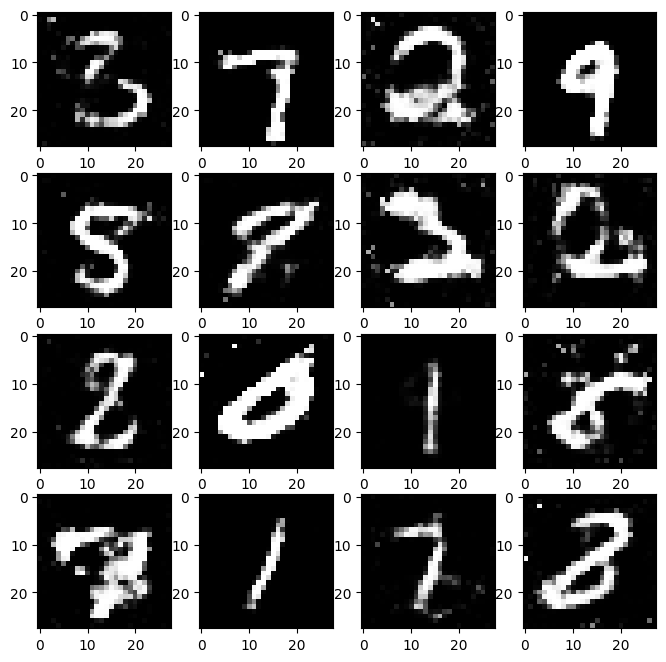

Epoch 149/200 (74.0%):
[0/60032] (0.0%)
D Error: 0.6092 G Error: 0.9934
D Real: 0.2414 D Fake: -0.4589
D_TP: 34.0000, D_FN: 94.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.2656, D_FPR: 0.0781


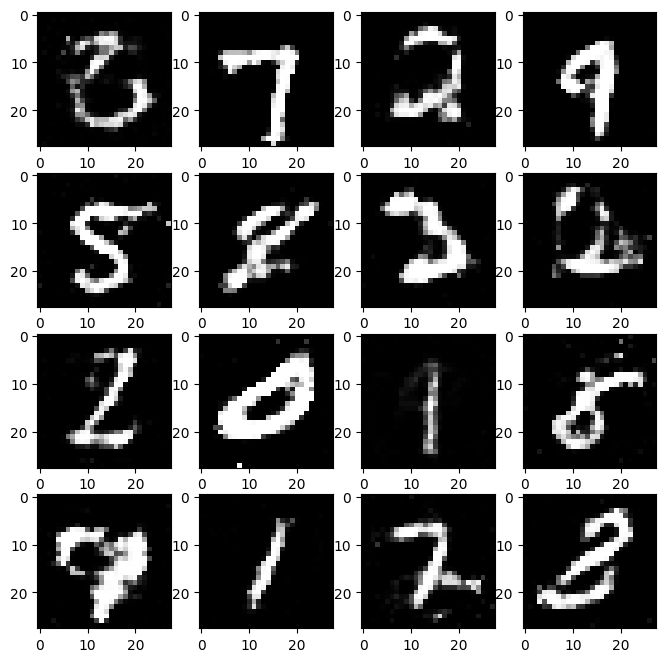

Epoch 150/200 (74.5%):
[0/60032] (0.0%)
D Error: 0.6239 G Error: 0.9733
D Real: 0.3658 D Fake: -0.3453
D_TP: 40.0000, D_FN: 88.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.3125, D_FPR: 0.1250


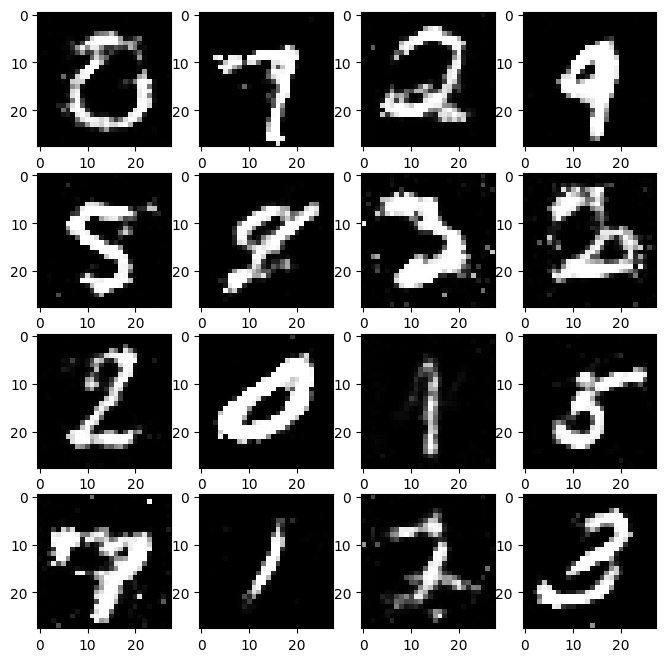

Epoch 151/200 (75.0%):
[0/60032] (0.0%)
D Error: 0.6625 G Error: 0.8375
D Real: 0.3478 D Fake: -0.1281
D_TP: 35.0000, D_FN: 93.0000, D_FP: 23.0000, D_TN: 105.0000, D_TPR: 0.2734, D_FPR: 0.1797


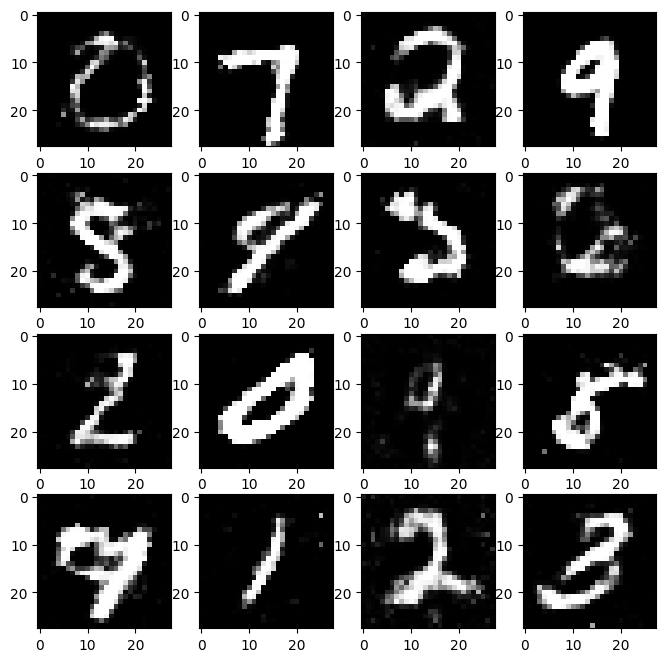

Epoch 152/200 (75.5%):
[0/60032] (0.0%)
D Error: 0.6323 G Error: 0.7627
D Real: 0.5909 D Fake: -0.0547
D_TP: 37.0000, D_FN: 91.0000, D_FP: 19.0000, D_TN: 109.0000, D_TPR: 0.2891, D_FPR: 0.1484


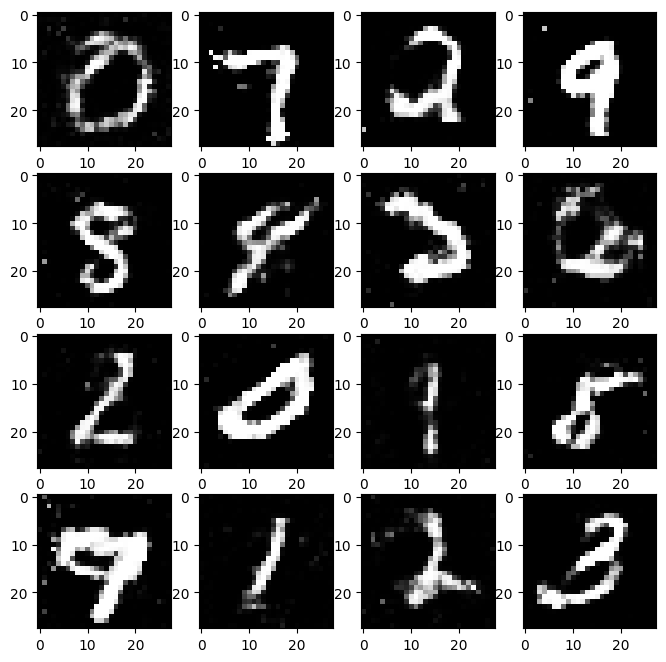

Epoch 153/200 (76.0%):
[0/60032] (0.0%)
D Error: 0.5937 G Error: 0.9352
D Real: 0.6032 D Fake: -0.2235
D_TP: 44.0000, D_FN: 84.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.3438, D_FPR: 0.0859


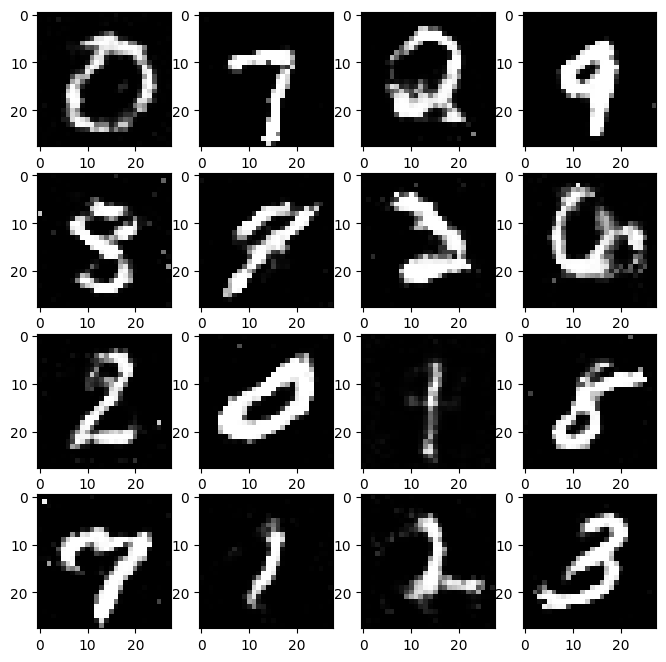

Epoch 154/200 (76.5%):
[0/60032] (0.0%)
D Error: 0.6203 G Error: 0.9982
D Real: 0.2528 D Fake: -0.2535
D_TP: 35.0000, D_FN: 93.0000, D_FP: 8.0000, D_TN: 120.0000, D_TPR: 0.2734, D_FPR: 0.0625


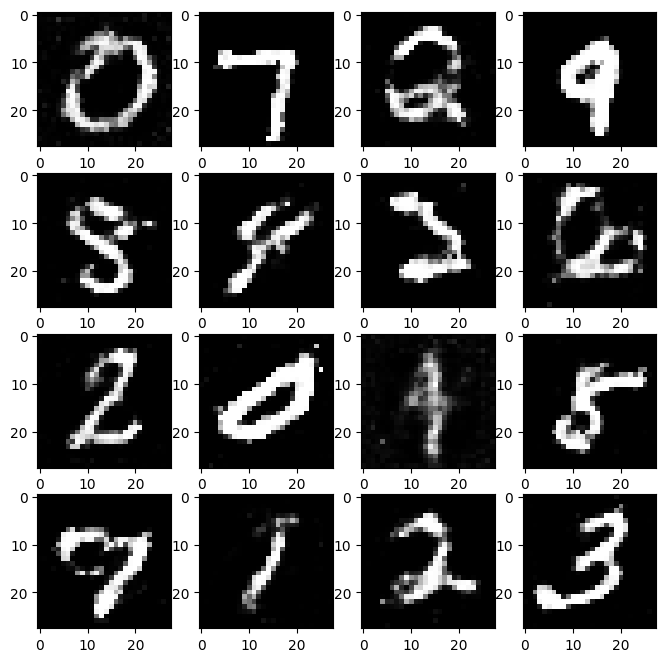

Epoch 155/200 (77.0%):
[0/60032] (0.0%)
D Error: 0.6416 G Error: 0.8907
D Real: 0.2591 D Fake: -0.2042
D_TP: 28.0000, D_FN: 100.0000, D_FP: 15.0000, D_TN: 113.0000, D_TPR: 0.2188, D_FPR: 0.1172


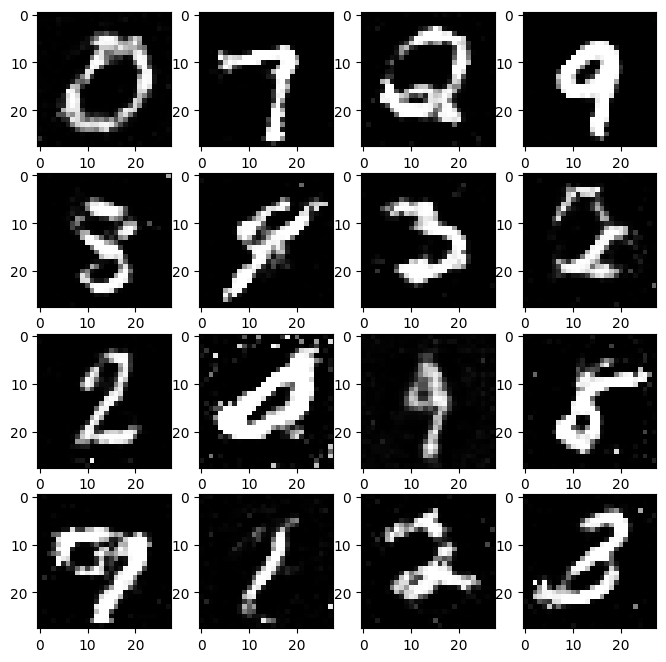

Epoch 156/200 (77.5%):
[0/60032] (0.0%)
D Error: 0.6279 G Error: 0.8279
D Real: 0.2716 D Fake: -0.2219
D_TP: 32.0000, D_FN: 96.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.2500, D_FPR: 0.1094


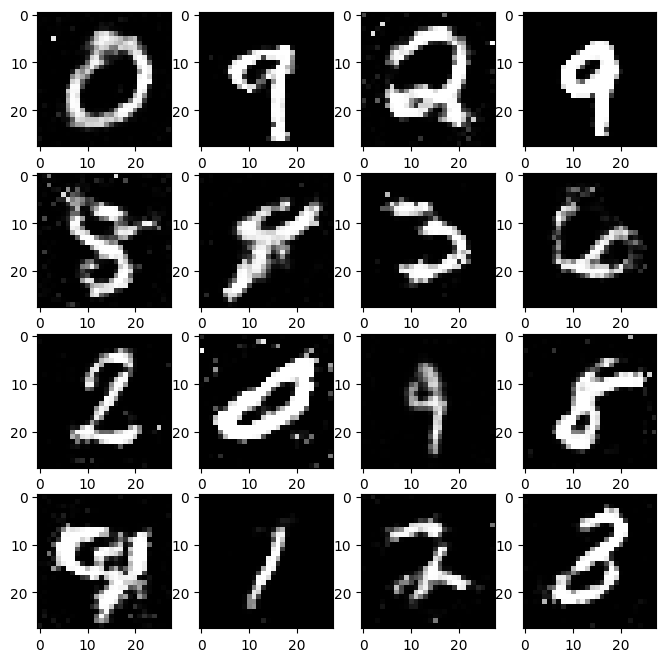

Epoch 157/200 (78.0%):
[0/60032] (0.0%)
D Error: 0.6037 G Error: 0.9896
D Real: 0.4220 D Fake: -0.4490
D_TP: 29.0000, D_FN: 99.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.2266, D_FPR: 0.1250


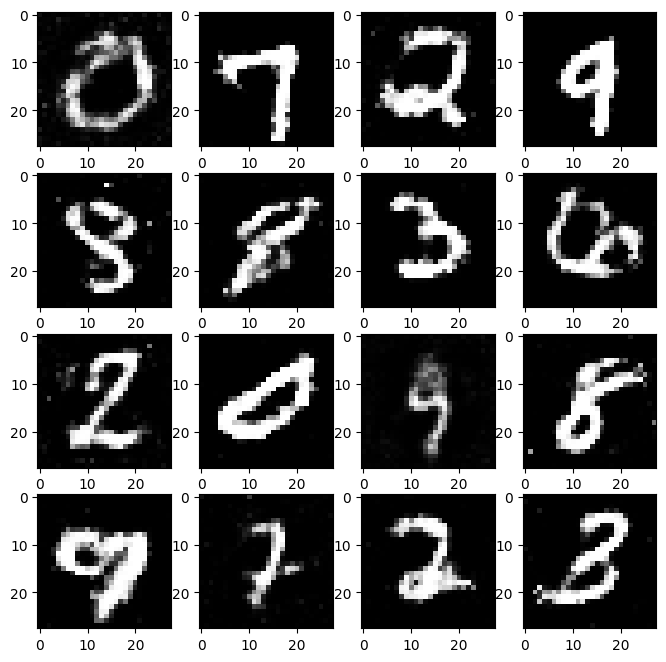

Epoch 158/200 (78.5%):
[0/60032] (0.0%)
D Error: 0.6058 G Error: 0.9239
D Real: 0.2107 D Fake: -0.3745
D_TP: 28.0000, D_FN: 100.0000, D_FP: 9.0000, D_TN: 119.0000, D_TPR: 0.2188, D_FPR: 0.0703


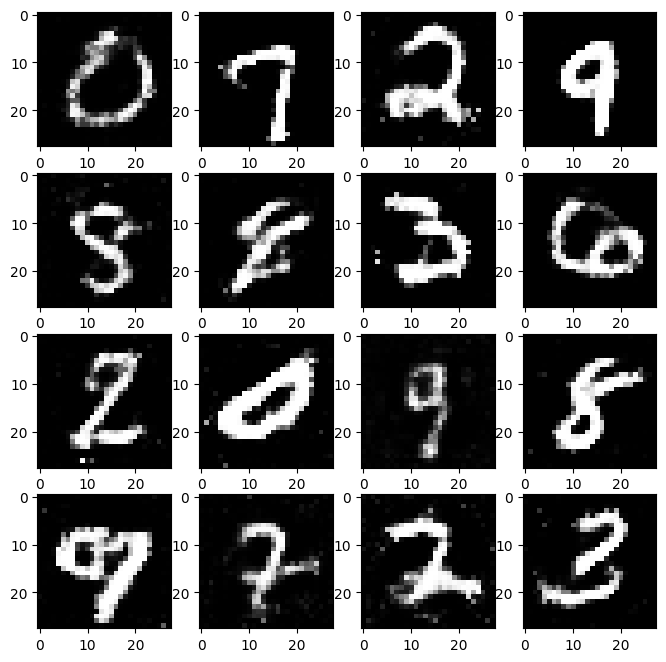

Epoch 159/200 (79.0%):
[0/60032] (0.0%)
D Error: 0.6384 G Error: 0.9052
D Real: 0.2323 D Fake: -0.2027
D_TP: 36.0000, D_FN: 92.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.2812, D_FPR: 0.1250


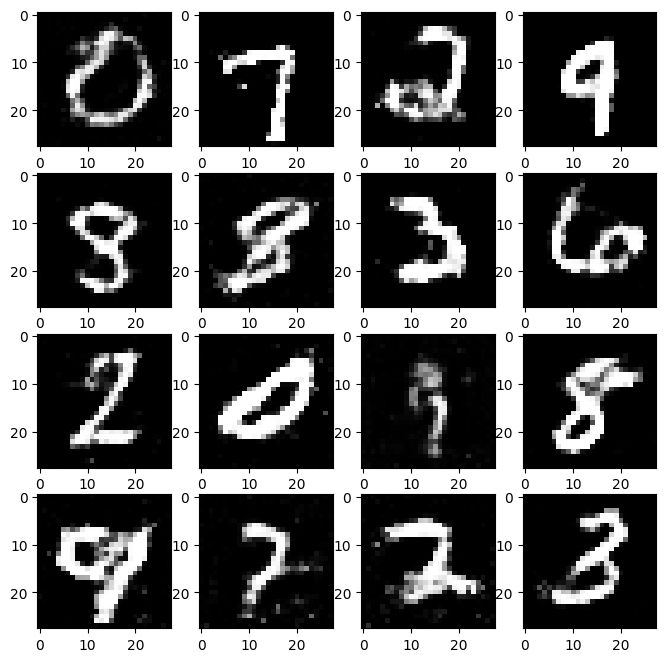

Epoch 160/200 (79.5%):
[0/60032] (0.0%)
D Error: 0.6787 G Error: 0.8044
D Real: 0.3092 D Fake: -0.1026
D_TP: 34.0000, D_FN: 94.0000, D_FP: 22.0000, D_TN: 106.0000, D_TPR: 0.2656, D_FPR: 0.1719


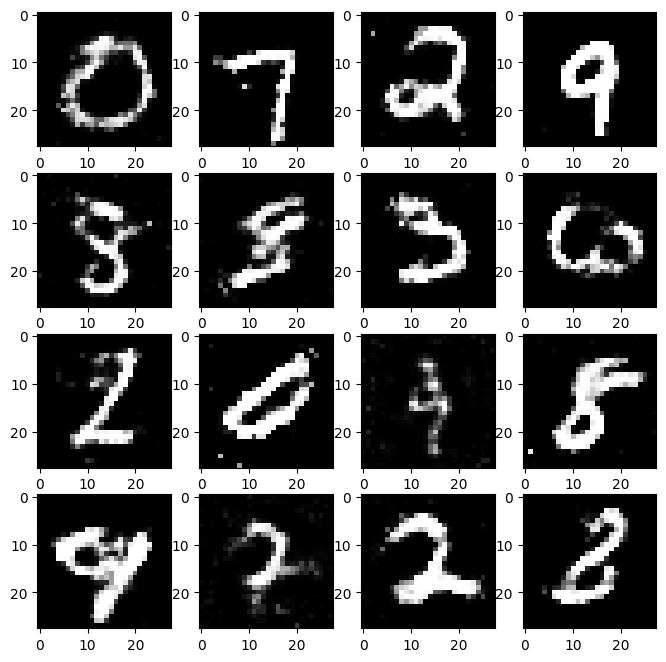

Epoch 161/200 (80.0%):
[0/60032] (0.0%)
D Error: 0.6221 G Error: 0.9562
D Real: 0.2917 D Fake: -0.3746
D_TP: 26.0000, D_FN: 102.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.2031, D_FPR: 0.1250


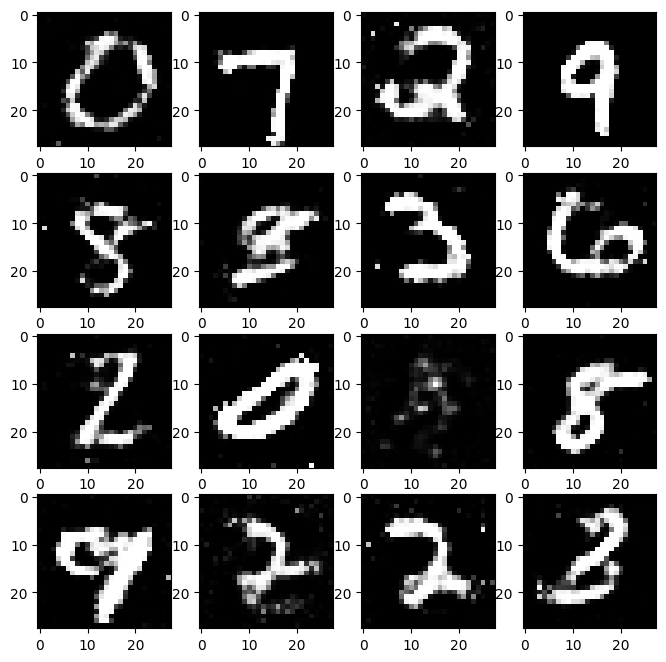

Epoch 162/200 (80.5%):
[0/60032] (0.0%)
D Error: 0.6029 G Error: 1.0633
D Real: 0.3095 D Fake: -0.5307
D_TP: 37.0000, D_FN: 91.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.2891, D_FPR: 0.1016


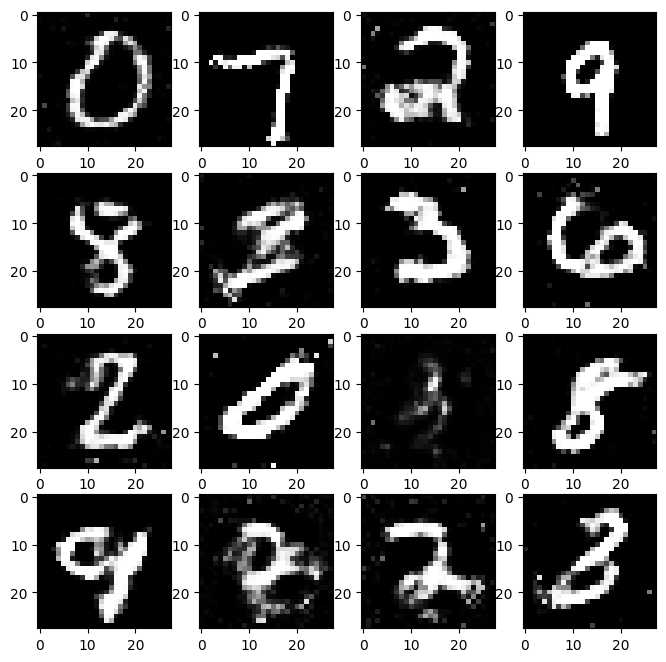

Epoch 163/200 (81.0%):
[0/60032] (0.0%)
D Error: 0.6778 G Error: 0.7722
D Real: 0.3875 D Fake: 0.0556
D_TP: 40.0000, D_FN: 88.0000, D_FP: 24.0000, D_TN: 104.0000, D_TPR: 0.3125, D_FPR: 0.1875


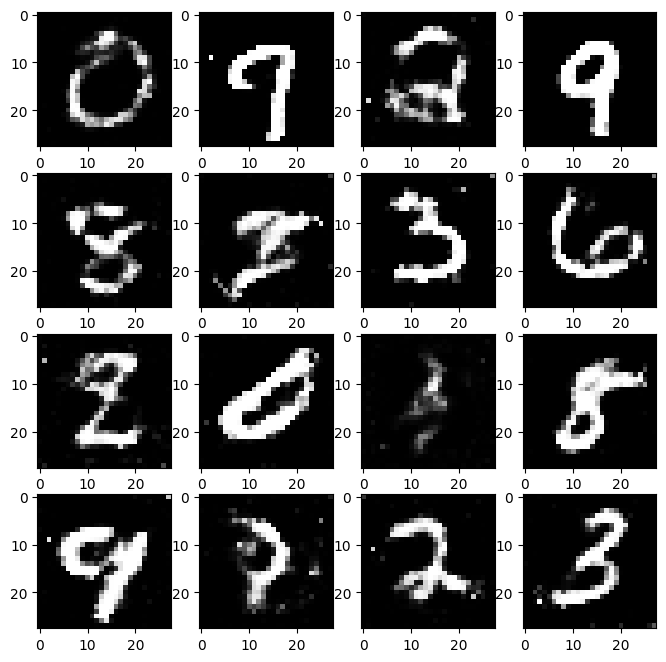

Epoch 164/200 (81.5%):
[0/60032] (0.0%)
D Error: 0.5463 G Error: 1.0004
D Real: 0.6463 D Fake: -0.4329
D_TP: 40.0000, D_FN: 88.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.3125, D_FPR: 0.1016


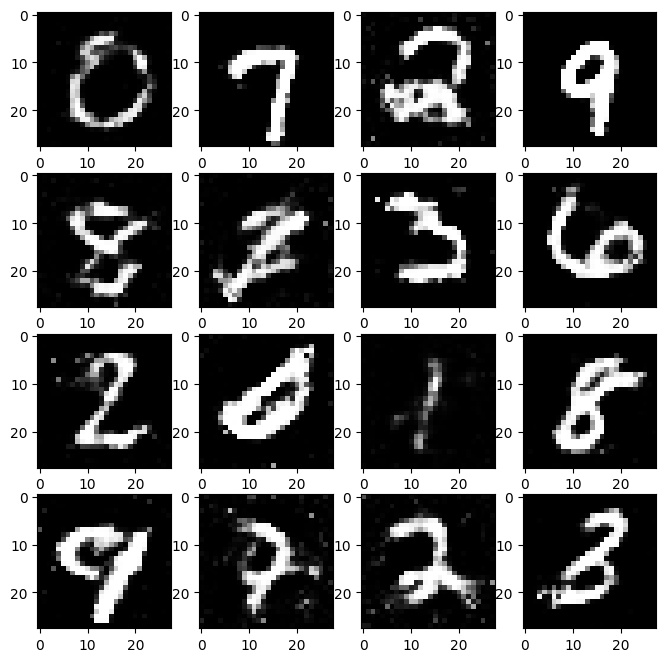

Epoch 165/200 (82.0%):
[0/60032] (0.0%)
D Error: 0.6124 G Error: 1.1624
D Real: 0.4314 D Fake: -0.4227
D_TP: 39.0000, D_FN: 89.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.3047, D_FPR: 0.0781


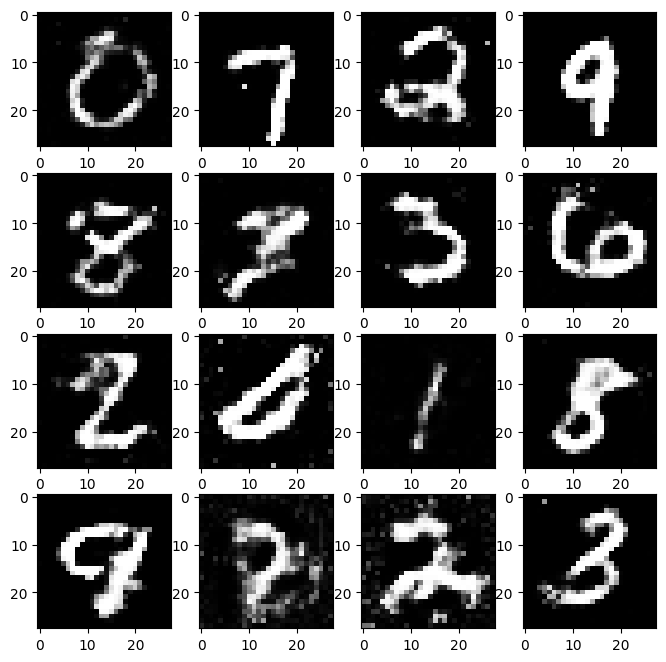

Epoch 166/200 (82.5%):
[0/60032] (0.0%)
D Error: 0.6305 G Error: 0.9729
D Real: 0.3148 D Fake: -0.2919
D_TP: 34.0000, D_FN: 94.0000, D_FP: 18.0000, D_TN: 110.0000, D_TPR: 0.2656, D_FPR: 0.1406


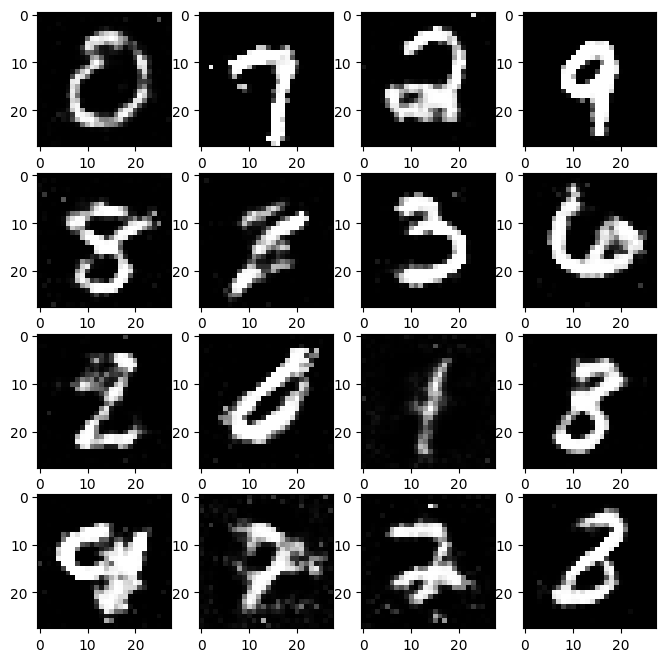

Epoch 167/200 (83.0%):
[0/60032] (0.0%)
D Error: 0.6544 G Error: 0.8447
D Real: 0.1804 D Fake: -0.2319
D_TP: 44.0000, D_FN: 84.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.3438, D_FPR: 0.1250


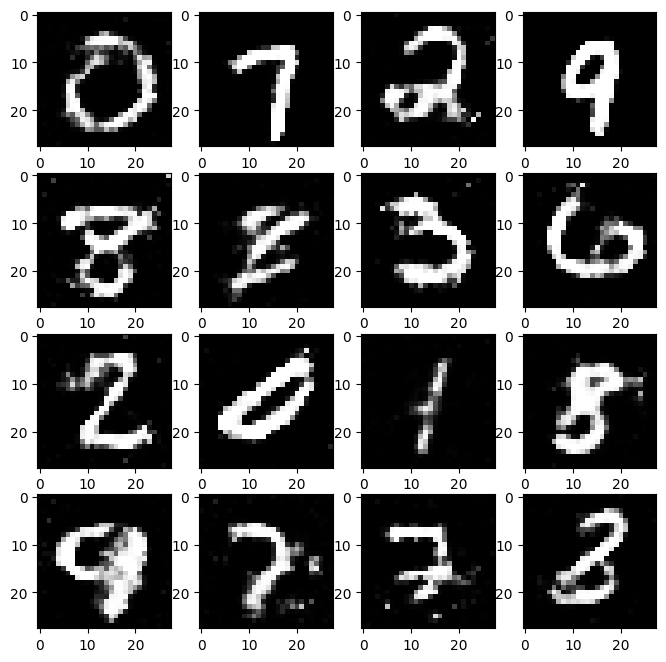

Epoch 168/200 (83.5%):
[0/60032] (0.0%)
D Error: 0.6128 G Error: 1.0247
D Real: 0.1665 D Fake: -0.5309
D_TP: 37.0000, D_FN: 91.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.2891, D_FPR: 0.1016


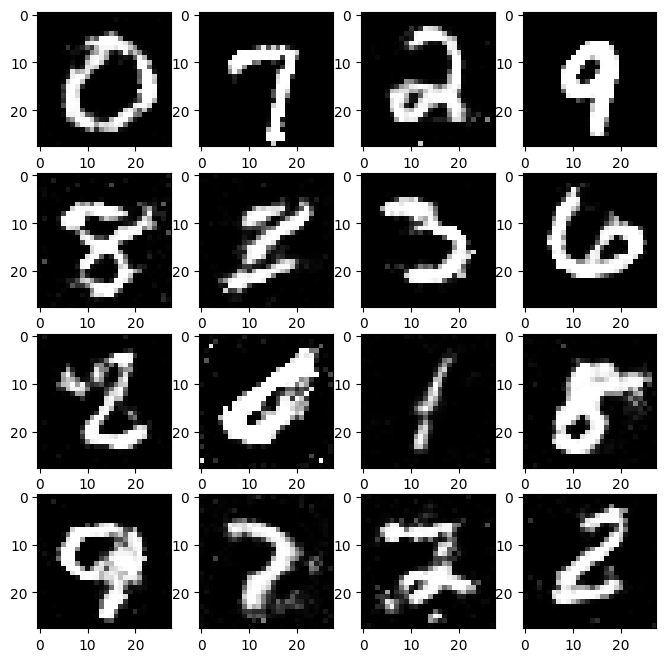

Epoch 169/200 (84.0%):
[0/60032] (0.0%)
D Error: 0.6494 G Error: 1.0349
D Real: 0.3816 D Fake: -0.3186
D_TP: 42.0000, D_FN: 86.0000, D_FP: 20.0000, D_TN: 108.0000, D_TPR: 0.3281, D_FPR: 0.1562


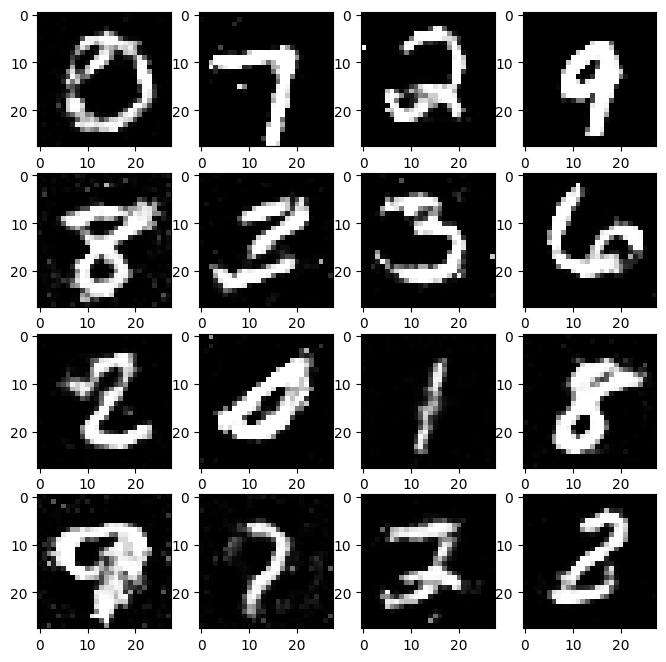

Epoch 170/200 (84.5%):
[0/60032] (0.0%)
D Error: 0.6491 G Error: 0.9503
D Real: 0.4849 D Fake: -0.2185
D_TP: 32.0000, D_FN: 96.0000, D_FP: 15.0000, D_TN: 113.0000, D_TPR: 0.2500, D_FPR: 0.1172


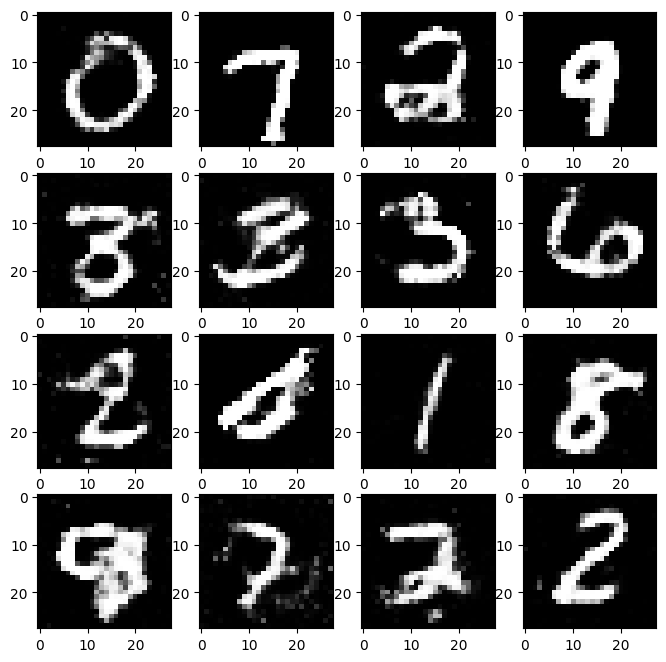

Epoch 171/200 (85.0%):
[0/60032] (0.0%)
D Error: 0.6583 G Error: 1.0447
D Real: 0.4087 D Fake: -0.2557
D_TP: 43.0000, D_FN: 85.0000, D_FP: 20.0000, D_TN: 108.0000, D_TPR: 0.3359, D_FPR: 0.1562


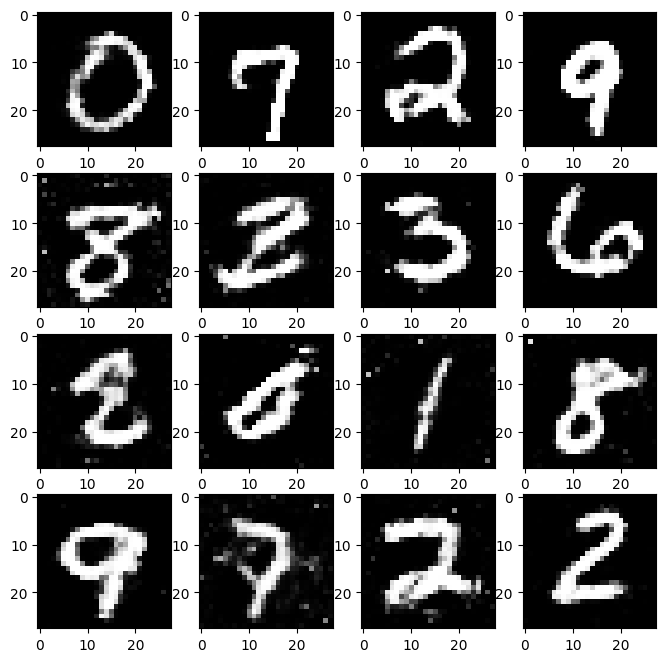

Epoch 172/200 (85.5%):
[0/60032] (0.0%)
D Error: 0.6615 G Error: 0.8170
D Real: 0.1620 D Fake: -0.1686
D_TP: 29.0000, D_FN: 99.0000, D_FP: 7.0000, D_TN: 121.0000, D_TPR: 0.2266, D_FPR: 0.0547


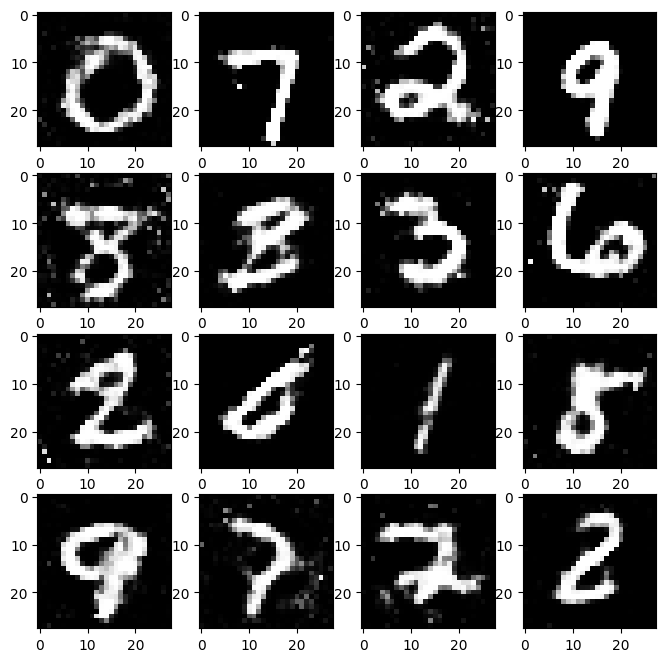

Epoch 173/200 (86.0%):
[0/60032] (0.0%)
D Error: 0.5815 G Error: 1.0485
D Real: 0.3388 D Fake: -0.4771
D_TP: 38.0000, D_FN: 90.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.2969, D_FPR: 0.0938


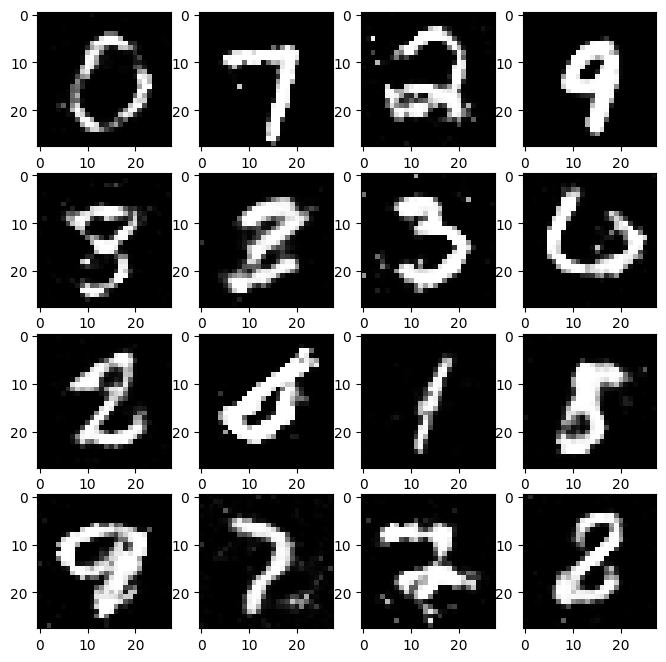

Epoch 174/200 (86.5%):
[0/60032] (0.0%)
D Error: 0.5710 G Error: 0.9384
D Real: 0.5286 D Fake: -0.3660
D_TP: 45.0000, D_FN: 83.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.3516, D_FPR: 0.0859


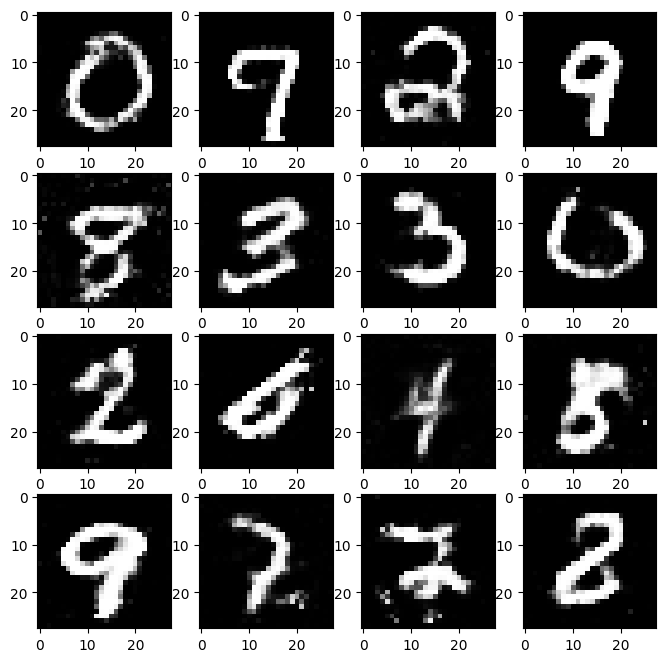

Epoch 175/200 (87.0%):
[0/60032] (0.0%)
D Error: 0.6062 G Error: 0.9326
D Real: 0.2799 D Fake: -0.4807
D_TP: 39.0000, D_FN: 89.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.3047, D_FPR: 0.0938


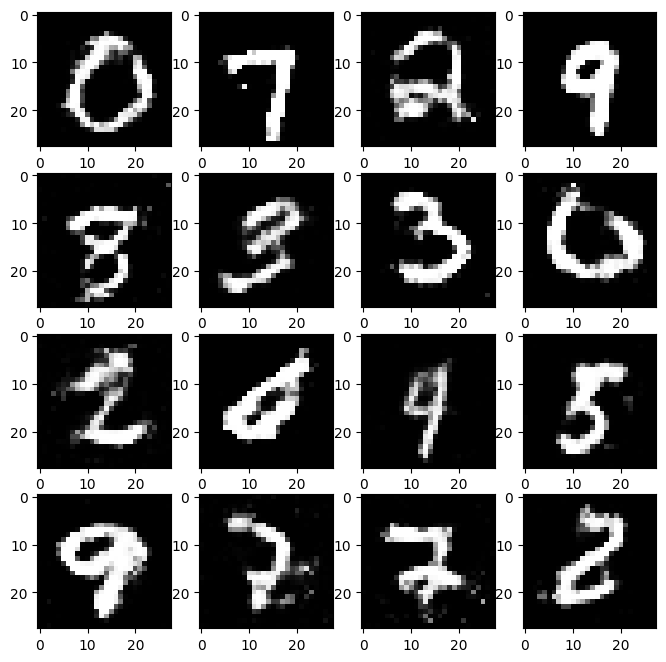

Epoch 176/200 (87.5%):
[0/60032] (0.0%)
D Error: 0.6488 G Error: 0.7749
D Real: 0.3482 D Fake: -0.0496
D_TP: 34.0000, D_FN: 94.0000, D_FP: 23.0000, D_TN: 105.0000, D_TPR: 0.2656, D_FPR: 0.1797


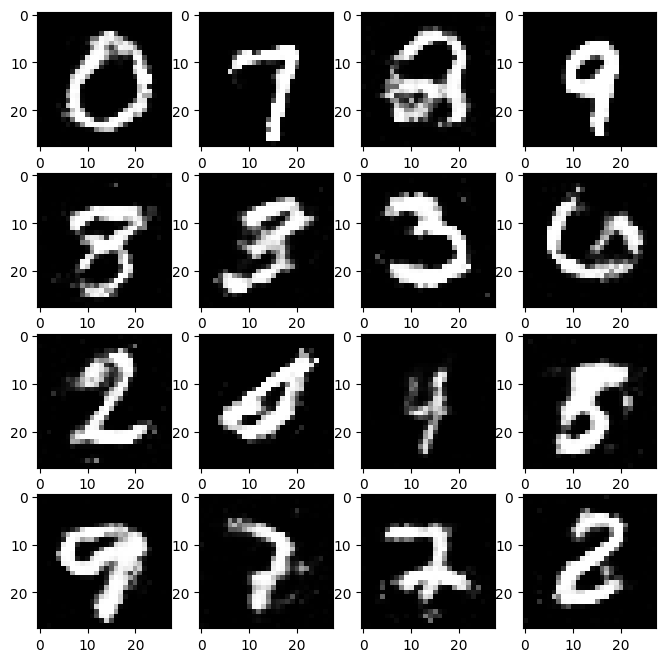

Epoch 177/200 (88.0%):
[0/60032] (0.0%)
D Error: 0.6308 G Error: 0.8548
D Real: 0.3565 D Fake: -0.2527
D_TP: 30.0000, D_FN: 98.0000, D_FP: 10.0000, D_TN: 118.0000, D_TPR: 0.2344, D_FPR: 0.0781


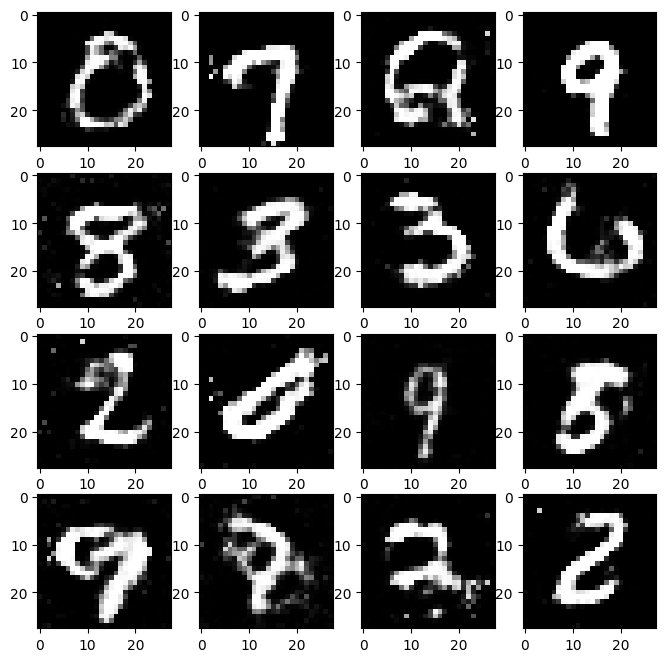

Epoch 178/200 (88.5%):
[0/60032] (0.0%)
D Error: 0.6818 G Error: 0.7934
D Real: 0.1572 D Fake: -0.1645
D_TP: 29.0000, D_FN: 99.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.2266, D_FPR: 0.1094


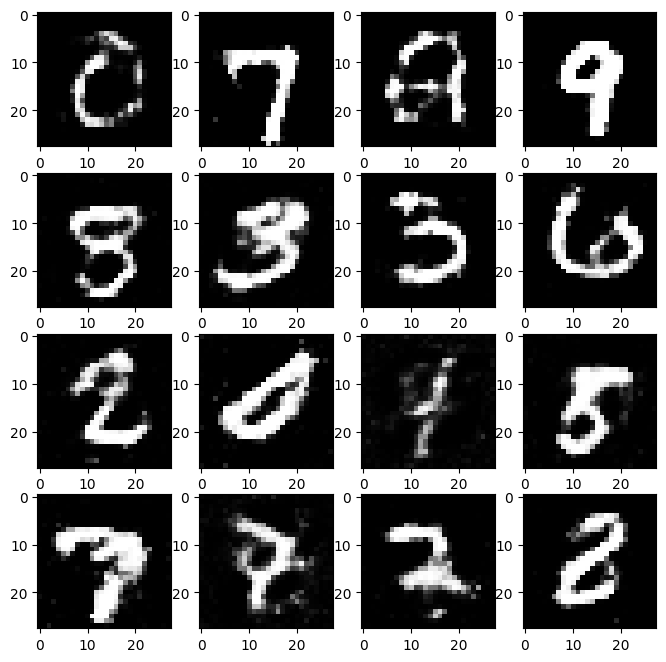

Epoch 179/200 (89.0%):
[0/60032] (0.0%)
D Error: 0.5838 G Error: 0.8808
D Real: 0.3582 D Fake: -0.3916
D_TP: 38.0000, D_FN: 90.0000, D_FP: 9.0000, D_TN: 119.0000, D_TPR: 0.2969, D_FPR: 0.0703


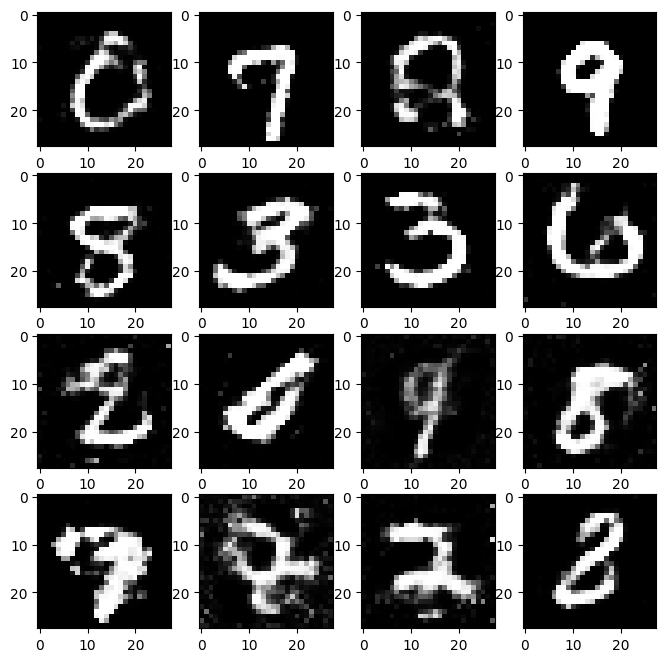

Epoch 180/200 (89.5%):
[0/60032] (0.0%)
D Error: 0.6335 G Error: 0.9628
D Real: 0.3225 D Fake: -0.2790
D_TP: 37.0000, D_FN: 91.0000, D_FP: 15.0000, D_TN: 113.0000, D_TPR: 0.2891, D_FPR: 0.1172


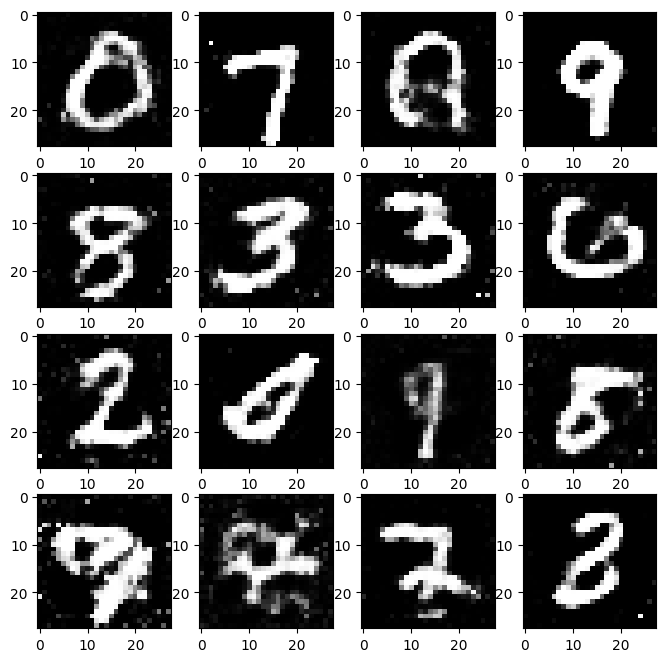

Epoch 181/200 (90.0%):
[0/60032] (0.0%)
D Error: 0.6082 G Error: 0.8405
D Real: 0.4293 D Fake: -0.1909
D_TP: 39.0000, D_FN: 89.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.3047, D_FPR: 0.0938


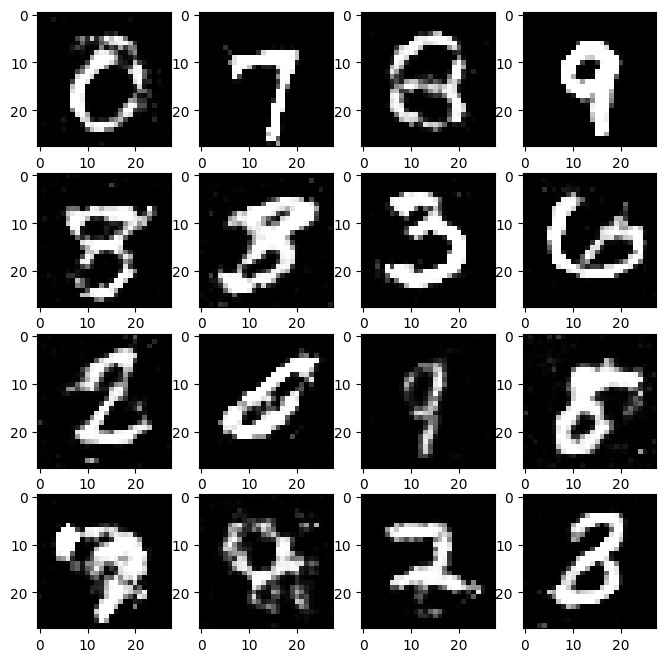

Epoch 182/200 (90.5%):
[0/60032] (0.0%)
D Error: 0.6614 G Error: 0.8110
D Real: 0.3032 D Fake: -0.0856
D_TP: 42.0000, D_FN: 86.0000, D_FP: 26.0000, D_TN: 102.0000, D_TPR: 0.3281, D_FPR: 0.2031


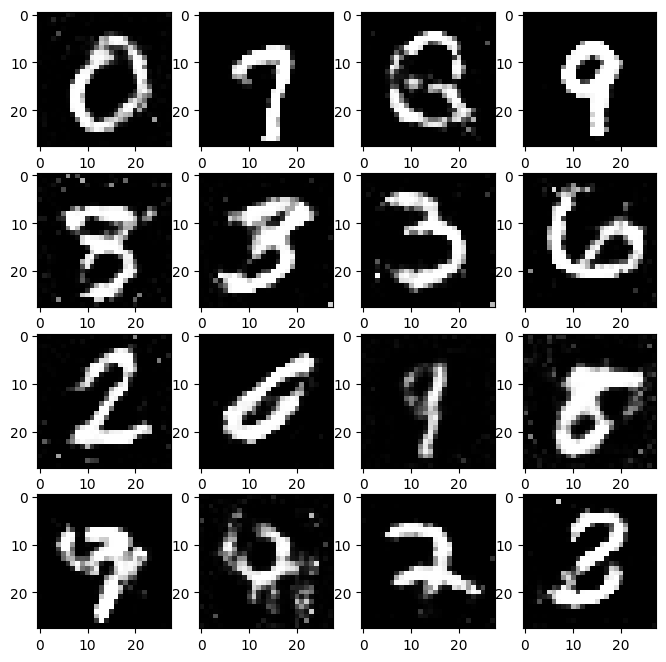

Epoch 183/200 (91.0%):
[0/60032] (0.0%)
D Error: 0.6265 G Error: 0.9090
D Real: 0.2437 D Fake: -0.3490
D_TP: 33.0000, D_FN: 95.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.2578, D_FPR: 0.1094


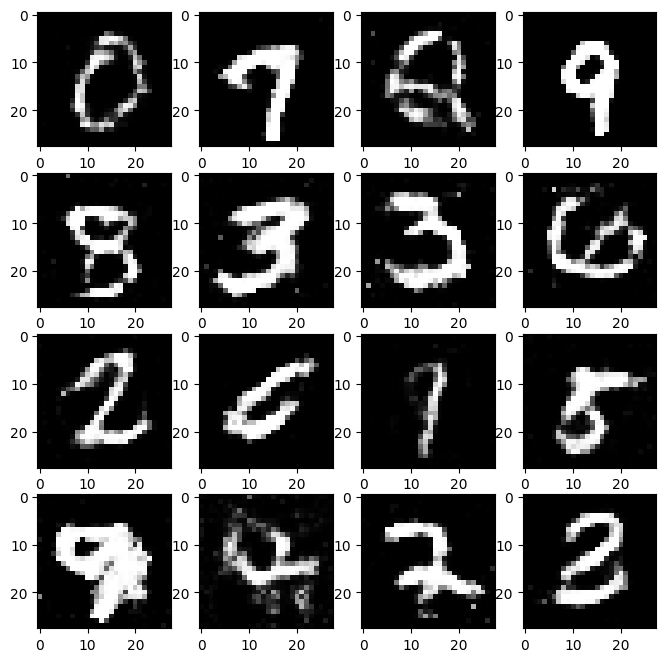

Epoch 184/200 (91.5%):
[0/60032] (0.0%)
D Error: 0.6289 G Error: 0.7787
D Real: 0.2617 D Fake: -0.1682
D_TP: 27.0000, D_FN: 101.0000, D_FP: 8.0000, D_TN: 120.0000, D_TPR: 0.2109, D_FPR: 0.0625


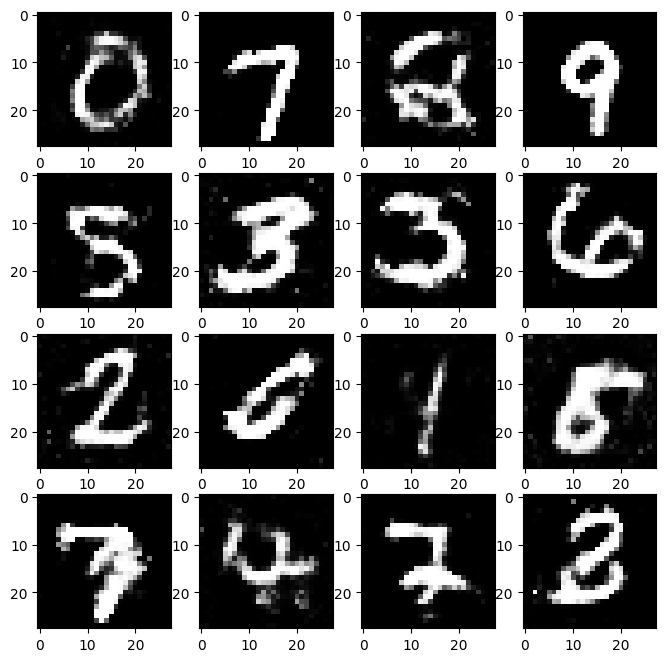

Epoch 185/200 (92.0%):
[0/60032] (0.0%)
D Error: 0.6744 G Error: 0.8219
D Real: 0.4866 D Fake: 0.0532
D_TP: 42.0000, D_FN: 86.0000, D_FP: 21.0000, D_TN: 107.0000, D_TPR: 0.3281, D_FPR: 0.1641


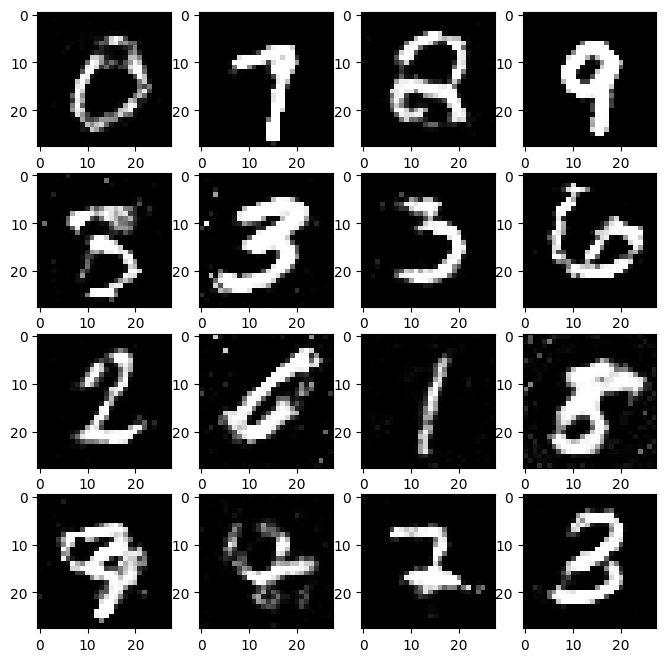

Epoch 186/200 (92.5%):
[0/60032] (0.0%)
D Error: 0.6236 G Error: 0.8927
D Real: 0.2810 D Fake: -0.2564
D_TP: 30.0000, D_FN: 98.0000, D_FP: 12.0000, D_TN: 116.0000, D_TPR: 0.2344, D_FPR: 0.0938


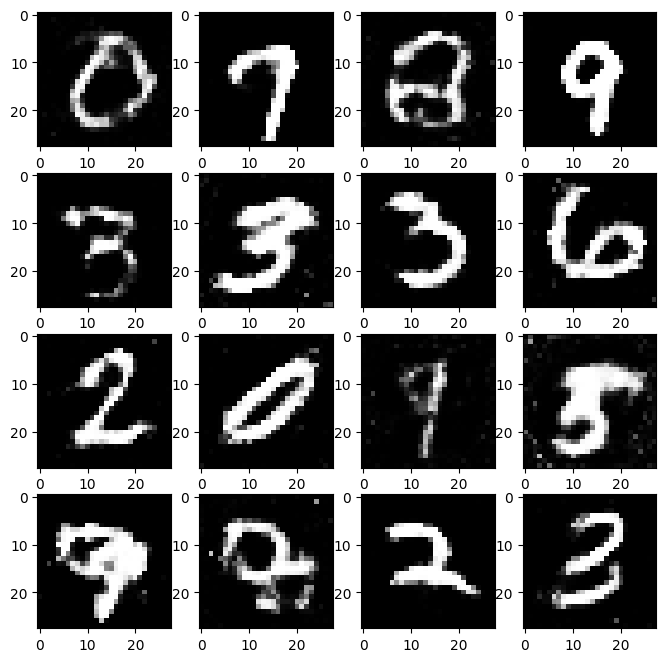

Epoch 187/200 (93.0%):
[0/60032] (0.0%)
D Error: 0.6430 G Error: 0.9415
D Real: 0.2227 D Fake: -0.3270
D_TP: 33.0000, D_FN: 95.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.2578, D_FPR: 0.1094


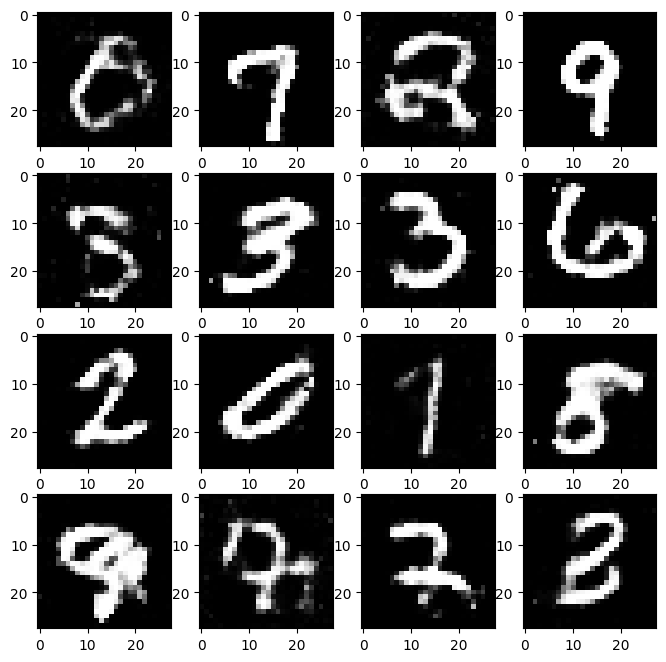

Epoch 188/200 (93.5%):
[0/60032] (0.0%)
D Error: 0.6083 G Error: 0.8453
D Real: 0.2788 D Fake: -0.4080
D_TP: 23.0000, D_FN: 105.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.1797, D_FPR: 0.1094


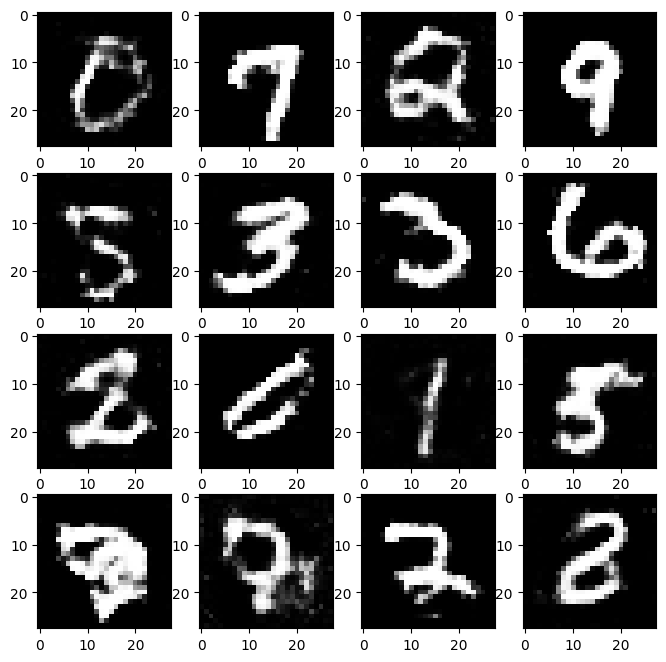

Epoch 189/200 (94.0%):
[0/60032] (0.0%)
D Error: 0.6961 G Error: 0.7682
D Real: 0.2392 D Fake: 0.0056
D_TP: 33.0000, D_FN: 95.0000, D_FP: 22.0000, D_TN: 106.0000, D_TPR: 0.2578, D_FPR: 0.1719


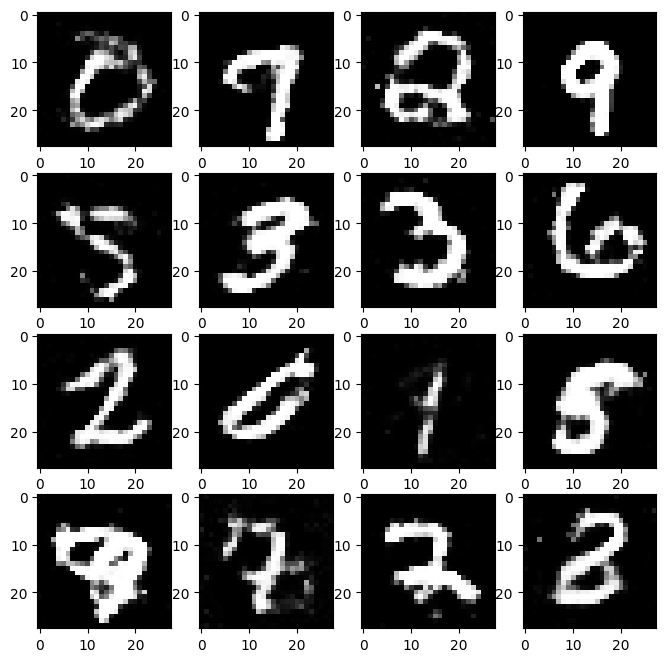

Epoch 190/200 (94.5%):
[0/60032] (0.0%)
D Error: 0.6040 G Error: 0.9872
D Real: 0.4441 D Fake: -0.3198
D_TP: 31.0000, D_FN: 97.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.2422, D_FPR: 0.0859


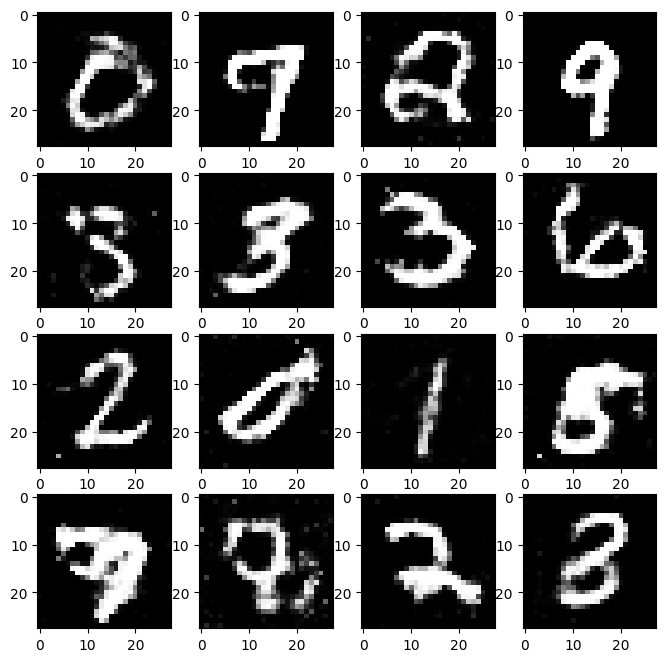

Epoch 191/200 (95.0%):
[0/60032] (0.0%)
D Error: 0.6503 G Error: 0.8971
D Real: 0.0941 D Fake: -0.2942
D_TP: 21.0000, D_FN: 107.0000, D_FP: 8.0000, D_TN: 120.0000, D_TPR: 0.1641, D_FPR: 0.0625


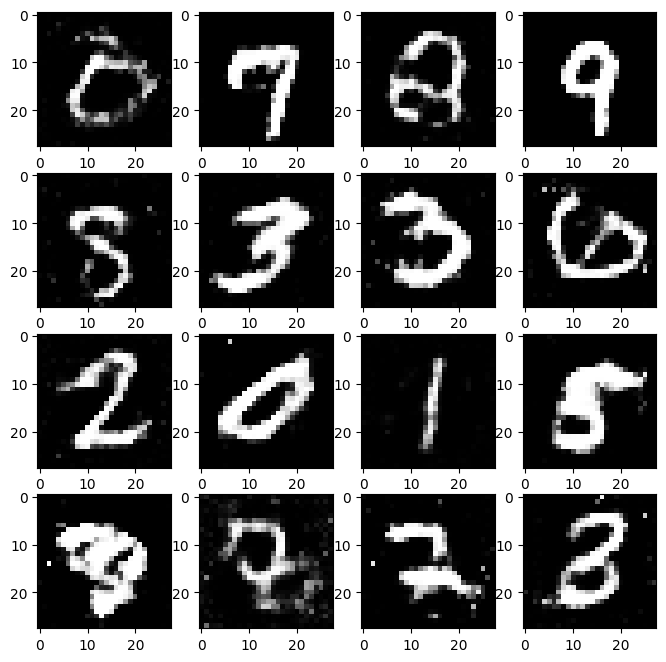

Epoch 192/200 (95.5%):
[0/60032] (0.0%)
D Error: 0.6361 G Error: 1.1308
D Real: 0.3254 D Fake: -0.3261
D_TP: 34.0000, D_FN: 94.0000, D_FP: 18.0000, D_TN: 110.0000, D_TPR: 0.2656, D_FPR: 0.1406


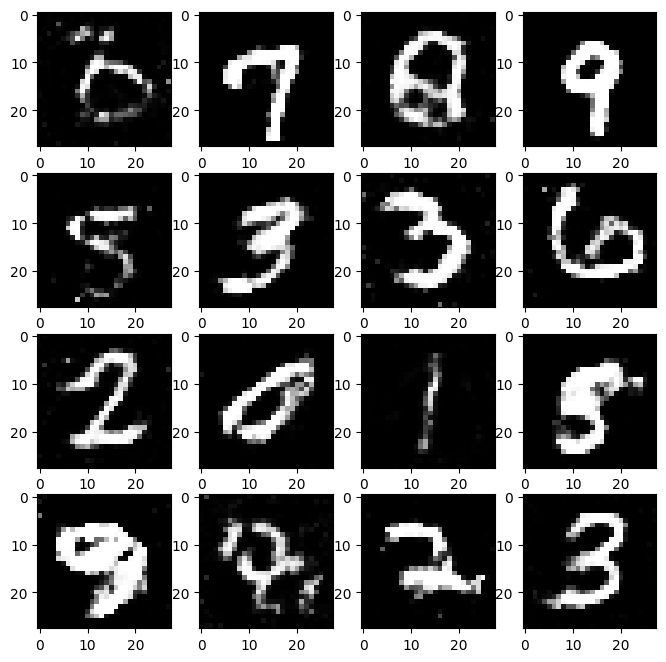

Epoch 193/200 (96.0%):
[0/60032] (0.0%)
D Error: 0.6369 G Error: 0.8938
D Real: 0.0855 D Fake: -0.3087
D_TP: 24.0000, D_FN: 104.0000, D_FP: 11.0000, D_TN: 117.0000, D_TPR: 0.1875, D_FPR: 0.0859


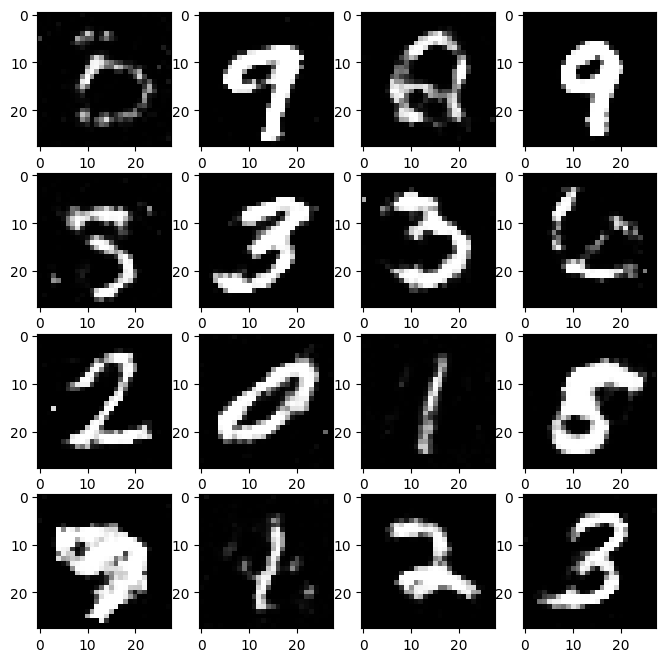

Epoch 194/200 (96.5%):
[0/60032] (0.0%)
D Error: 0.6942 G Error: 0.9431
D Real: 0.1192 D Fake: -0.1212
D_TP: 29.0000, D_FN: 99.0000, D_FP: 20.0000, D_TN: 108.0000, D_TPR: 0.2266, D_FPR: 0.1562


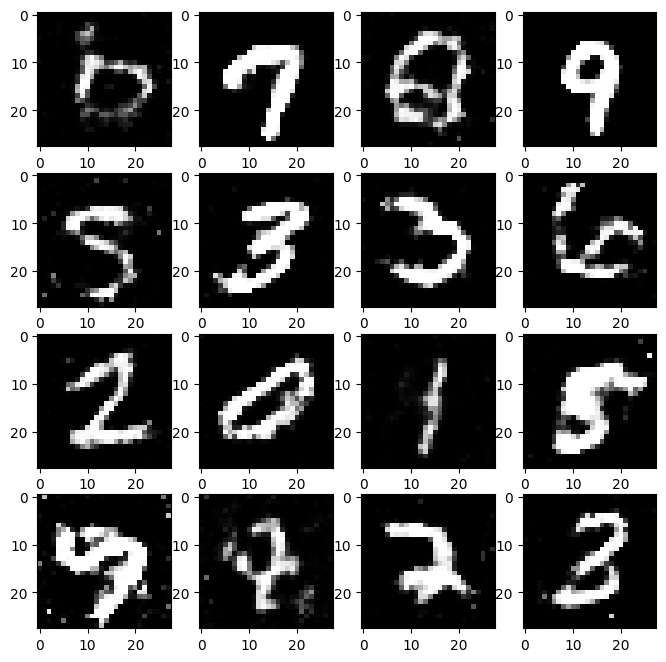

Epoch 195/200 (97.0%):
[0/60032] (0.0%)
D Error: 0.6737 G Error: 0.8555
D Real: 0.1076 D Fake: -0.2118
D_TP: 33.0000, D_FN: 95.0000, D_FP: 13.0000, D_TN: 115.0000, D_TPR: 0.2578, D_FPR: 0.1016


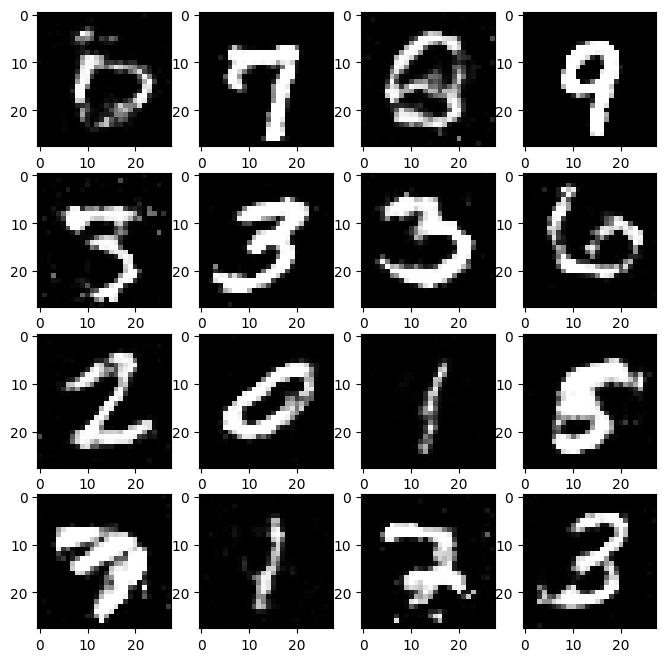

Epoch 196/200 (97.5%):
[0/60032] (0.0%)
D Error: 0.6511 G Error: 0.8154
D Real: 0.2800 D Fake: -0.1531
D_TP: 32.0000, D_FN: 96.0000, D_FP: 21.0000, D_TN: 107.0000, D_TPR: 0.2500, D_FPR: 0.1641


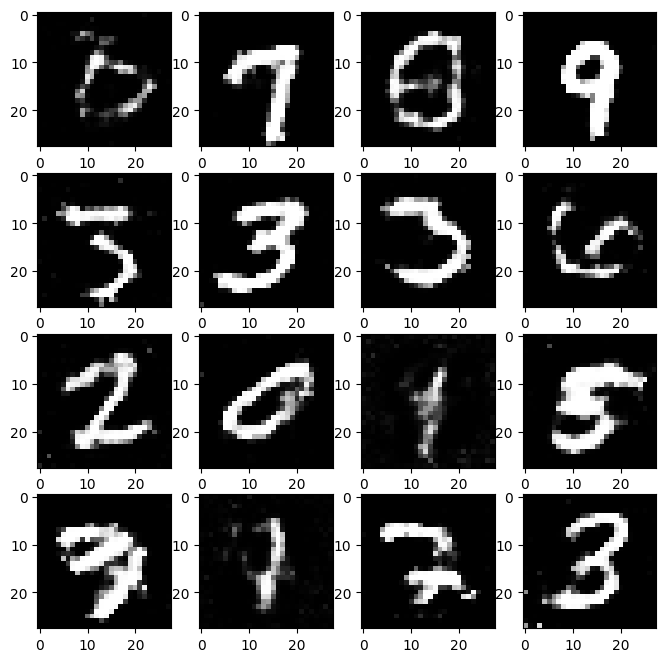

Epoch 197/200 (98.0%):
[0/60032] (0.0%)
D Error: 0.6760 G Error: 0.8485
D Real: 0.1609 D Fake: -0.2212
D_TP: 29.0000, D_FN: 99.0000, D_FP: 20.0000, D_TN: 108.0000, D_TPR: 0.2266, D_FPR: 0.1562


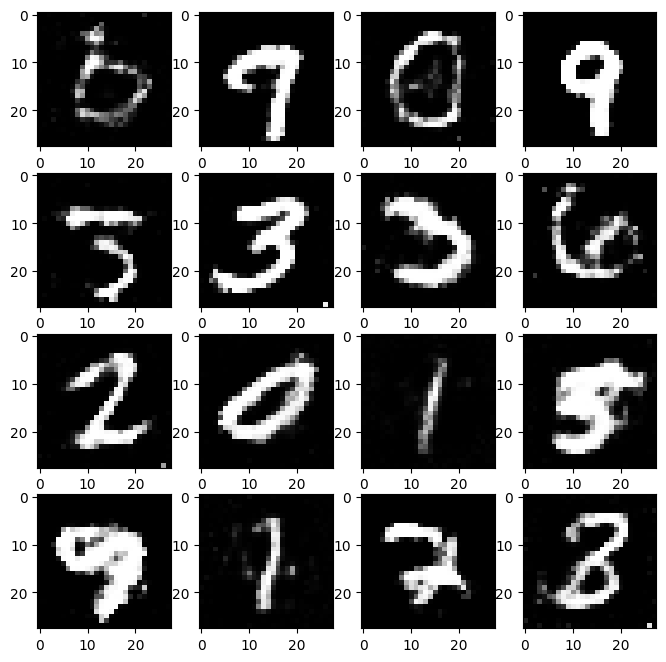

Epoch 198/200 (98.5%):
[0/60032] (0.0%)
D Error: 0.6406 G Error: 1.0013
D Real: 0.3078 D Fake: -0.2800
D_TP: 32.0000, D_FN: 96.0000, D_FP: 14.0000, D_TN: 114.0000, D_TPR: 0.2500, D_FPR: 0.1094


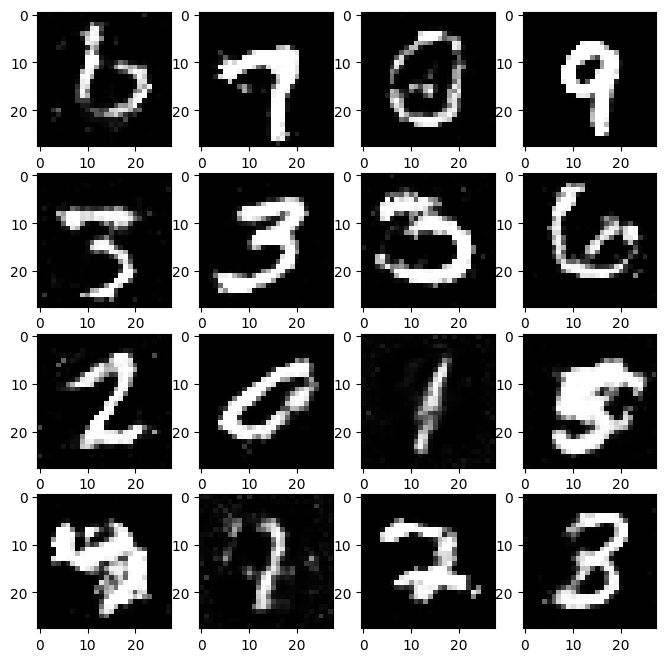

Epoch 199/200 (99.0%):
[0/60032] (0.0%)
D Error: 0.7120 G Error: 0.8763
D Real: -0.1100 D Fake: -0.2247
D_TP: 16.0000, D_FN: 112.0000, D_FP: 16.0000, D_TN: 112.0000, D_TPR: 0.1250, D_FPR: 0.1250


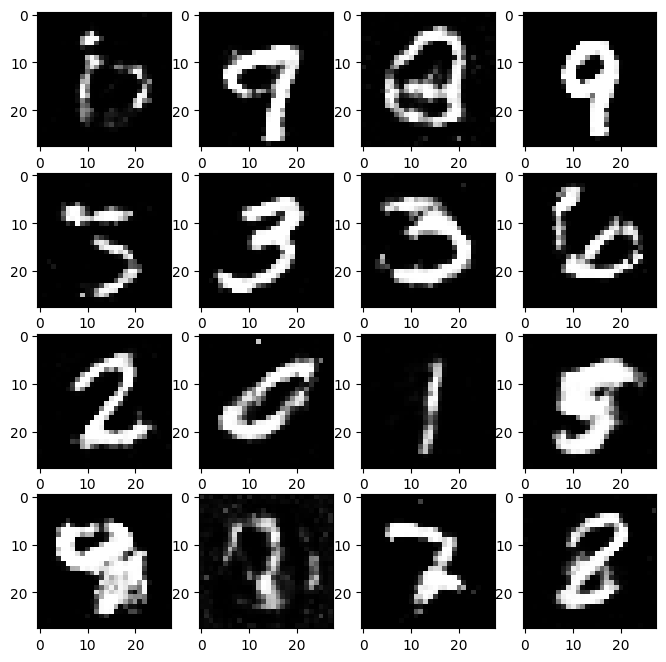

Epoch 200/200 (99.5%):
[0/60032] (0.0%)
D Error: 0.6750 G Error: 0.8800
D Real: 0.1893 D Fake: -0.1886
D_TP: 23.0000, D_FN: 105.0000, D_FP: 19.0000, D_TN: 109.0000, D_TPR: 0.1797, D_FPR: 0.1484


In [ ]:
for epoch in range(EPOCHS):
    for batch_idx, (batch, _) in enumerate(data_loader):
        # === Train D ===
        real_data = imgs_to_vec(batch)
        #input random signal to generator to generate fake images
        fake_data = generator(noise(real_data.size(0)).to(device)).detach()
        d_loss, d_pred_real, d_pred_fake, TP, FN, FP, TN, TPR, FPR = train_discriminator(discriminator, d_optimizer, loss, real_data, fake_data)
        # === Train G ===
        fake_data = generator(noise(real_data.size(0)).to(device))
        g_loss = train_generator(discriminator, g_optimizer, loss, fake_data)
        # === Logging ===
        #log(d_error, g_error, epoch, batch_idx, len(data_loader))


        if (batch_idx % DISPLAY_EVERY) == 0:
            test_images = vec_to_imgs(generator(noise_for_img_display)).data.cpu()
            display_images(test_images)
            d_losses.append(d_loss.item())
            g_losses.append(g_loss.item())
            real_scores.append(d_pred_real.mean().item())
            fake_scores.append(d_pred_fake.mean().item())
            TPs.append(TP.item())
            FNs.append(FN.item())
            FPs.append(FP.item())
            TNs.append(TN.item())
            TPRs.append(TPR.item())
            FPRs.append(FPR.item())
            # Logging
            display_logs(epoch, EPOCHS, batch_idx, NUM_BATCHES, d_loss, g_loss, d_pred_real, d_pred_fake, TPs, FNs, FPs, TNs, TPRs, FPRs)

In the beginning, the generator is lousy, so the loss is big (Recall that we compare the prediction of discriminator identifying the fake images generated by the generator, with the true labels). As the generator learns, it is able to generate images closer to the mnist, hence the loss converges to 0.5.

As for the discriminator, in the beginning, it is really easy for the discriminator to identify between fake images and real images because the generator is so lousy, hence the small loss. However, as the generator improves, it is harder for the discriminator to classify between fake and real images, hence the loss converge to 0.5.

Text(0.5, 1.0, 'Losses')

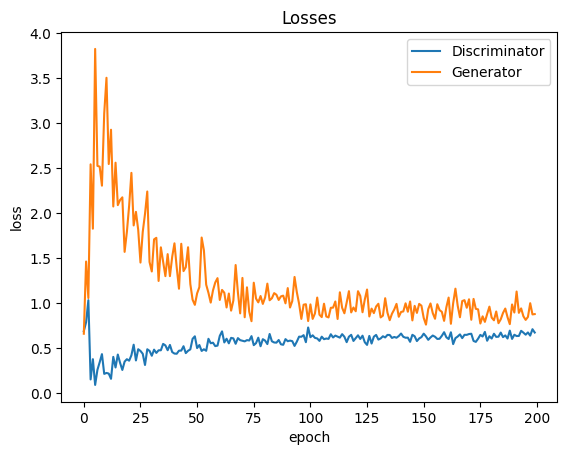

In [ ]:
plt.plot(d_losses, '-') # blue line in the figure, one point for each sample batch.
plt.plot(g_losses, '-') # orange line in the figure, one point for each sample batch.
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses')

Real score is the rolling average of the prediction of the discrimnator when inputing real images, and likewise for fake score when inputting fake images into the discriminator.

In the beginning, the discriminator is outputting a vector close to one for real images and a vector close to zero for fake images. This is because in the beginning the fake images are really lousy and the discrriminator can quickly train to discern them from real images. As the generator learns and is able to produce more realistic mnist images, the discriminator finds it hard to classify real and fake images and outputs a vector close to 0.5 for both real and fake images respectively.

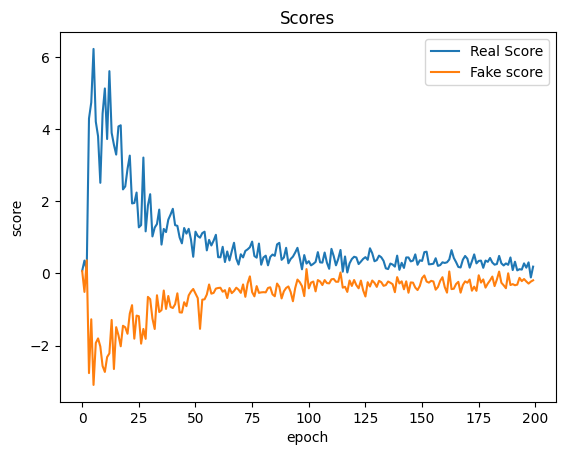

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real Score', 'Fake score'])
plt.title('Scores');

True positive is the number of real images having possibility of >= 0.5 being real.  False negative is the number of real images having possibility of < 0.5 being real. False positive is the number of fake images having possibility of >= 0.5 being real.  True negative is the number of fake images having possibility of < 0.5 being real.

Text(0.5, 1.0, 'Performance Indices over Epochs')

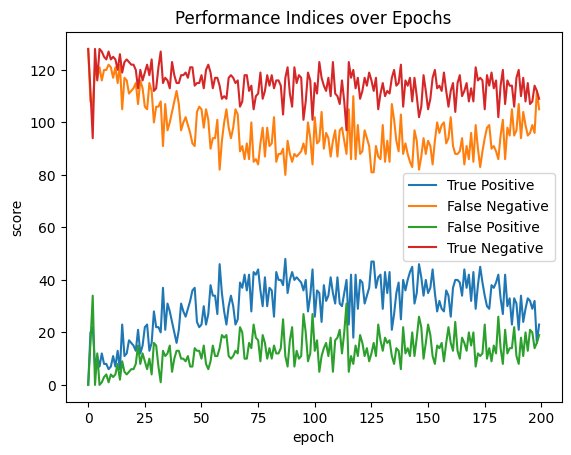

In [ ]:
plt.plot(TPs, '-')
plt.plot(FNs, '-')
plt.plot(FPs, '-')
plt.plot(TNs, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['True Positive ', 'False Negative', 'False Positive', 'True Negative'])
plt.title('Performance Indices over Epochs')


The true positive rate (TPR, also called sensitivity) is calculated as TP/TP+FN. TPR is the probability that an actual positive will test positive.

The true negative rate (also called specificity), which is the probability that an actual negative will test negative. It is calculated as TN/TN+FP.

Text(0.5, 1.0, 'TPR/FPR')

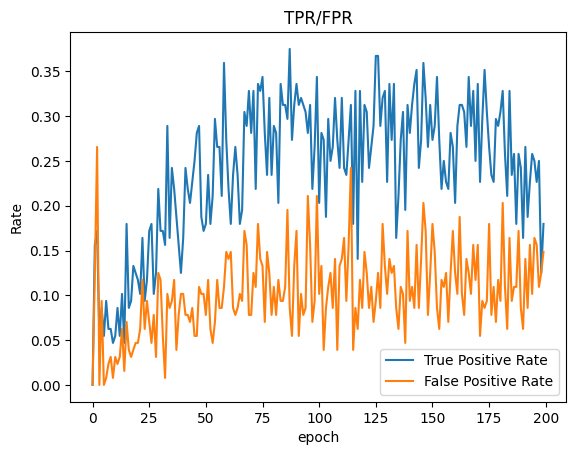

In [ ]:
plt.plot(TPRs, '-')
plt.plot(FPRs, '-')
plt.xlabel('epoch')
plt.ylabel('Rate')
plt.legend(['True Positive Rate ', 'False Positive Rate'])
plt.title('TPR/FPR')

In [ ]:
print("Notebook finishes running in: {:.4f} hours".format((time.time() - start_time)/3600))

Notebook finishes running in: 24.0852 hours
